# Online Gradient Descent Based Portfolio Optimizer


This notebook extends upon Week 9's notebook by incorporating some ideas we talked about during the latest check in, such as running gradient descent over hyperparameters.

In [16]:
import torch
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import yfinance as yf
from datetime import datetime
import numpy as np
import seaborn as sns
import wrds
import sys
sys.path.append('../src')
from OnlinePortfolioOptimizer import OnlinePortfolioOptimizer
import warnings
from skopt.space import Real, Integer
from skopt import gp_minimize
from skopt.utils import use_named_args
from sklearn.metrics import mean_squared_error

conn = wrds.Connection()


plt.style.use('seaborn-v0_8-notebook')
eps = 1e-8
mpl.rcParams['axes.titlesize'] = 16
mpl.rcParams['axes.labelsize'] = 16
mpl.rcParams['xtick.labelsize'] = 12
mpl.rcParams['ytick.labelsize'] = 12
mpl.rcParams['legend.fontsize'] = 12
mpl.rcParams['figure.figsize'] = [10, 6]
mpl.rcParams['figure.dpi'] = 100
mpl.rcParams['savefig.dpi'] = 100
mpl.rcParams['figure.autolayout'] = True
mpl.rcParams["animation.html"] = "jshtml"
from IPython.display import display, clear_output


Loading library list...
Done


In [3]:
# Define the Magnificent 7 tickers
tickers = [
    # Technology & AI
    "AAPL", "MSFT", "NVDA", "GOOGL", "AMZN", "META", "AVGO", "ORCL", "IBM", "CSCO",

    # Financials & Banking
    "JPM", "V", "MA", "GS", "MS", "BAC", "C", "AXP", "SCHW",

    # Healthcare & Pharma
    "UNH", "JNJ", "LLY", "PFE", "MRNA", "BMY", "GILD", "CVS", "VRTX", "ISRG",

    # Consumer Goods & Retail
    "WMT", "NKE", "PG", "TGT", "COST", "KO", "PEP", "MCD", "SBUX", "YUM",

    # Energy & Utilities
    "XOM", "CVX", "NEE", "DUK", "SO", "D", "ENB", "SLB", "EOG", "PSX",

    # Industrials & Defense
    "DE", "LMT", "RTX", "BA", "CAT", "GE", "HON", "UPS", "EMR", "NOC",

    # Real Estate & Infrastructure
    "PLD", "AMT", "EQIX", "O", "SPG", "VICI", "DLR", "WY", "EQR", "PSA",

    # Transportation & Automotive
    "TSLA", "FDX", "UPS", "GM", "F", "RIVN", "NIO", "CSX", "UNP", "DAL",

    # Semiconductors
    "TSM", "ASML", "AMD", "TXN", "INTC", "MU", "QCOM", "LRCX", "NXPI", "ADI",

    # Agriculture & Food
    "ADM", "BG", "CF", "TSN", "MOS", "FMC", "CAG", "SYY", "HRL", "MDLZ",

    # Entertainment & Media
    "NFLX", "DIS", "PARA", "WBD", "CMCSA", "SPOT", "LYV", "TTWO", "EA",

    # Meme Stocks
    "GME", "AMC"
]

# Fetch historical price data for 2022-2023 (training period)
train_start_date = "2022-01-01"
train_end_date = "2023-12-31"

# Fetch historical price data for 2024 (testing period)
# test_start_date = "2024-01-01"
# test_end_date = datetime.now().strftime("%Y-%m-%d")  # Today's date

# print(f"Training period: {train_start_date} to {train_end_date}")
# print(f"Testing period: {test_start_date} to {test_end_date}")


## CRSP

In [4]:
import wrds
conn = wrds.Connection()

Loading library list...
Done


In [4]:
def get_stock_data(ticker, start, end):
    permno = conn.raw_sql(
        f"""
        SELECT DISTINCT permno 
        FROM crsp.msenames
        WHERE ticker = '{ticker}'
    """
    )
    if len(permno) == 0:
        return None
    permno = permno['permno'].values[0]

    stock_data = conn.raw_sql(
        f"""
        SELECT permno, date, prc, ret
        FROM crsp.dsf
        WHERE permno = {permno}
        AND date BETWEEN '{start}' AND '{end}'
    """,
        date_cols=['date']
    )

    stock_data['ticker'] = ticker
    return stock_data

get_stock_data('AAPL', '2007-01-01', '2023-01-01')


,permno,date,prc,ret,ticker
0,14593,2007-01-03,83.8,-0.012258,AAPL
1,14593,2007-01-04,85.66,0.022196,AAPL
2,14593,2007-01-05,85.05,-0.007121,AAPL
3,14593,2007-01-08,85.47,0.004938,AAPL
4,14593,2007-01-09,92.57,0.08307,AAPL
...,...,...,...,...,...
4023,14593,2022-12-23,131.86,-0.002798,AAPL
4024,14593,2022-12-27,130.03,-0.013878,AAPL
4025,14593,2022-12-28,126.04,-0.030685,AAPL
4026,14593,2022-12-29,129.61,0.028324,AAPL


In [5]:
tickers = [
    "AAPL", "MSFT", "NVDA", "GOOGL", "AMZN", "META", "AVGO", "ORCL", "IBM", "CSCO",
    "JPM", "V", "MA", "GS", "MS", "BAC", "C", "AXP", "SCHW",
    "UNH", "JNJ", "LLY", "PFE", "MRNA", "BMY", "GILD", "CVS", "VRTX", "ISRG",
    "WMT", "NKE", "PG", "TGT", "COST", "KO", "PEP", "MCD", "SBUX", "YUM",
    "XOM", "CVX", "NEE", "DUK", "SO", "D", "ENB", "SLB", "EOG", "PSX",
    "DE", "LMT", "RTX", "BA", "CAT", "GE", "HON", "UPS", "EMR", "NOC",
    "PLD", "AMT", "EQIX", "O", "SPG", "VICI", "DLR", "WY", "EQR", "PSA",
    "TSLA", "FDX", "UPS", "GM", "F", "RIVN", "NIO", "CSX", "UNP", "DAL",
    "TSM", "ASML", "AMD", "TXN", "INTC", "MU", "QCOM", "LRCX", "NXPI", "ADI",
    "ADM", "BG", "CF", "TSN", "MOS", "FMC", "CAG", "SYY", "HRL", "MDLZ",
    "NFLX", "DIS", "PARA", "WBD", "CMCSA", "SPOT", "LYV", "TTWO", "EA",
    "GME", "AMC"
]

start = "2007-01-01"
end = "2023-01-01"
stock_data = pd.DataFrame()
for i, ticker in enumerate(tickers):
    data = get_stock_data(ticker, start, end)
    stock_data = pd.concat([stock_data, data], ignore_index=True)
stock_data['date'] = pd.to_datetime(stock_data['date'])
stock_data = stock_data.set_index('date')
stock_data

/var/folders/sp/cw_2m19j25xbvgpdjz48gclh0000gn/T/ipykernel_14976/3528983945.py:21: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  stock_data = pd.concat([stock_data, data], ignore_index=True)
/var/folders/sp/cw_2m19j25xbvgpdjz48gclh0000gn/T/ipykernel_14976/3528983945.py:21: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  stock_data = pd.concat([stock_data, data], ignore_index=True)
/var/folders/sp/cw_2m19j25xbvgpdjz48gclh0000gn/T/ipykernel_14976/3528983945.py:21: FutureWarning: The behavior of Data

,permno,prc,ret,ticker
date,,,,
2007-01-03,14593,83.8,-0.012258,AAPL
2007-01-04,14593,85.66,0.022196,AAPL
2007-01-05,14593,85.05,-0.007121,AAPL
2007-01-08,14593,85.47,0.004938,AAPL
2007-01-09,14593,92.57,0.08307,AAPL
...,...,...,...,...
2007-02-01,90379,53.77,0.005799,GME
2007-02-02,90379,53.75,-0.000372,GME
2007-02-05,90379,52.98,-0.014326,GME


## EDA

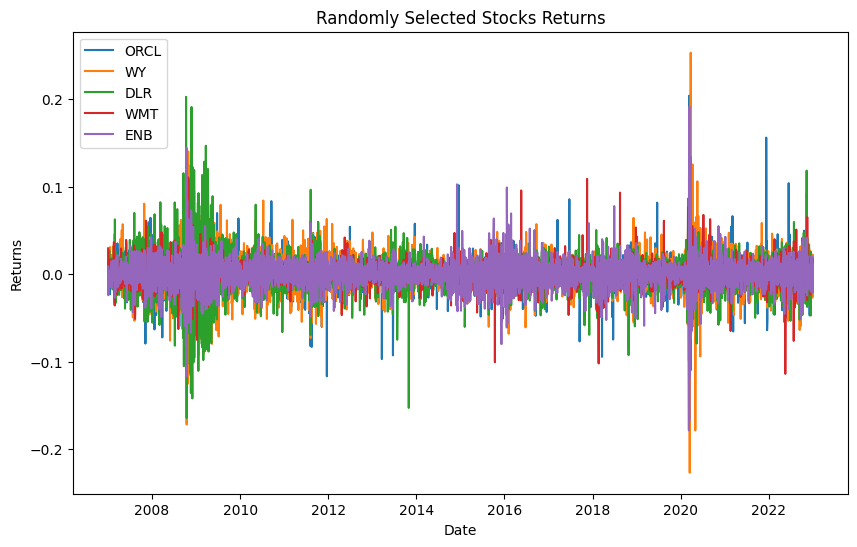

In [10]:
rand_choice = np.random.choice(tickers, size=5, replace=False)

fig, ax = plt.subplots(1, 1, figsize = (10, 6))
for ticker in rand_choice:
    data = stock_data[stock_data['ticker'] == ticker]
    ax.plot(data.index, data['ret'], label=ticker)

ax.set_title('Randomly Selected Stocks Returns')
ax.set_xlabel('Date')
ax.set_ylabel('Returns')
ax.legend()
plt.show()

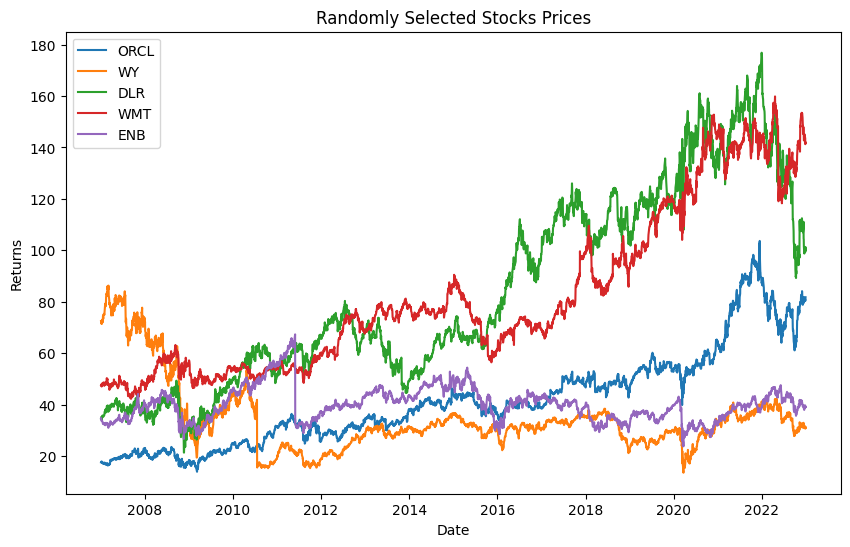

In [11]:
fig, ax = plt.subplots(1, 1, figsize = (10, 6))
for ticker in rand_choice:
    data = stock_data[stock_data['ticker'] == ticker]
    ax.plot(data.index, data['prc'], label=ticker)

ax.set_title('Randomly Selected Stocks Prices')
ax.set_xlabel('Date')
ax.set_ylabel('Returns')
ax.legend()
plt.show()

We backtest an equal-weighted portfolio of 10 randomly chosen stocks at the start of 2007, for fun.

In [12]:
stock_data

,permno,prc,ret,ticker
date,,,,
2007-01-03,14593,83.8,-0.012258,AAPL
2007-01-04,14593,85.66,0.022196,AAPL
2007-01-05,14593,85.05,-0.007121,AAPL
2007-01-08,14593,85.47,0.004938,AAPL
2007-01-09,14593,92.57,0.08307,AAPL
...,...,...,...,...
2007-02-01,90379,53.77,0.005799,GME
2007-02-02,90379,53.75,-0.000372,GME
2007-02-05,90379,52.98,-0.014326,GME


In [6]:
returns = stock_data.pivot_table(
    index = ['date'],
    columns = ['ticker'],
    values = ['ret'],
    fill_value = 0
)
returns

ret                                                    \
ticker          AAPL       ADI       ADM       AMD       AMT      AMZN   
date                                                                     
2007-01-03 -0.012258 -0.000913  0.003129 -0.040786  0.019313  -0.01926   
2007-01-04  0.022196  0.017357 -0.005615  0.013832 -0.003947  0.005168   
2007-01-05 -0.007121 -0.011374 -0.001568 -0.004043 -0.008719 -0.013625   
2007-01-08  0.004938  0.007872  0.005027 -0.012177  0.028518 -0.022674   
2007-01-09   0.08307 -0.001502 -0.024383  0.009245  0.014512  0.007467   
...              ...       ...       ...       ...       ...       ...   
2022-12-23 -0.002798   0.00055  0.012087  0.010335  0.008784  0.017425   
2022-12-27 -0.013878  -0.01001  0.013634 -0.019374  0.000047 -0.025924   
2022-12-28 -0.030685 -0.011837 -0.023877 -0.011064 -0.003793 -0.014692   
2022-12-29  0.028324  0.023085 -0.005341   0.03596  0.026844  0.028844   
2022-12-30  0.002469  0.000305   -0.0029 -0.000771 -0.017985 -0.002138   

                                                    ...                      \
ticker          ASML       AXP        BA       BAC  ...       TXN       UNH   
date                                                ...                       
2007-01-03 -0.010556 -0.002637  0.003715 -0.001124  ... -0.008333 -0.021589   
2007-01-04  0.011079  -0.00729  0.004037  0.006375  ...  0.018908  0.006468   
2007-01-05  0.004464 -0.013184 -0.004244 -0.008012  ... -0.011684 -0.006804   
2007-01-08  0.011313  0.009471 -0.002356  0.003944  ...  0.004868  0.014653   
2007-01-09 -0.010787 -0.006366 -0.010569  0.000935  ... -0.002076 -0.012003   
...              ...       ...       ...       ...  ...       ...       ...   
2022-12-23 -0.008238  0.011768  0.004303   0.00247  ... -0.001943  0.008006   
2022-12-27 -0.025736 -0.004285  0.001798  0.001848  ...  -0.00365   0.00128   
2022-12-28 -0.010313 -0.016258 -0.005385  0.007378  ... -0.015814 -0.006654   
2022-12-29    0.0373  0.022985  0.002813  0.011291  ...  0.023761  0.002706   
2022-12-30 -0.009194  0.002919  0.008364 -0.000604  ...  0.001212  0.000566   

                                                                        \
ticker           UNP      VICI      VRTX       WBD       WMT        WY   
date                                                                     
2007-01-03  0.004999       0.0 -0.013896 -0.012923  0.029667  0.026185   
2007-01-04 -0.007353       0.0  0.002439 -0.019638  0.004837 -0.010069   
2007-01-05 -0.012418       0.0 -0.031901 -0.045652 -0.008162 -0.003205   
2007-01-08  0.001544       0.0 -0.063111  0.043768  -0.00823  0.008806   
2007-01-09  0.000551       0.0  0.009538 -0.045986  0.008298 -0.005127   
...              ...       ...       ...       ...       ...       ...   
2022-12-23  0.005991  0.014281 -0.014392       0.0  0.002021  0.014171   
2022-12-27  0.001953  0.001531 -0.008181       0.0  0.000278 -0.000635   
2022-12-28 -0.016404 -0.016198 -0.005429       0.0 -0.017523 -0.026692   
2022-12-29   0.01136  0.006834  0.011618       0.0  0.006087  0.022527   
2022-12-30 -0.010276 -0.000308 -0.001038       0.0 -0.002533 -0.010217   

                                
ticker           XOM       YUM  
date                            
2007-01-03 -0.032885   0.00102  
2007-01-04 -0.018756 -0.002718  
2007-01-05  0.007151 -0.008688  
2007-01-08 -0.008056 -0.002406  
2007-01-09 -0.007708   0.00379  
...              ...       ...  
2022-12-23  0.026445  0.000621  
2022-12-27  0.013894  0.007758  
2022-12-28 -0.016426 -0.004542  
2022-12-29  0.007566  0.005259  
2022-12-30  0.010073 -0.014694  

[4028 rows x 92 columns]

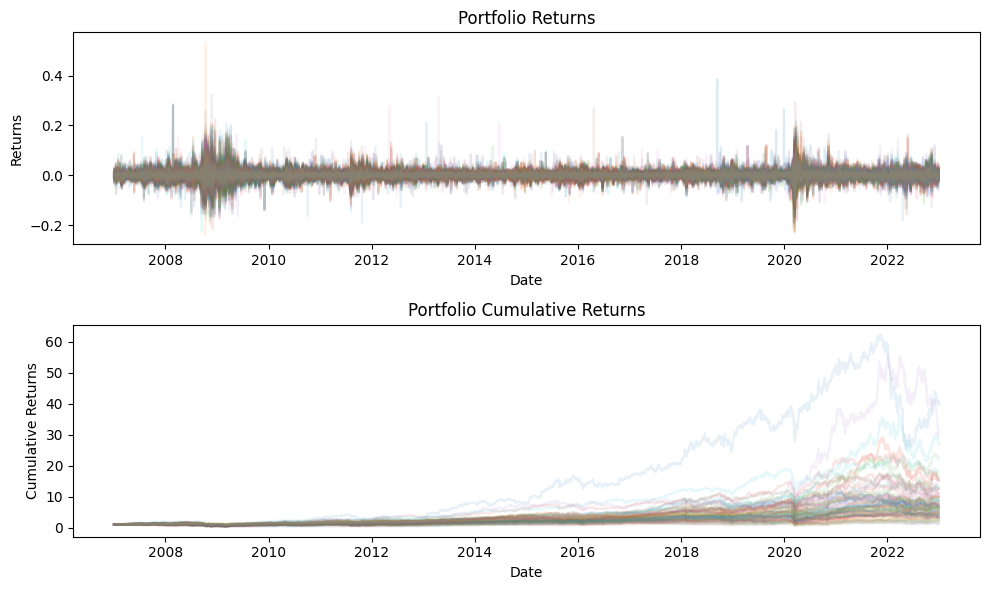

In [14]:
fig, axes = plt.subplots(2, 1, figsize = (10, 6))
n_stocks = 2
n_trials = 100


for _ in range(n_trials):
    p1_returns =[]

    rand_choice = (
        np.random.randint(0, returns.shape[1], size=n_stocks)
    )

    weights = np.zeros(returns.shape[1])
    weights[rand_choice] = 1 / n_stocks

    for date in returns.index:
        daily_returns = returns.loc[date].T
        p1_returns.append(
            np.dot(weights, daily_returns.values)
        )
    p1_returns = np.array(p1_returns)
    
    axes[0].plot(returns.index, p1_returns, alpha = 0.1,)
    axes[1].plot(returns.index, (p1_returns + 1).cumprod(), alpha = 0.1,)

axes[0].set_title('Portfolio Returns')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Returns')

axes[1].set_title('Portfolio Cumulative Returns')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Cumulative Returns')

plt.tight_layout()
plt.show()


Now we back test a portfolio where `n_stocks` are randomly selected each day. 

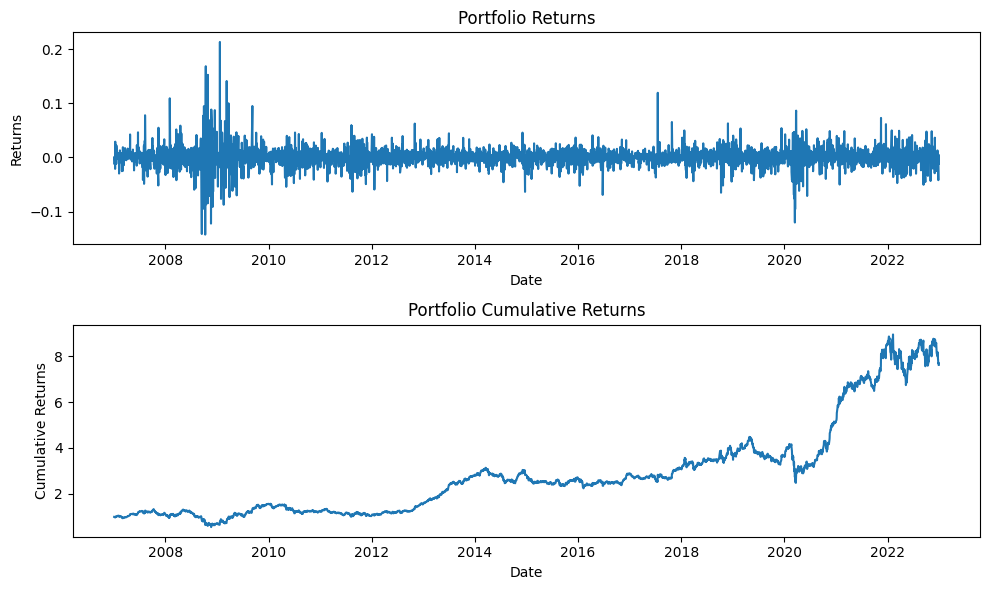

In [15]:
p2_returns = np.zeros(returns.shape[0])
n_stocks = 2

for i, date in enumerate(returns.index):
    daily_returns = returns.loc[date].T
    choice = np.random.randint(0, returns.shape[1], size=n_stocks)
    weights = np.zeros(returns.shape[1])
    weights[choice] = 1 / n_stocks

    p2_returns[i] = np.dot(weights, daily_returns.values)

fig, axes = plt.subplots(2, 1, figsize = (10, 6))
axes[0].plot(returns.index, p2_returns)
axes[0].set_title('Portfolio Returns')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Returns')

axes[1].plot(returns.index, (p2_returns + 1).cumprod())
axes[1].set_title('Portfolio Cumulative Returns')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Cumulative Returns')

plt.tight_layout()
plt.show()




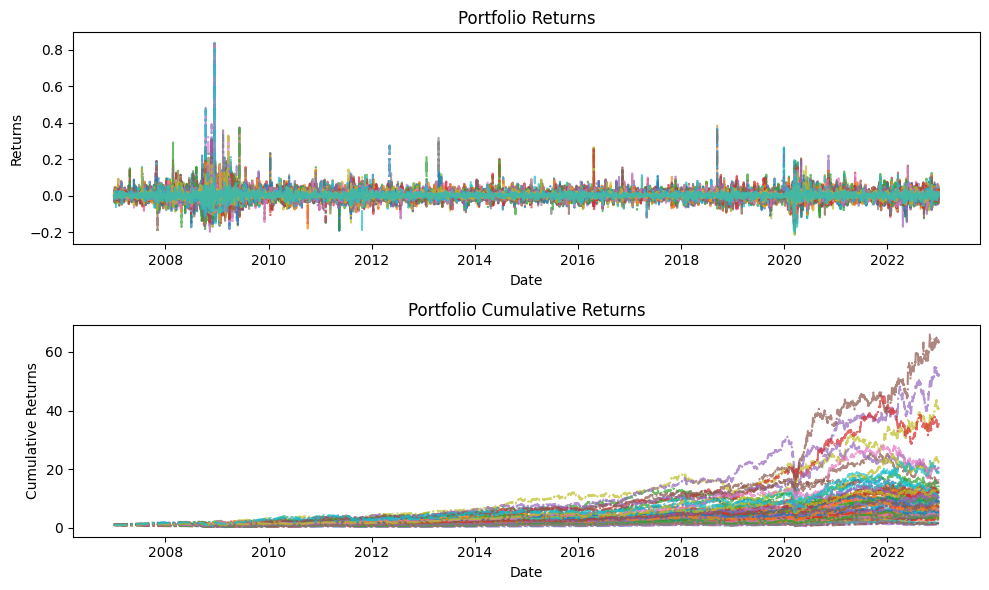

In [16]:
n_stocks = 2
n_trials = 100

fig, axes = plt.subplots(2, 1, figsize = (10, 6))
for _ in range(n_trials):
    p2_returns = np.zeros(returns.shape[0])

    for i, date in enumerate(returns.index):
        daily_returns = returns.loc[date].T
        choice = np.random.randint(0, returns.shape[1], size=n_stocks)
        weights = np.zeros(returns.shape[1])
        weights[choice] = 1 / n_stocks

        p2_returns[i] = np.dot(weights, daily_returns.values)

    axes[0].plot(returns.index, p2_returns, linestyle = '-.', alpha = .7)
    axes[1].plot(returns.index, (p2_returns + 1).cumprod(), linestyle = '-.', alpha = .7)


axes[0].set_title('Portfolio Returns')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Returns')

axes[1].set_title('Portfolio Cumulative Returns')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Cumulative Returns')

plt.tight_layout()
plt.show()




In [17]:
returns.shape[0]

4028

## Handwritten gradient descent

Previously we were working with code that didn't technically use the computational graph (gradient descent was done by hand). Through this notebook, we aim to use Torch gradient descent in a way that we can fully understand. 


We begin by constructing a portfolio where 2 random stocks are selected everyday. We run this 100 times and observe the results.

This exercise is intended to build up to the final gradient descent.

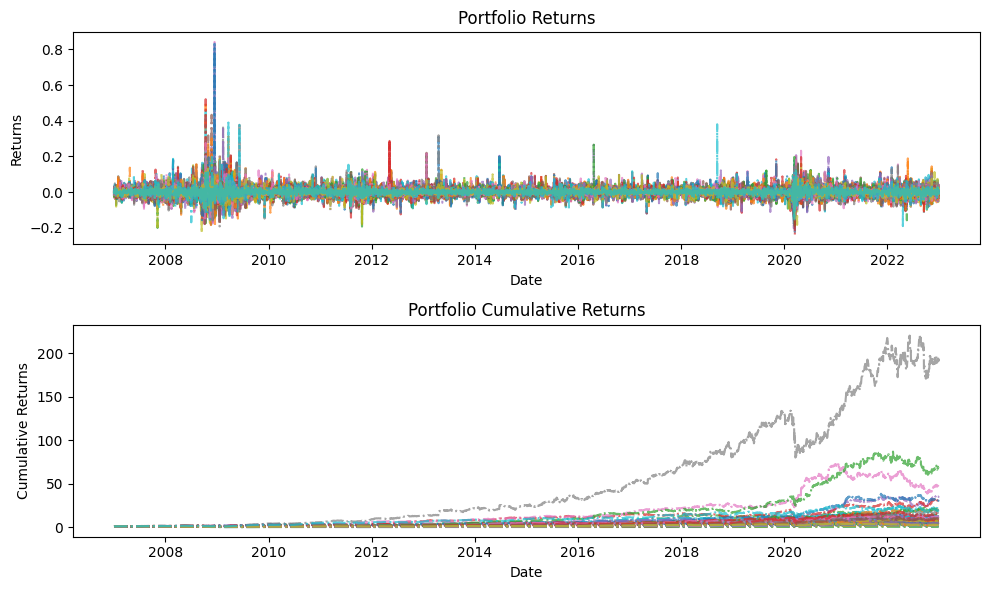

In [ ]:
n_stocks = 2
n_trials = 100

fig, axes = plt.subplots(2, 1, figsize = (10, 6))
for _ in range(n_trials):
    print(f"Running iteration {_}")
    p2_returns = torch.zeros(
        returns.shape[0], 
        dtype=torch.float32,
        requires_grad=False 
    )

    for i, date in enumerate(returns.index):
        daily_returns = returns.loc[date].T
        choice = torch.randint(
            low = 0,
            high = returns.shape[1], 
            size=(n_stocks,), 
            requires_grad=False
        )
        weights = torch.zeros(returns.shape[1], dtype=torch.float32, requires_grad=False)
        weights[choice] = 1 / n_stocks

        p2_returns[i] = torch.dot(
            weights,
            torch.tensor(daily_returns.values, dtype=torch.float32)
        )

    axes[0].plot(returns.index, p2_returns, linestyle = '-.', alpha = .7)
    axes[1].plot(returns.index, (p2_returns + 1).cumprod(dim = 0), linestyle = '-.', alpha = .7)


axes[0].set_title('Portfolio Returns')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Returns')

axes[1].set_title('Portfolio Cumulative Returns')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Cumulative Returns')

plt.tight_layout()
plt.show()




Now, we try to run gradient descent on *negative expected return*, i.e. we try to optimize expected return. We define expected return for each day to be the arithmetic mean return over the most recent period of length `window_size`. 

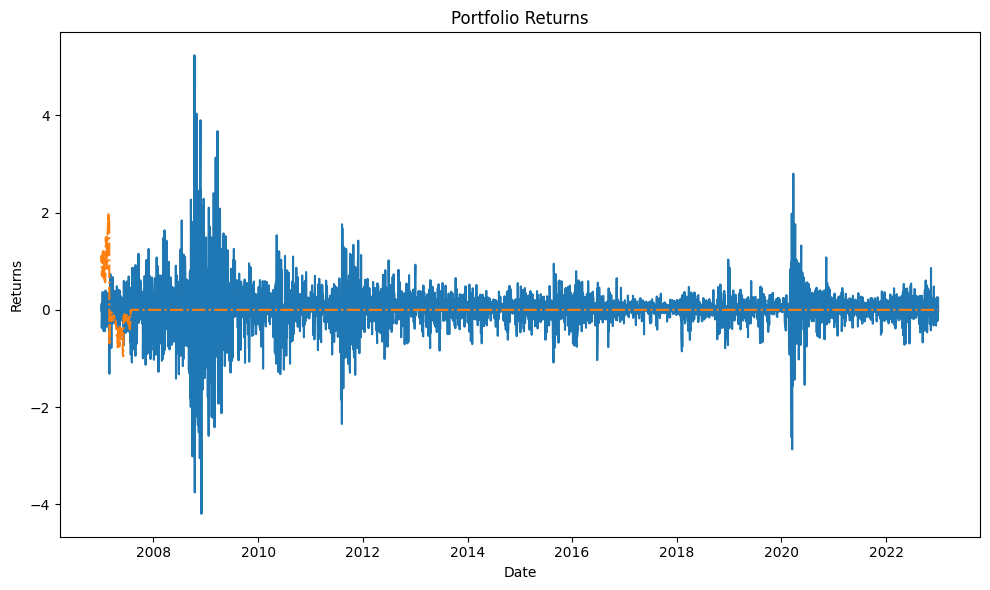

In [ ]:
train_returns = []
plot_returns = []
window_size = 10

weights = torch.rand(
    size = (returns.shape[1],), 
    requires_grad=True
)
optimizer = torch.optim.SGD([weights], lr=0.1)

for i, date in enumerate(returns.index):
    daily_returns = returns.loc[date].T
    daily_tensor = torch.tensor(daily_returns.values, dtype=torch.float32)

    ret = torch.dot(weights, daily_tensor)
    plot_returns.append(ret.detach())

    if i >= window_size:
        past_returns = []
        for j in range(max(0, i - window_size), i - 1):
            past_daily = returns.iloc[j].values
            past_ret = torch.dot(weights, torch.tensor(past_daily, dtype=torch.float32))
            past_returns.append(past_ret)

        past_returns = torch.stack(past_returns)
        expected_return = calculate_objective_func(past_returns)

        optimizer.zero_grad()
        expected_return.backward()
        optimizer.step()

plot_returns = np.asarray(plot_returns)

fig, ax = plt.subplots(1, 1, figsize = (10, 6))
ax.plot(
    returns.index, 
    plot_returns, 
    label = 'returns',
)
ax.plot(
    returns.index, 
    (plot_returns + 1).cumprod(), 
    linestyle = '-.', 
    label = 'cum returns'
)


ax.set_title('Portfolio Returns')
ax.set_xlabel('Date')
ax.set_ylabel('Returns')

plt.tight_layout()
plt.show()

So this issue is because some of our `plot_returns` are close to -1. Some values in `(plot_returns + 1).cumprod()` get close to 0 and we end up with 0 cumulative return for all subsequent periods.

This issue is solved by adding softmax.

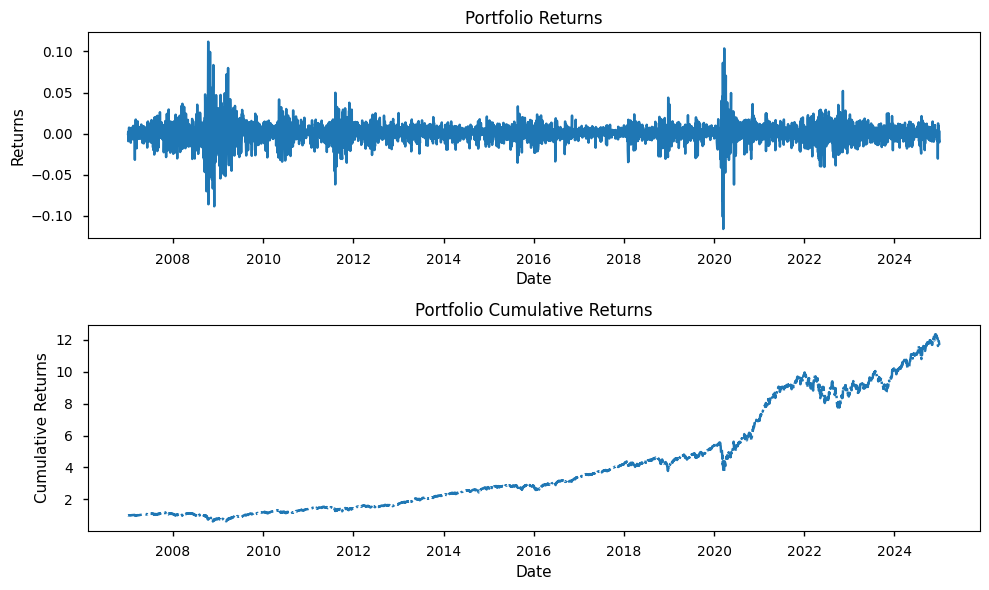

In [75]:
train_returns = []
plot_returns = []

def calculate_objective_func(past_returns):
    return torch.mean(past_returns)

weights = torch.rand(
    size = (returns.shape[1],), 
    requires_grad=True
)
optimizer = torch.optim.SGD([weights], lr=0.1)

weights_log = np.zeros((returns.shape[0], returns.shape[1]))

for i, date in enumerate(returns.index):
    normalized_weights = torch.nn.functional.softmax(weights, dim=0)
    daily_returns = returns.loc[date].T
    daily_tensor = torch.tensor(daily_returns.values, dtype=torch.float32)
    ret = torch.dot(normalized_weights, daily_tensor)
    plot_returns.append(ret.detach())

    if i >= window_size:
        past_returns = []
        for j in range(max(0, i - window_size), i - 1):
            past_daily = returns.iloc[j].values
            past_ret = torch.dot(normalized_weights, torch.tensor(past_daily, dtype=torch.float32))
            past_returns.append(past_ret)

        past_returns = torch.stack(past_returns)
        expected_return = -calculate_objective_func(past_returns)

        optimizer.zero_grad()
        expected_return.backward()
        optimizer.step()
    
    weights_log[i] = normalized_weights.detach().numpy()

plot_returns = np.asarray(plot_returns)

fig, axes = plt.subplots(2, 1, figsize = (10, 6))
axes[0].plot(
    returns.index, 
    plot_returns, 
    label = 'returns',
)
axes[1].plot(
    returns.index, 
    (plot_returns + 1).cumprod(), 
    linestyle = '-.', 
    label = 'cum returns'
)


axes[0].set_title('Portfolio Returns')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Returns')

axes[1].set_title('Portfolio Cumulative Returns')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Cumulative Returns')

plt.tight_layout()
plt.show()

Now the gradient descent works. However, the next issue is that we are not making significant changes to our weights. 

We observe the weights evolution (vertical axis is 'time' or 'step'). The weights are staying relatively stable to the point that they get the same color label when plotting a heatmap.

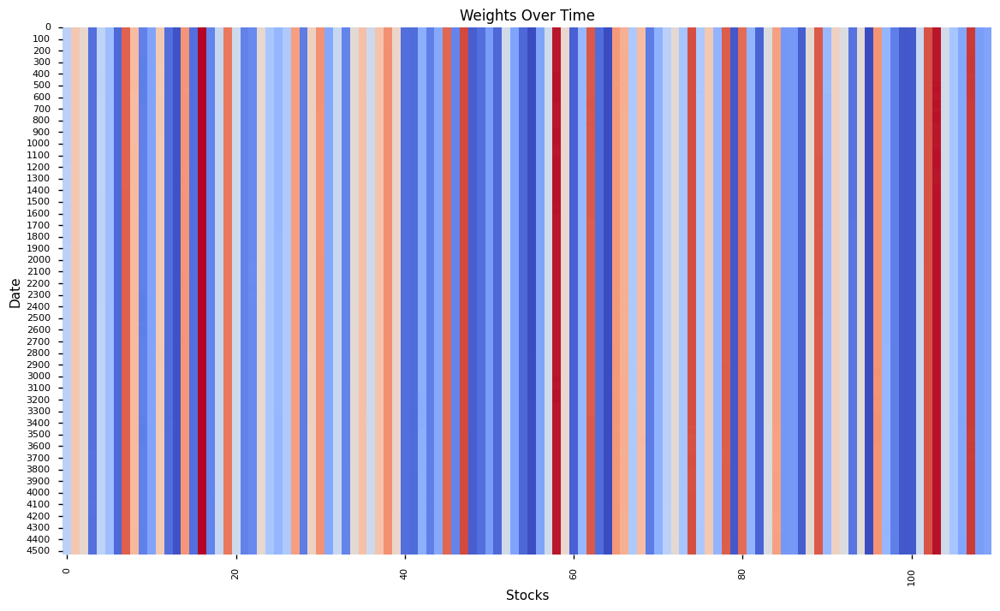

In [78]:
fig, ax = plt.subplots(1, 1, figsize = (14, 8))
sns.heatmap(
    weights_log, 
    cmap='coolwarm', 
    cbar=False,
    xticklabels=20, 
    yticklabels=100,
    ax = ax
)

ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='center', fontsize=8)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=8)
ax.set_title('Weights Over Time')
ax.set_xlabel('Stocks')
ax.set_ylabel('Date')
plt.show()

With this color scale, it looks like to the human eye that we are not updating our weights at all. We verify that that is not the case.

In [79]:
weights_log[11] - weights_log[0]

array([ 1.16415322e-07,  2.42143869e-08, -4.84287739e-08,  2.14204192e-08,
       -1.09896064e-07,  4.09781933e-08, -1.16415322e-08, -6.14672899e-08,
       -1.49011612e-08, -1.58324838e-08, -1.21071935e-08, -1.21071935e-08,
        2.23517418e-08,  4.19095159e-09, -4.74974513e-08, -1.39698386e-09,
       -1.07102096e-07,  6.47269189e-08,  3.81842256e-08,  9.68575478e-08,
        1.67638063e-08,  1.21071935e-08,  9.31322575e-09, -7.54371285e-08,
       -4.56348062e-08, -6.51925802e-09,  2.79396772e-08,  1.95577741e-08,
        1.67638063e-08, -3.91155481e-08,  5.58793545e-09, -3.72529030e-09,
       -4.28408384e-08, -6.51925802e-09,  8.56816769e-08,  6.42612576e-08,
        4.65661287e-08,  2.42143869e-08, -1.86264515e-08,  1.67638063e-08,
        6.05359674e-09, -1.39698386e-09,  2.74740160e-08,  4.00468707e-08,
        3.91155481e-08, -3.72529030e-09, -4.65661287e-09,  5.58793545e-08,
        3.49245965e-08, -1.53668225e-08, -9.31322575e-10,  0.00000000e+00,
       -4.65661287e-09,  

We plot a few randomly chosen weights and observe their evolution over time.

/var/folders/sp/cw_2m19j25xbvgpdjz48gclh0000gn/T/ipykernel_58265/2737164126.py:10: MatplotlibDeprecationWarning: Passing label as a length 2 sequence when plotting a single dataset is deprecated in Matplotlib 3.9 and will error in 3.11.  To keep the current behavior, cast the sequence to string before passing.
  axes[0].plot(
/var/folders/sp/cw_2m19j25xbvgpdjz48gclh0000gn/T/ipykernel_58265/2737164126.py:20: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[i + 1].legend()


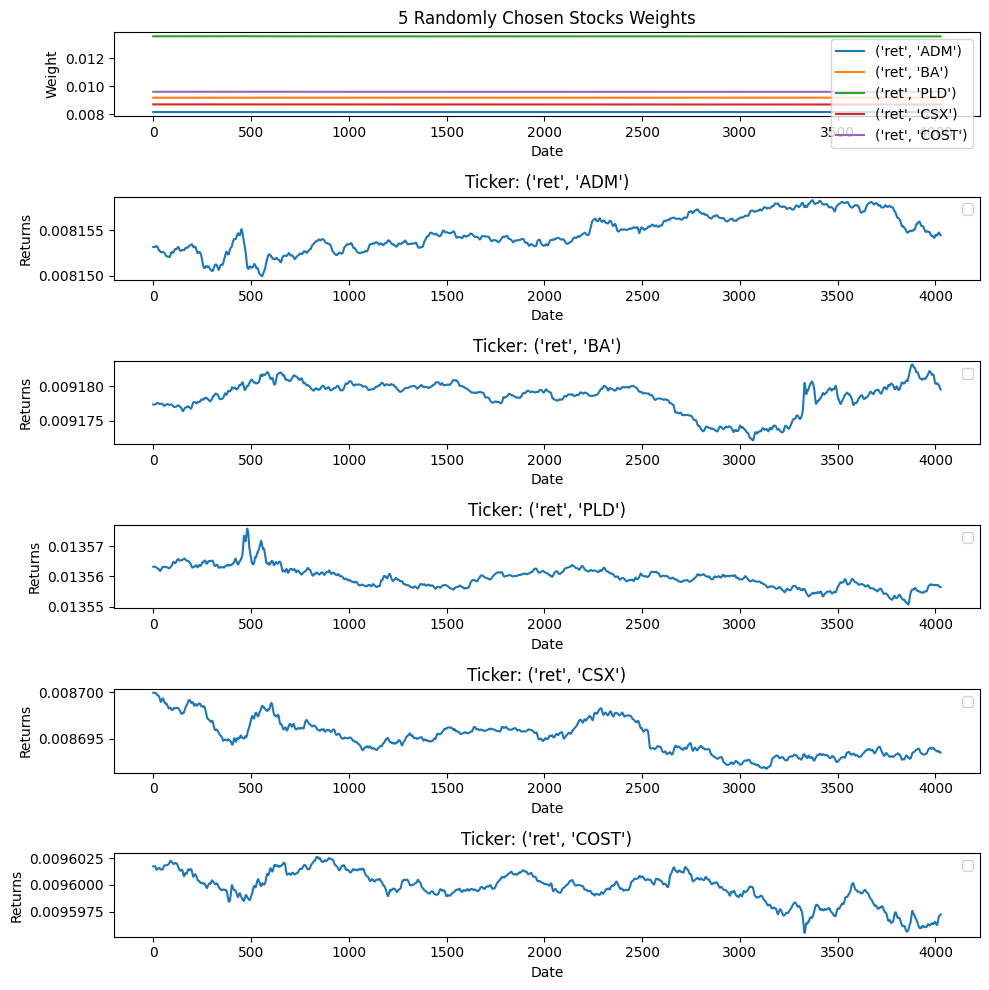

In [143]:
random_choice_tickers = np.random.randint(
    low = 0,
    high = returns.shape[1], 
    size=5
)

fig, axes = plt.subplots(6, 1, figsize = (10, 10))

for i, rng_ticker in enumerate(random_choice_tickers):
    axes[0].plot(
        weights_log[:, rng_ticker],
        label = returns.columns[rng_ticker],
    )
    axes[i + 1].plot(
        weights_log[:, rng_ticker], 
    )
    axes[i + 1].set_title(f"Ticker: {returns.columns[rng_ticker]}")
    axes[i + 1].set_xlabel('Date')
    axes[i + 1].set_ylabel('Returns')
    axes[i + 1].legend()

axes[0].set_title("5 Randomly Chosen Stocks Weights")
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Weight')
axes[0].legend()
plt.tight_layout()
plt.show()

It seems like we are updating, but all weights stay relatively constant.

We are also not doing that much better than random guessing.

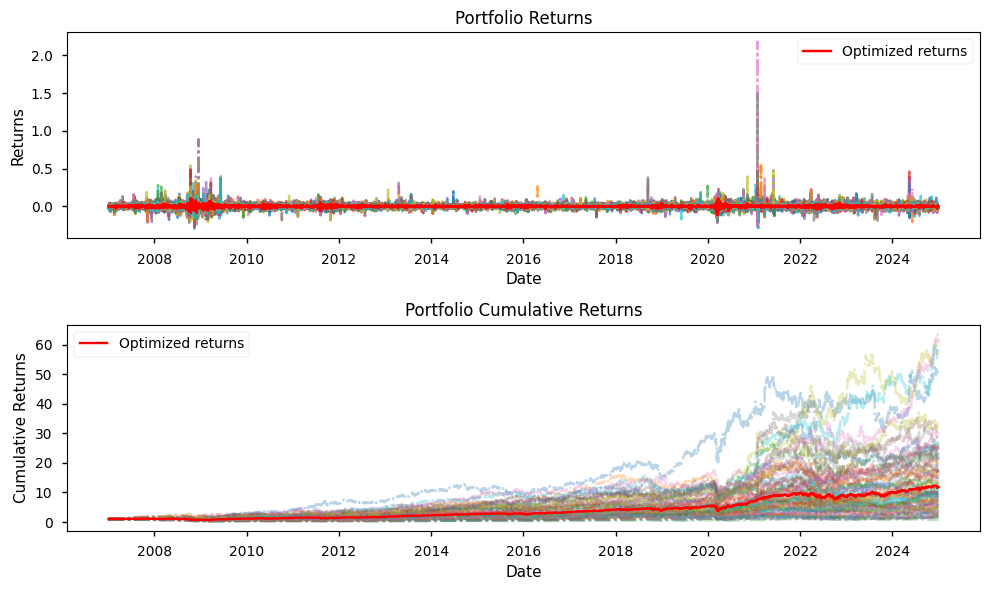

In [80]:
n_stocks = 2
n_trials = 100

fig, axes = plt.subplots(2, 1, figsize = (10, 6))
for _ in range(n_trials):
    p2_returns = np.zeros(returns.shape[0])

    for i, date in enumerate(returns.index):
        daily_returns = returns.loc[date].T
        choice = np.random.randint(0, returns.shape[1], size=n_stocks)
        weights = np.zeros(returns.shape[1])
        weights[choice] = 1 / n_stocks

        p2_returns[i] = np.dot(weights, daily_returns.values)

    axes[0].plot(returns.index, p2_returns, linestyle = '-.', alpha = .7)
    axes[1].plot(returns.index, (p2_returns + 1).cumprod(), linestyle = '-.', alpha = .3)


axes[0].set_title('Portfolio Returns')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Returns')

axes[1].set_title('Portfolio Cumulative Returns')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Cumulative Returns')


axes[0].plot(
    returns.index, 
    plot_returns, 
    label = 'Optimized returns',
    color = 'red'
)

axes[1].plot(
    returns.index, 
    (1 + plot_returns).cumprod(), 
    label = 'Optimized returns',
    color = 'red'
)

axes[0].legend()
axes[1].legend()

plt.tight_layout()
plt.show()




## Inducing more pronounced weight changes

We try jacking up the learning rate. 

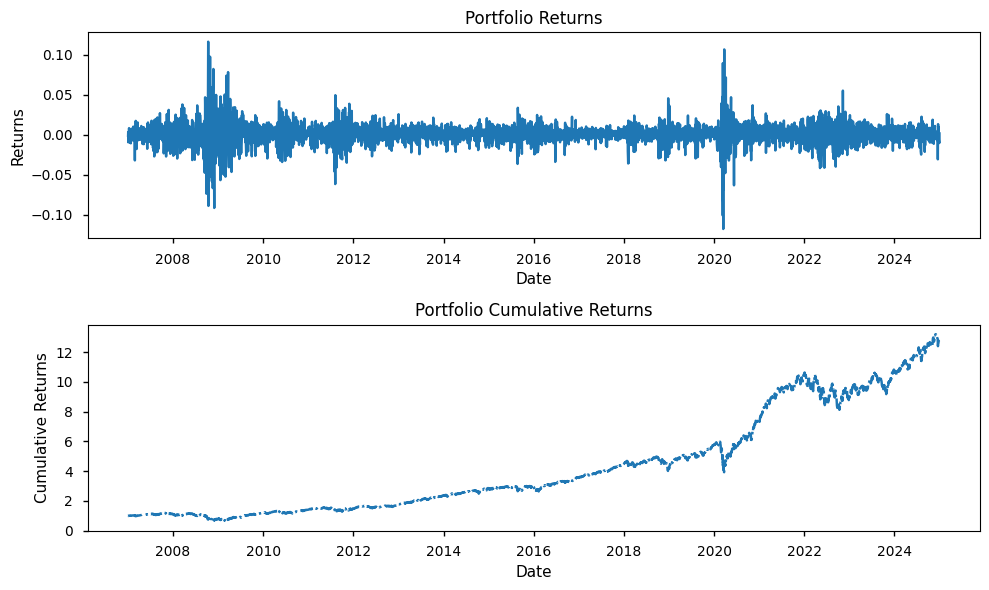

In [81]:
train_returns = []
plot_returns = []

weights = torch.rand(
    size = (returns.shape[1],), 
    requires_grad=True
)
optimizer = torch.optim.SGD([weights], lr=0.5)

weights_log = np.zeros((returns.shape[0], returns.shape[1]))

for i, date in enumerate(returns.index):
    normalized_weights = torch.nn.functional.softmax(weights, dim=0)
    daily_returns = returns.loc[date].T
    daily_tensor = torch.tensor(daily_returns.values, dtype=torch.float32)
    ret = torch.dot(normalized_weights, daily_tensor)
    plot_returns.append(ret.detach())

    if i >= window_size:
        past_returns = []
        for j in range(max(0, i - window_size), i - 1):
            past_daily = returns.iloc[j].values
            past_ret = torch.dot(normalized_weights, torch.tensor(past_daily, dtype=torch.float32))
            past_returns.append(past_ret)

        past_returns = torch.stack(past_returns)
        expected_return = -calculate_objective_func(past_returns)

        optimizer.zero_grad()
        expected_return.backward()
        optimizer.step()
    
    weights_log[i] = normalized_weights.detach().numpy()

plot_returns = np.asarray(plot_returns)

fig, axes = plt.subplots(2, 1, figsize = (10, 6))
axes[0].plot(
    returns.index, 
    plot_returns, 
    label = 'returns',
)
axes[1].plot(
    returns.index, 
    (plot_returns + 1).cumprod(), 
    linestyle = '-.', 
    label = 'cum returns'
)


axes[0].set_title('Portfolio Returns')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Returns')

axes[1].set_title('Portfolio Cumulative Returns')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Cumulative Returns')

plt.tight_layout()
plt.show()

[Text(0, 0.5, '0'),
 Text(0, 100.5, '100'),
 Text(0, 200.5, '200'),
 Text(0, 300.5, '300'),
 Text(0, 400.5, '400'),
 Text(0, 500.5, '500'),
 Text(0, 600.5, '600'),
 Text(0, 700.5, '700'),
 Text(0, 800.5, '800'),
 Text(0, 900.5, '900'),
 Text(0, 1000.5, '1000'),
 Text(0, 1100.5, '1100'),
 Text(0, 1200.5, '1200'),
 Text(0, 1300.5, '1300'),
 Text(0, 1400.5, '1400'),
 Text(0, 1500.5, '1500'),
 Text(0, 1600.5, '1600'),
 Text(0, 1700.5, '1700'),
 Text(0, 1800.5, '1800'),
 Text(0, 1900.5, '1900'),
 Text(0, 2000.5, '2000'),
 Text(0, 2100.5, '2100'),
 Text(0, 2200.5, '2200'),
 Text(0, 2300.5, '2300'),
 Text(0, 2400.5, '2400'),
 Text(0, 2500.5, '2500'),
 Text(0, 2600.5, '2600'),
 Text(0, 2700.5, '2700'),
 Text(0, 2800.5, '2800'),
 Text(0, 2900.5, '2900'),
 Text(0, 3000.5, '3000'),
 Text(0, 3100.5, '3100'),
 Text(0, 3200.5, '3200'),
 Text(0, 3300.5, '3300'),
 Text(0, 3400.5, '3400'),
 Text(0, 3500.5, '3500'),
 Text(0, 3600.5, '3600'),
 Text(0, 3700.5, '3700'),
 Text(0, 3800.5, '3800'),
 Text(0, 3

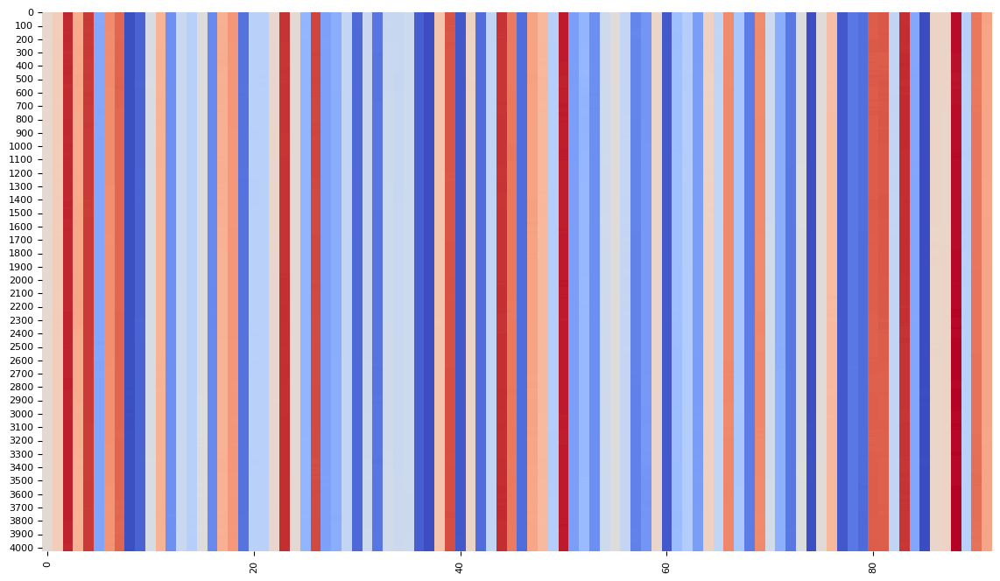

In [151]:
fig, ax = plt.subplots(1, 1, figsize = (14, 8))
sns.heatmap(
    weights_log, 
    cmap='coolwarm', 
    cbar=False,
    xticklabels=20, 
    yticklabels=100,
    ax = ax
)

ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='center', fontsize=8)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=8)

/var/folders/sp/cw_2m19j25xbvgpdjz48gclh0000gn/T/ipykernel_22308/2737164126.py:20: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[i + 1].legend()


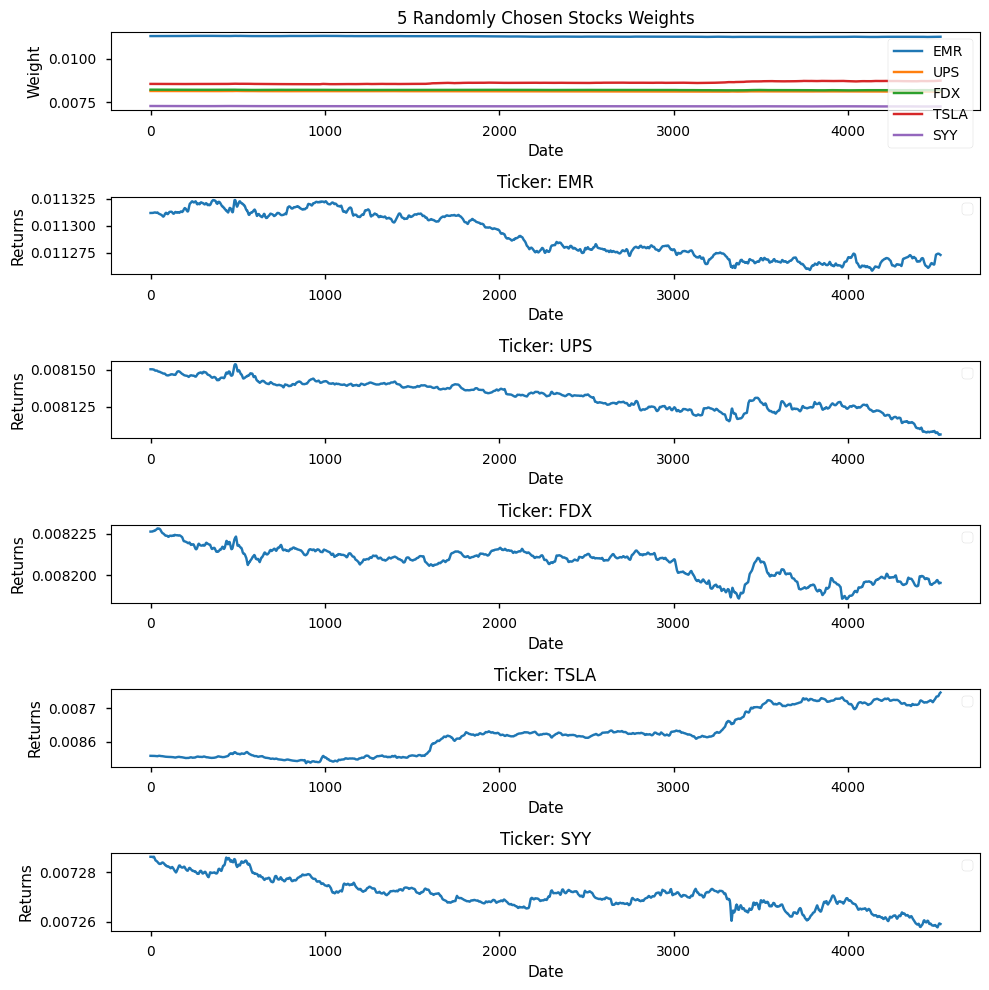

In [82]:
random_choice_tickers = np.random.randint(
    low = 0,
    high = returns.shape[1], 
    size=5
)

fig, axes = plt.subplots(6, 1, figsize = (10, 10))

for i, rng_ticker in enumerate(random_choice_tickers):
    axes[0].plot(
        weights_log[:, rng_ticker],
        label = returns.columns[rng_ticker],
    )
    axes[i + 1].plot(
        weights_log[:, rng_ticker], 
    )
    axes[i + 1].set_title(f"Ticker: {returns.columns[rng_ticker]}")
    axes[i + 1].set_xlabel('Date')
    axes[i + 1].set_ylabel('Returns')
    axes[i + 1].legend()

axes[0].set_title("5 Randomly Chosen Stocks Weights")
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Weight')
axes[0].legend()
plt.tight_layout()
plt.show()

Jacking up the learning rate seems to have minimal effect on the change in weights over time.

We also try using a shorter window. Longer window smooths things over. Shorter window might result in sharper movements.

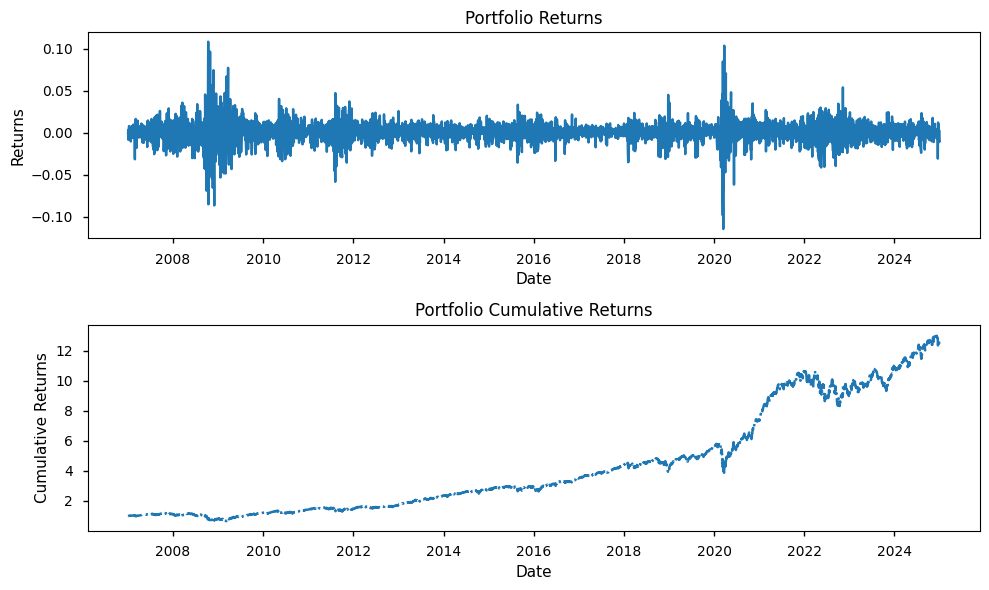

In [83]:
train_returns = []
plot_returns = []

window_size = 3

weights = torch.rand(
    size = (returns.shape[1],), 
    requires_grad=True
)
optimizer = torch.optim.SGD([weights], lr=0.5)
weights_log = np.zeros((returns.shape[0], returns.shape[1]))

for i, date in enumerate(returns.index):
    normalized_weights = torch.nn.functional.softmax(weights, dim=0)
    daily_returns = returns.loc[date].T
    daily_tensor = torch.tensor(daily_returns.values, dtype=torch.float32)
    ret = torch.dot(normalized_weights, daily_tensor)
    plot_returns.append(ret.detach())

    if i >= window_size:
        past_returns = []
        for j in range(max(0, i - window_size), i - 1):
            past_daily = returns.iloc[j].values
            past_ret = torch.dot(normalized_weights, torch.tensor(past_daily, dtype=torch.float32))
            past_returns.append(past_ret)

        past_returns = torch.stack(past_returns)
        expected_return = calculate_objective_func(past_returns)

        optimizer.zero_grad()
        expected_return.backward()
        optimizer.step()
    
    weights_log[i] = normalized_weights.detach().numpy()

plot_returns = np.asarray(plot_returns)

fig, axes = plt.subplots(2, 1, figsize = (10, 6))
axes[0].plot(
    returns.index, 
    plot_returns, 
    label = 'returns',
)
axes[1].plot(
    returns.index, 
    (plot_returns + 1).cumprod(), 
    linestyle = '-.', 
    label = 'cum returns'
)


axes[0].set_title('Portfolio Returns')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Returns')

axes[1].set_title('Portfolio Cumulative Returns')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Cumulative Returns')

plt.tight_layout()
plt.show()

/var/folders/sp/cw_2m19j25xbvgpdjz48gclh0000gn/T/ipykernel_22308/2783118349.py:8: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


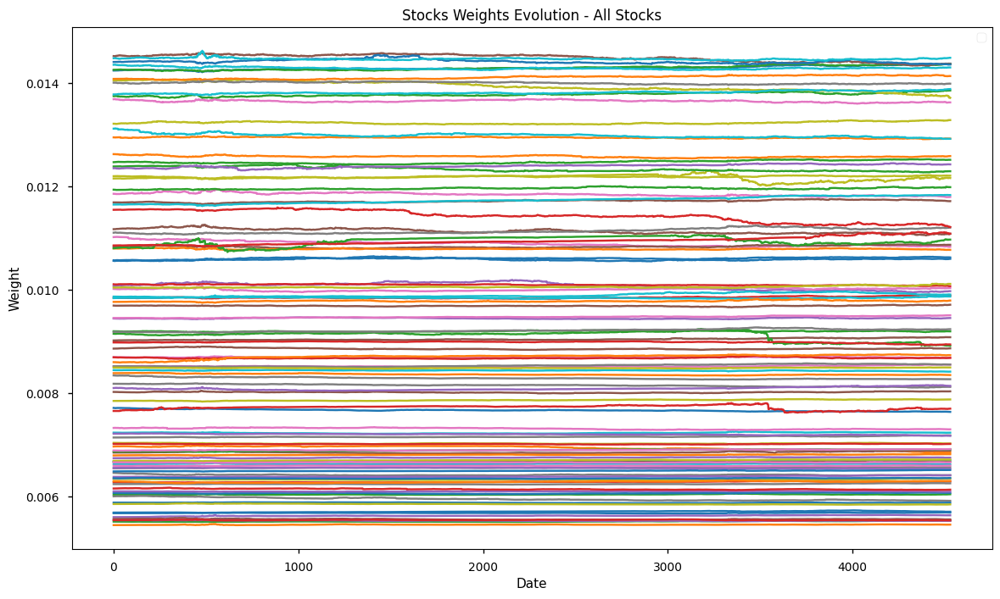

In [87]:
fig, ax = plt.subplots(1, 1, figsize = (14, 8))
for i in range(weights_log.shape[1]):
    ax.plot(weights_log[:, i])

ax.set_title("Stocks Weights Evolution - All Stocks")
ax.set_xlabel('Date')
ax.set_ylabel('Weight')
ax.legend()
plt.show()

A little more movement for sure. However, still relatively little changes to our weights. This could be because there isn't much going on in our objective function right now. 

We move on with this issue unresolved for now. Perhaps with more components in our objective function, the weights will actually start changing.

## Incorporating risk free rate and Sharpe Ratio

We make things a little more exciting by incorporating Sharpe ratio.

To use the Sharpe Ratio, we need to pull the risk free rate data. Furthermore, it only makes sense if our model can also observe what the risk free rate was. 

In [88]:
stock_data

,ticker,permno,ret
date,,,
2021-06-07,HON,10145,-0.008085
2009-01-20,MRNA,80004,-0.034483
2024-07-16,BAC,59408,0.053473
2019-10-25,D,64936,-0.010034
2013-10-29,PG,18163,0.014268
...,...,...,...
2023-11-07,GM,12369,-0.024047
2022-08-23,KO,11308,0.00109
2010-12-21,BA,19561,0.014541


In [89]:
def get_risk_free_data(start, end):
    risk_free_data = conn.raw_sql(
        f"""
        SELECT date, rf
        FROM ff.factors_daily 
        WHERE date BETWEEN '{start}' AND '{end}'
    """,
        date_cols=['date']
    )
    risk_free_data['date'] = pd.to_datetime(risk_free_data['date'])
    risk_free_data = risk_free_data.set_index('date')
    return risk_free_data

risk_free_data = get_risk_free_data("2007-01-01", "2024-12-31")

In [90]:
stock_data = stock_data.merge(
    risk_free_data, 
    left_index=True, 
    right_index=True, 
    how='left'
)

stock_data

,ticker,permno,ret,rf
date,,,,
2021-06-07,HON,10145,-0.008085,0.0
2009-01-20,MRNA,80004,-0.034483,0.0
2024-07-16,BAC,59408,0.053473,0.00021
2019-10-25,D,64936,-0.010034,0.00007
2013-10-29,PG,18163,0.014268,0.0
...,...,...,...,...
2023-11-07,GM,12369,-0.024047,0.00021
2022-08-23,KO,11308,0.00109,0.00008
2010-12-21,BA,19561,0.014541,0.00001


In [91]:
returns = stock_data.pivot_table(
    index = ['date'],
    columns = ['ticker'],
    values = ['ret'],
    fill_value = 0
)['ret'].merge(
    risk_free_data, 
    left_index=True, 
    right_index=True, 
    how='left'
)
returns

,AAPL,ADI,ADM,AMC,AMD,AMT,AMZN,ASML,AVGO,AXP,...,UPS,V,VICI,VRTX,WBD,WMT,WY,XOM,YUM,rf
date,,,,,,,,,,,,,,,,,,,,,
2007-01-03,-0.012258,-0.000913,0.003129,0.008294,-0.040786,0.019313,-0.01926,-0.010556,0.0,-0.002637,...,-0.000133,0.0,0.0,-0.013896,-0.012923,0.029667,0.026185,-0.032885,0.00102,0.00022
2007-01-04,0.022196,0.017357,-0.005615,-0.011163,0.013832,-0.003947,0.005168,0.011079,0.0,-0.00729,...,0.001601,0.0,0.0,0.002439,-0.019638,0.004837,-0.010069,-0.018756,-0.002718,0.00022
2007-01-05,-0.007121,-0.011374,-0.001568,-0.033868,-0.004043,-0.008719,-0.013625,0.004464,0.0,-0.013184,...,-0.012518,0.0,0.0,-0.031901,-0.045652,-0.008162,-0.003205,0.007151,-0.008688,0.00022
2007-01-08,0.004938,0.007872,0.005027,-0.01476,-0.012177,0.028518,-0.022674,0.011313,0.0,0.009471,...,0.003102,0.0,0.0,-0.063111,0.043768,-0.00823,0.008806,-0.008056,-0.002406,0.00022
2007-01-09,0.08307,-0.001502,-0.024383,0.004994,0.009245,0.014512,0.007467,-0.010787,0.0,-0.006366,...,-0.004033,0.0,0.0,0.009538,-0.045986,0.008298,-0.005127,-0.007708,0.00379,0.00022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-24,0.011478,0.014891,0.004364,-0.014563,0.013563,0.00179,0.017729,-0.001845,0.031547,0.015596,...,0.004056,0.010813,0.008972,0.00718,0.010537,0.025789,0.00641,0.000941,0.008516,0.00017
2024-12-26,0.003176,-0.000138,-0.000395,-0.002463,-0.00974,-0.003952,-0.008732,-0.005349,0.023698,0.001747,...,0.000792,0.000811,-0.003762,0.006051,0.006635,0.001187,-0.003185,0.000846,0.007407,0.00017
2024-12-27,-0.013242,-0.004907,-0.000593,-0.012346,0.00104,-0.002663,-0.014534,-0.003171,-0.014713,-0.009671,...,-0.001978,-0.007011,-0.006522,-0.004602,-0.000942,-0.012178,-0.00639,-0.000094,-0.005662,0.00017


Theoretically modern portfolio theory / capital asset allocation is built upon the existence of a risk free asset.

However, for now we limit the ability to invest at the risk free rate.

We might relax this later on, and then compare the gradient-descent yielded optimal portfolio against that of a mean-variance optimized portfolio.

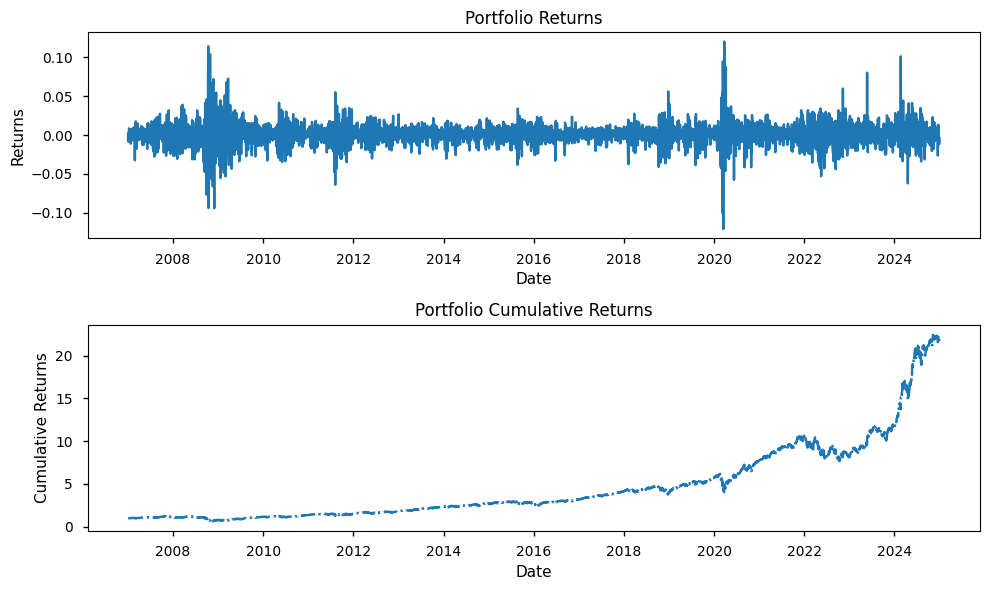

In [92]:
train_returns = []
plot_returns = []
plot_excess_returns = []
window_size = 10

def calculate_objective_func(
        returns: torch.tensor,
        risk_free_rate: torch.tensor = None
    ):
    if risk_free_rate is not None:
        excess_returns = returns - risk_free_rate
    else:
        excess_returns = returns
    sharpe = torch.mean(excess_returns, dim=0) / torch.std(excess_returns, dim=0)
    return sharpe

# returns.shape[1] - 1 because we don't allow investing in 
# risk free asset for the moment 

weights = torch.rand(
    size = (returns.shape[1] - 1,), 
    requires_grad=True
)
optimizer = torch.optim.SGD([weights], lr=0.5)
weights_log = np.zeros((returns.shape[0], returns.shape[1] - 1))

for i, date in enumerate(returns.index):
    normalized_weights = torch.nn.functional.softmax(weights, dim=0)
    daily_returns = returns.loc[date].T
    daily_tensor = torch.tensor(daily_returns.values, dtype=torch.float32)[:-1]

    ret = torch.dot(normalized_weights, daily_tensor)
    plot_returns.append(ret.detach())
    plot_excess_returns.append(
        ret.detach() - returns.iloc[i]['rf']
    )

    if i >= window_size:
        past_returns = []
        past_risk_free = []
        for j in range(max(0, i - window_size), i - 1):
            past_daily = returns.iloc[j].values
            past_ret = torch.dot(
                normalized_weights, 
                torch.tensor(past_daily, dtype=torch.float32)[:-1]
            )
            past_returns.append(past_ret)
            past_risk_free.append(past_daily[-1])

        past_returns = torch.stack(past_returns)
        past_risk_free = torch.as_tensor(past_risk_free)
        sharpe = -calculate_objective_func(
            past_returns, 
            past_risk_free
        )

        optimizer.zero_grad()
        sharpe.backward()
        optimizer.step()
    
    weights_log[i] = normalized_weights.detach().numpy()

plot_returns = np.asarray(plot_returns)

fig, axes = plt.subplots(2, 1, figsize = (10, 6))
axes[0].plot(
    returns.index, 
    plot_returns, 
    label = 'returns',
)
axes[1].plot(
    returns.index, 
    (plot_returns + 1).cumprod(), 
    linestyle = '-.', 
    label = 'cum returns'
)

axes[0].set_title('Portfolio Returns')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Returns')

axes[1].set_title('Portfolio Cumulative Returns')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Cumulative Returns')

plt.tight_layout()
plt.show()

/var/folders/sp/cw_2m19j25xbvgpdjz48gclh0000gn/T/ipykernel_22308/2783118349.py:8: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


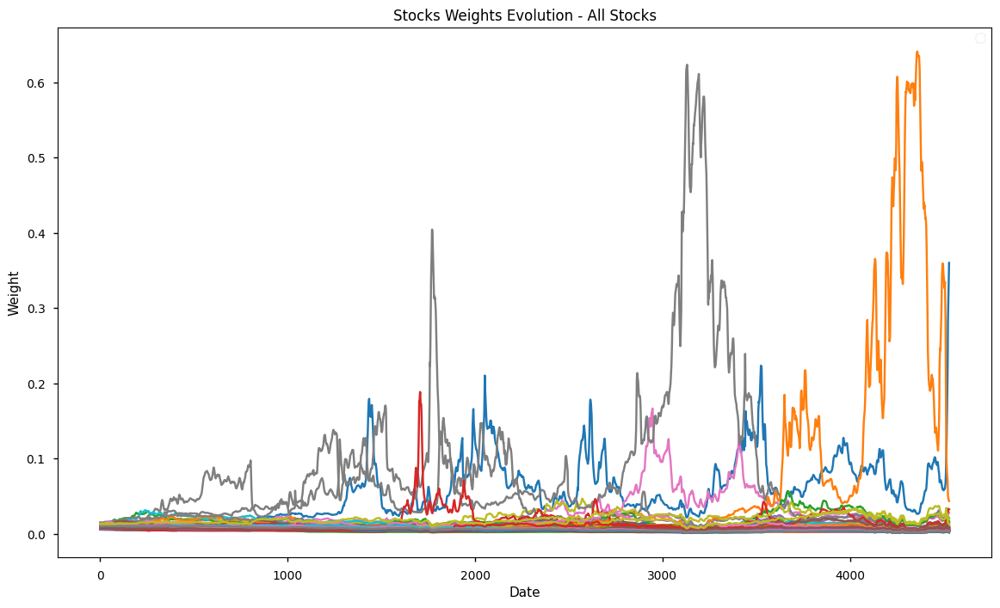

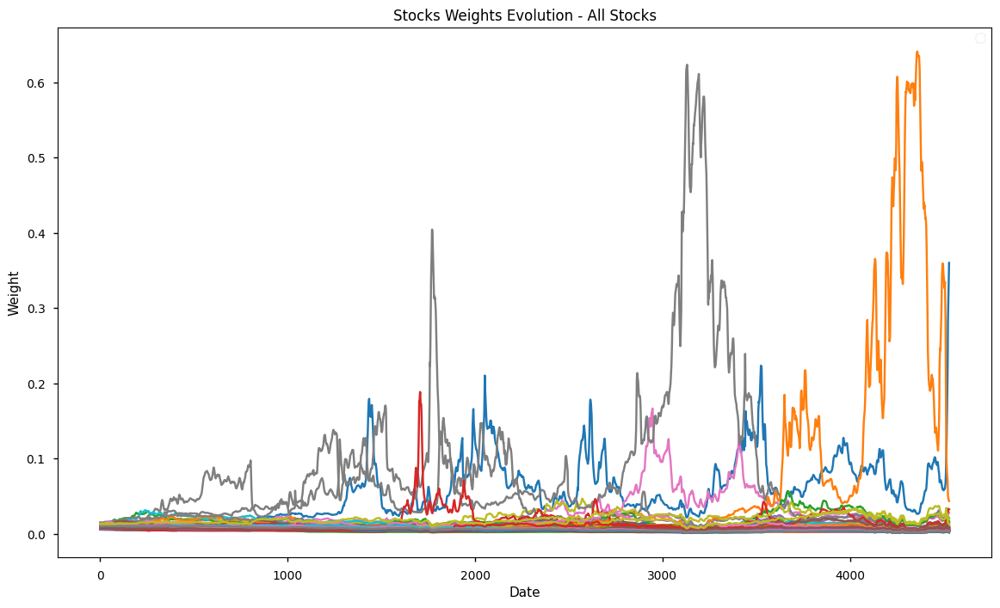

In [94]:
fig, ax = plt.subplots(1, 1, figsize = (14, 8))
for i in range(weights_log.shape[1]):
    ax.plot(weights_log[:, i])

ax.set_title("Stocks Weights Evolution - All Stocks")
ax.set_xlabel('Date')
ax.set_ylabel('Weight')
ax.legend()
plt.show()

In [95]:
returns.columns[weights_log[-1].argmax()]

'AAPL'

In [96]:
returns.columns[np.argsort(weights_log[-1])[-5:][::-1]]

Index(['AAPL', 'NVDA', 'TSLA', 'AMZN', 'MA'], dtype='object')

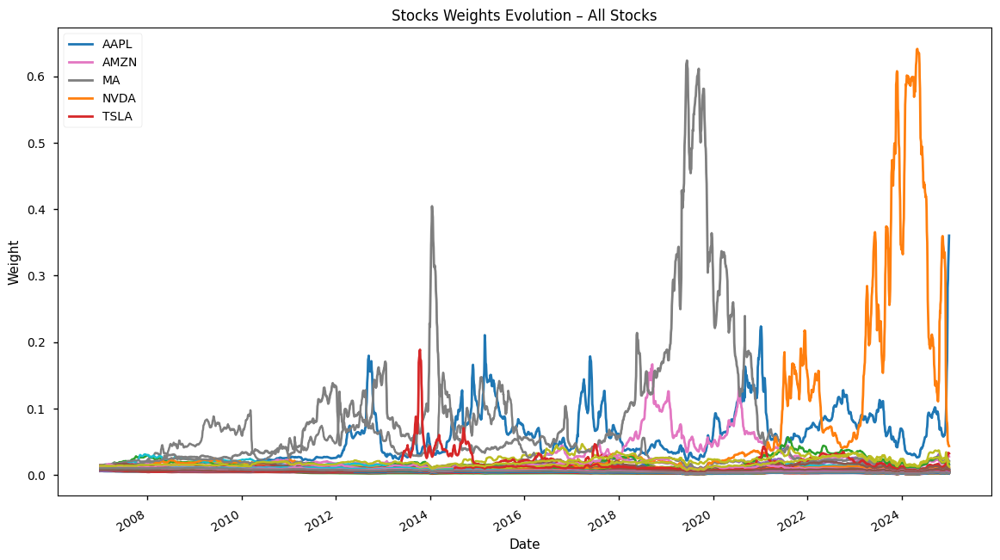

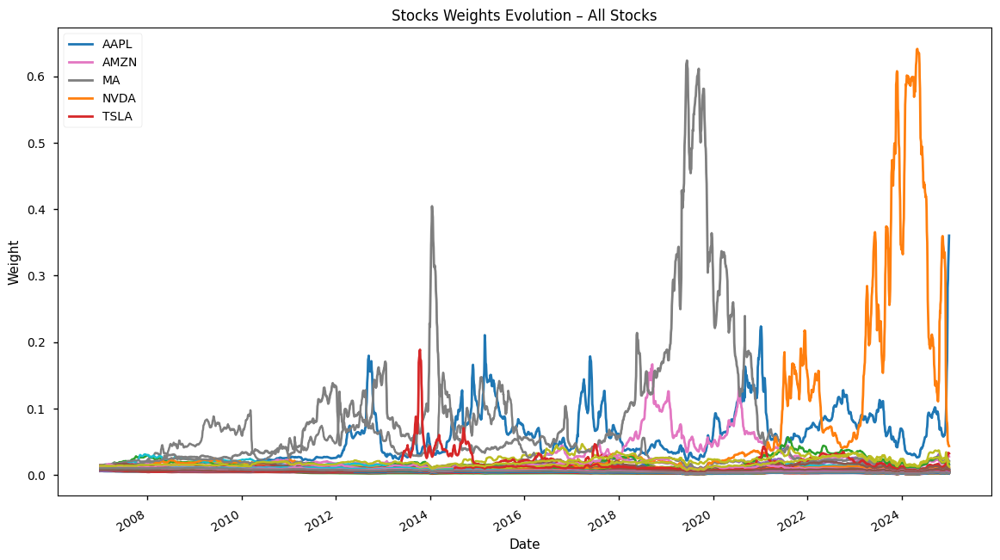

In [98]:
fig, ax = plt.subplots(1, 1, figsize = (14, 8))

top_five_holdings = np.argsort(weights_log[-1])[-5:][::-1]

for i in range(weights_log.shape[1]):
    if i in top_five_holdings:
        ax.plot(returns.index, weights_log[:, i], linewidth=2, label=returns.columns[i])
    else:
        ax.plot(returns.index, weights_log[:, i])

ax.xaxis.set_major_locator(mdates.YearLocator(2))  
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
fig.autofmt_xdate() 

ax.set_title("Stocks Weights Evolution – All Stocks")
ax.set_xlabel("Date")
ax.set_ylabel("Weight")
ax.legend()
plt.show()

We compare this to random guessing. Again by random guessing we mean picking two random stocks everyday. This should be really bad. 

Previously when optimizing for expected return we were not doing spectacular compared to random guessing. Now that we are optimizing for Sharpe we hope for some better results.

TODO: ideally we should come up with some way of evaluating our strategy. Conceptually this can be different from our objective function (i.e. we optimize for a blended `fitness` score, but we benchmark our strategy against the market index / risk free / random guessing etc). 

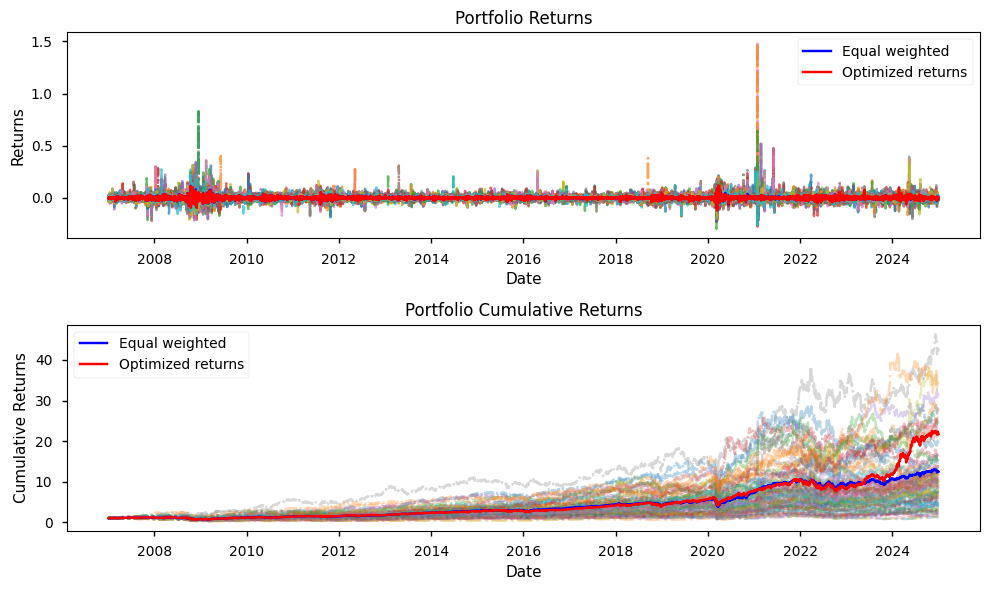

In [99]:
n_stocks = 2
n_trials = 100

fig, axes = plt.subplots(2, 1, figsize = (10, 6))
for _ in range(n_trials):
    p2_returns = np.zeros(returns.shape[0])

    for i, date in enumerate(returns.index):
        daily_returns = returns.loc[date].T
        choice = np.random.randint(0, returns.shape[1], size=n_stocks)
        weights = np.zeros(returns.shape[1])
        weights[choice] = 1 / n_stocks

        p2_returns[i] = np.dot(weights, daily_returns.values)

    axes[0].plot(returns.index, p2_returns, linestyle = '-.', alpha = .7)
    axes[1].plot(returns.index, (p2_returns + 1).cumprod(), linestyle = '-.', alpha = .3)

# We also compare against an equal weighted basket of all stocks in our universe. 
equal_weighted_portfolio_weights = np.ones(returns.shape[1] - 1) / (returns.shape[1] - 1) 
axes[0].plot(
    returns.index, 
    np.dot(equal_weighted_portfolio_weights, returns.iloc[:, :-1].T), 
    label = 'Equal weighted',
    color = 'blue'
)

axes[1].plot(
    returns.index, 
    (np.dot(equal_weighted_portfolio_weights, returns.iloc[:, :-1].T) + 1).cumprod(), 
    label = 'Equal weighted',
    color = 'blue'
)


axes[0].plot(
    returns.index, 
    plot_returns, 
    label = 'Optimized returns',
    color = 'red'
)

axes[1].plot(
    returns.index, 
    (1 + plot_returns).cumprod(), 
    label = 'Optimized returns',
    color = 'red'
)

axes[0].legend()
axes[1].legend()
axes[0].set_title('Portfolio Returns')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Returns')

axes[1].set_title('Portfolio Cumulative Returns')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Cumulative Returns')

plt.tight_layout()
plt.show()




We are doing a little better than an equal weighted portfolio. It is difficult to conclude how we are doing compared to random guessing from this chart. 


## Dreaming a little bigger. Using all US stocks. 

We take a detour by seeing how our model does on all US tickers.

In [100]:
start = "2007-01-01"
end = "2023-01-01"

# select all US stocks

stock_data = conn.raw_sql(
    f"""
    SELECT DISTINCT t1.permno, t2.date, t2.ret
    FROM crsp.msenames t1, crsp.dsf t2
    WHERE t1.permno = t2.permno
    AND date BETWEEN '{start}' AND '{end}'
""",
    date_cols=['date']
)
stock_data

,permno,date,ret
0,10001,2007-01-03,0.0
1,10001,2007-01-04,0.023423
2,10001,2007-01-05,-0.009683
3,10001,2007-01-08,0.008444
4,10001,2007-01-09,-0.009255
...,...,...,...
108116,93436,2022-12-23,-0.017551
108117,93436,2022-12-27,-0.114089
108118,93436,2022-12-28,0.033089
108119,93436,2022-12-29,0.080827


In [101]:
tickers = conn.raw_sql(
    f"""
    SELECT DISTINCT ticker, permno
    FROM crsp.msenames
    WHERE namedt BETWEEN '{start}' AND '{end}'
"""
)
tickers

,ticker,permno
0,PSHG,12500
1,PERM,13226
2,EQT,24328
3,SHOO,80034
4,PANA,21084
...,...,...
16091,SKY,38850
16092,WSB,12106
16093,MYY,91314
16094,SR,72494


In [102]:
stock_data = stock_data.merge(
    tickers, 
    left_on='permno', 
    right_on='permno', 
    how='left'
)

Thank you WRDS.

In [103]:
returns = stock_data.pivot_table(
    index = ['date'],
    columns = ['ticker'],
    values = ['ret'],
    fill_value = 0
)['ret'].merge(
    risk_free_data, 
    left_index=True, 
    right_index=True, 
    how='left'
)
returns

,A,AA,AAA,AAAP,AAAU,AABA,AAC,AACG,AACI,AACQ,...,ZVSA,ZVUE,ZWRK,ZWS,ZX,ZY,ZYME,ZYNE,ZYXI,rf
date,,,,,,,,,,,,,,,,,,,,,
2007-01-03,-0.015782,-0.022659,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.002618,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00022
2007-01-04,0.003207,-0.007501,0.0,0.0,0.0,0.0,-0.05,0.0,0.0,0.0,...,0.0,0.052193,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00022
2007-01-05,-0.0093,-0.012023,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,-0.00742,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00022
2007-01-08,-0.00352,-0.009736,0.0,0.0,0.0,0.0,0.052632,0.0,0.0,0.0,...,0.0,-0.01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00022
2007-01-09,0.001177,0.001405,0.0,0.0,0.0,0.0,-0.05,0.0,0.0,0.0,...,0.0,-0.015152,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-23,0.001476,0.010738,0.00164,0.0,0.003093,0.0,-0.000992,-0.006897,0.001992,0.002028,...,-0.115226,0.0,0.0,0.005631,0.0,0.0,-0.085324,-0.000185,0.015441,0.00016
2022-12-27,0.002144,0.011818,-0.000205,0.0,0.008411,0.0,0.001986,-0.055556,0.0,-0.119433,...,-0.104651,0.0,0.0,0.0056,0.0,0.0,-0.068408,-0.073903,-0.003621,0.00016
2022-12-28,-0.009763,-0.020444,0.000614,0.0,-0.004726,0.0,-0.000991,-0.039044,0.003976,-0.027586,...,-0.137662,0.0,0.0,-0.014849,0.0,0.0,0.0,0.0314,0.008721,0.00016


In [105]:
train_returns = []
plot_returns = []
plot_excess_returns = []
window_size = 10

def calculate_objective_func(
        returns: torch.tensor,
        risk_free_rate: torch.tensor = None
    ):
    if risk_free_rate is not None:
        excess_returns = returns - risk_free_rate
    else:
        excess_returns = returns
    sharpe = torch.mean(excess_returns, dim=0) / torch.std(excess_returns, dim=0)
    return sharpe

# returns.shape[1] - 1 because we don't allow investing in 
# risk free asset for the moment 

weights = torch.rand(
    size = (returns.shape[1] - 1,), 
    requires_grad=True
)
optimizer = torch.optim.SGD([weights], lr=0.5)
weights_log = np.zeros((returns.shape[0], returns.shape[1] - 1))

for i, date in enumerate(returns.index):
    if i % 5 == 0:
        print(f"Step {i} of {returns.shape[0]}", end = '\r')
    normalized_weights = torch.nn.functional.softmax(weights, dim=0)
    daily_returns = returns.loc[date].T
    daily_tensor = torch.tensor(daily_returns.values, dtype=torch.float32)[:-1]

    ret = torch.dot(normalized_weights, daily_tensor)
    plot_returns.append(ret.detach())
    plot_excess_returns.append(
        ret.detach() - returns.iloc[i]['rf']
    )

    if i >= window_size:
        past_returns = []
        past_risk_free = []
        for j in range(max(0, i - window_size), i - 1):
            past_daily = returns.iloc[j].values
            past_ret = torch.dot(
                normalized_weights, 
                torch.tensor(past_daily, dtype=torch.float32)[:-1]
            )
            past_returns.append(past_ret)
            past_risk_free.append(past_daily[-1])

        past_returns = torch.stack(past_returns)
        past_risk_free = torch.as_tensor(past_risk_free)
        sharpe = -calculate_objective_func(
            past_returns, 
            past_risk_free
        )

        optimizer.zero_grad()
        sharpe.backward()
        optimizer.step()
    
    weights_log[i] = normalized_weights.detach().numpy()

plot_returns = np.asarray(plot_returns)


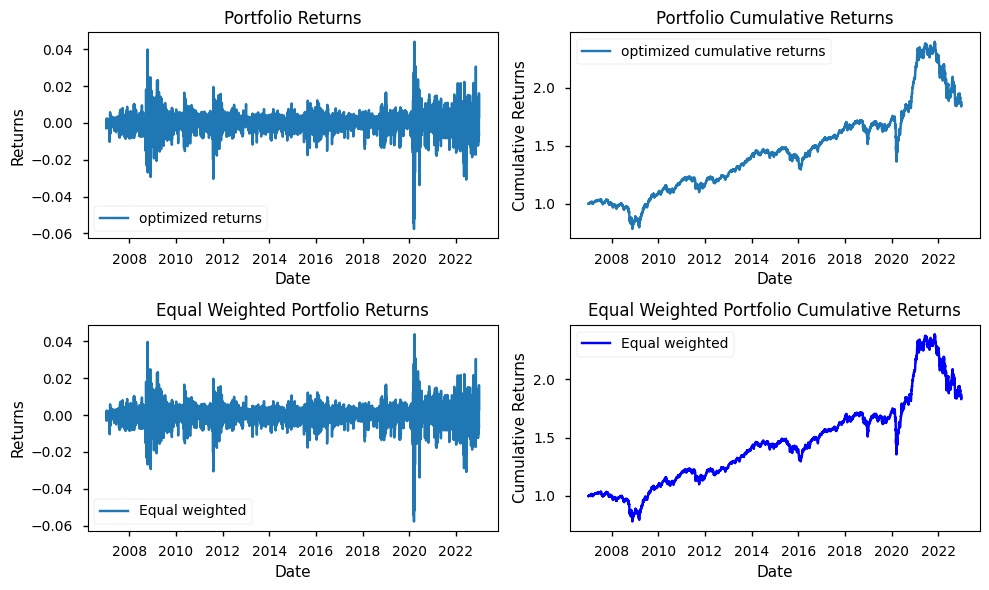

In [108]:
fig, axes = plt.subplots(2, 2, figsize = (10, 6))
axes = np.ravel(axes)
axes[0].plot(
    returns.index, 
    plot_returns, 
    label = 'optimized returns',
)
axes[1].plot(
    returns.index, 
    (plot_returns + 1).cumprod(), 
    label = 'optimized cumulative returns'
)

equal_weighted_portfolio_weights = np.ones(returns.shape[1] - 1) / (returns.shape[1] - 1) 
axes[2].plot(
    returns.index, 
    np.dot(equal_weighted_portfolio_weights, returns.iloc[:, :-1].T), 
    label = 'Equal weighted',
)

axes[3].plot(
    returns.index, 
    (np.dot(equal_weighted_portfolio_weights, returns.iloc[:, :-1].T) + 1).cumprod(), 
    label = 'Equal weighted',
    color = 'blue',
)

axes[0].legend()
axes[1].legend()
axes[2].legend()
axes[3].legend()
axes[0].set_title('Portfolio Returns')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Returns')
axes[1].set_title('Portfolio Cumulative Returns')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Cumulative Returns')

axes[2].set_title('Equal Weighted Portfolio Returns')
axes[2].set_xlabel('Date')
axes[2].set_ylabel('Returns')
axes[3].set_title('Equal Weighted Portfolio Cumulative Returns')
axes[3].set_xlabel('Date')
axes[3].set_ylabel('Cumulative Returns')

plt.tight_layout()
plt.show()


We run into a problem where our weights are basically not changing, and we almost exactly recreate the equal weighted portfolio returns.

I am genuinely lost as to how and why this is recreating the equal weighted portfolio returns.

In [106]:
fig, ax = plt.subplots(1, 1, figsize = (14, 8))

top_five_holdings = np.argsort(weights_log[-1])[-5:][::-1]

for i in range(weights_log.shape[1]):
    if i in top_five_holdings:
        ax.plot(returns.index, weights_log[:, i], linewidth=2, label=returns.columns[i])
    else:
        if i % 100 == 0:
            ax.plot(returns.index, weights_log[:, i])

ax.xaxis.set_major_locator(mdates.YearLocator(2))  
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
fig.autofmt_xdate() 

ax.set_title("Stocks Weights Evolution – All Stocks")
ax.set_xlabel("Date")
ax.set_ylabel("Weight")
ax.legend()

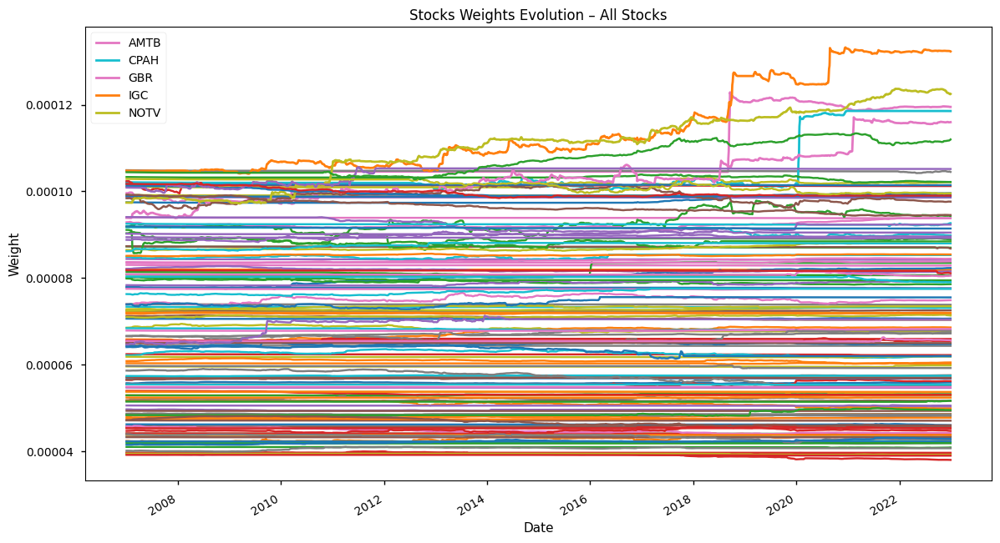

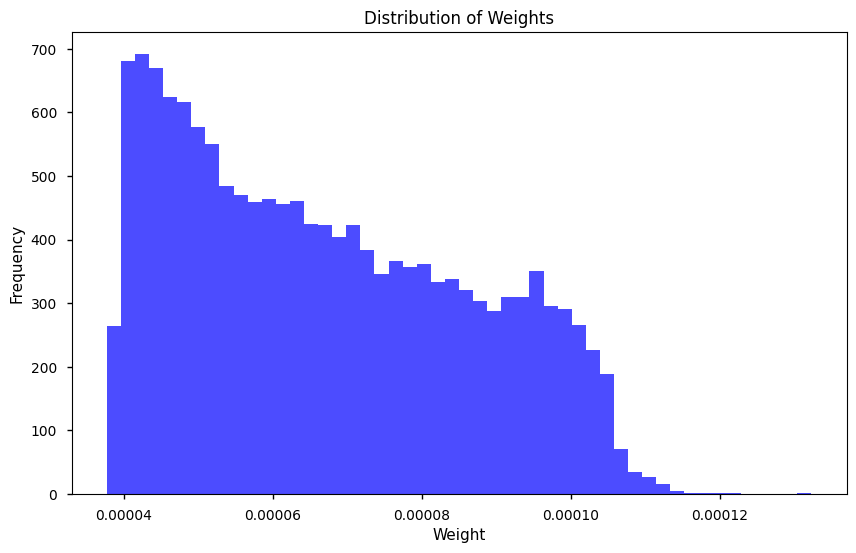

In [107]:
fig, ax = plt.subplots(1, 1, figsize = (10, 6))
ax.hist(
    weights_log[-1], 
    bins=50, 
    color='blue', 
    alpha=0.7
)
ax.set_title("Distribution of Weights")
ax.set_xlabel("Weight")
ax.set_ylabel("Frequency")
plt.show()


This addresses our earlier concern about weights not updating. Weights are definitely updating here. 

Definitely possible to work with all 110 stocks. However, it takes a while to run through all the data we have. We go back to working with our 110 tickers for the purposes of testing different objective functions, before returning to all tickers as the last step in our testing. 

## Sortino Ratio

In [153]:
# set up
window_size = 10
tickers = [
    "AAPL", "MSFT", "NVDA", "GOOGL", "AMZN", "META", "AVGO", "ORCL", "IBM", "CSCO",
    "JPM", "V", "MA", "GS", "MS", "BAC", "C", "AXP", "SCHW",
    "UNH", "JNJ", "LLY", "PFE", "MRNA", "BMY", "GILD", "CVS", "VRTX", "ISRG",
    "WMT", "NKE", "PG", "TGT", "COST", "KO", "PEP", "MCD", "SBUX", "YUM",
    "XOM", "CVX", "NEE", "DUK", "SO", "D", "ENB", "SLB", "EOG", "PSX",
    "DE", "LMT", "RTX", "BA", "CAT", "GE", "HON", "UPS", "EMR", "NOC",
    "PLD", "AMT", "EQIX", "O", "SPG", "VICI", "DLR", "WY", "EQR", "PSA",
    "TSLA", "FDX", "UPS", "GM", "F", "RIVN", "NIO", "CSX", "UNP", "DAL",
    "TSM", "ASML", "AMD", "TXN", "INTC", "MU", "QCOM", "LRCX", "NXPI", "ADI",
    "ADM", "BG", "CF", "TSN", "MOS", "FMC", "CAG", "SYY", "HRL", "MDLZ",
    "NFLX", "DIS", "PARA", "WBD", "CMCSA", "SPOT", "LYV", "TTWO", "EA",
    "GME", "AMC"
]
start = "2007-01-01"
end = "2025-04-15"

# data access
# print(f"Accessing data from WRDS...")
# conn = wrds.Connection()
# stock_data = conn.raw_sql(
#     f"""
#     SELECT DISTINCT t1.ticker, t1.permno, t2.date, t2.ret
#     FROM crsp.msenames t1, crsp.dsf t2
#     WHERE t1.permno = t2.permno
#     AND date BETWEEN '{start}' AND '{end}'
#     AND t1.ticker IN ({', '.join([f"'{ticker}'" for ticker in tickers])})
# """,
#     date_cols=['date']
# ).set_index('date')

# risk_free_data = conn.raw_sql(
#     f"""
#     SELECT date, rf
#     FROM ff.factors_daily
#     WHERE date BETWEEN '{start}' AND '{end}'
# """,
#     date_cols=['date']
# ).set_index('date')

# returns = stock_data.pivot_table(
#     index = ['date'],
#     columns = ['ticker'],
#     values = ['ret'],
#     fill_value = 0
# )['ret'].merge(
#     risk_free_data, 
#     left_index=True, 
#     right_index=True, 
#     how='left'
# )
# returns.to_csv('returns_110tickers_2017_2025.csv')

# Objectige function
def calculate_sharpe(
        returns: torch.tensor,
        risk_free_rate: torch.tensor = None
    ):
    if risk_free_rate is not None:
        excess_returns = returns - risk_free_rate
    else:
        excess_returns = returns
    sharpe = torch.mean(excess_returns, dim=0) / torch.std(excess_returns, dim=0)
    return sharpe

def calculate_sortino(
        returns: torch.tensor,
        min_acceptable_return: torch.tensor
    ):
    if min_acceptable_return is not None:
        excess_returns = returns - min_acceptable_return
    downside_deviation = torch.std(
        torch.where(excess_returns < 0, excess_returns, torch.tensor(0.0)),
    )
    sortino = torch.mean(excess_returns, dim=0) / (downside_deviation + eps**2)
    return sortino

def calculate_objective_func(
        returns: torch.tensor,
        risk_free_rate: torch.tensor = None
    ):
    return calculate_sortino(returns, risk_free_rate)

return_logs = torch.zeros(
    size = (returns.shape[0],), 
    dtype=torch.float32
)
rolling_return_list = []

# returns.shape[1] - 1 because we don't allow investing in 
# risk free asset for the moment 
print(f"Initializing optimization...")
weights = torch.rand(
    size = (returns.shape[1] - 1,), 
    requires_grad=True
)
optimizer = torch.optim.SGD([weights], lr=0.5)
weights_log = np.zeros((returns.shape[0], returns.shape[1] - 1))

for i, date in enumerate(returns.index):
    if i % 5 == 0:
        print(f"Step {i} of {returns.shape[0]}", end = '\r')

    normalized_weights = torch.nn.functional.softmax(weights, dim=0)
    daily_returns = torch.tensor(
        returns.loc[date].T[:-1],
        dtype=torch.float32
    )
    ret = torch.dot(normalized_weights, daily_returns)

    # for logging
    return_logs[i] = ret.detach()
    rolling_return_list.append(ret)

    if len(rolling_return_list) > window_size:
        rolling_return_list.pop(0)
        past_returns = torch.stack(rolling_return_list)
        past_rf = torch.tensor(
            returns.iloc[max(0, i - window_size):i]['rf'].values,
            dtype=torch.float32
        )
        objective = -calculate_objective_func(
            past_returns,
            past_rf
        )
        optimizer.zero_grad()
        objective.backward(retain_graph=True)
        optimizer.step()
    
    weights_log[i] = normalized_weights.detach().numpy()


Initializing optimization...


/var/folders/sp/cw_2m19j25xbvgpdjz48gclh0000gn/T/ipykernel_22308/476112766.py:107: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  daily_returns = torch.tensor(


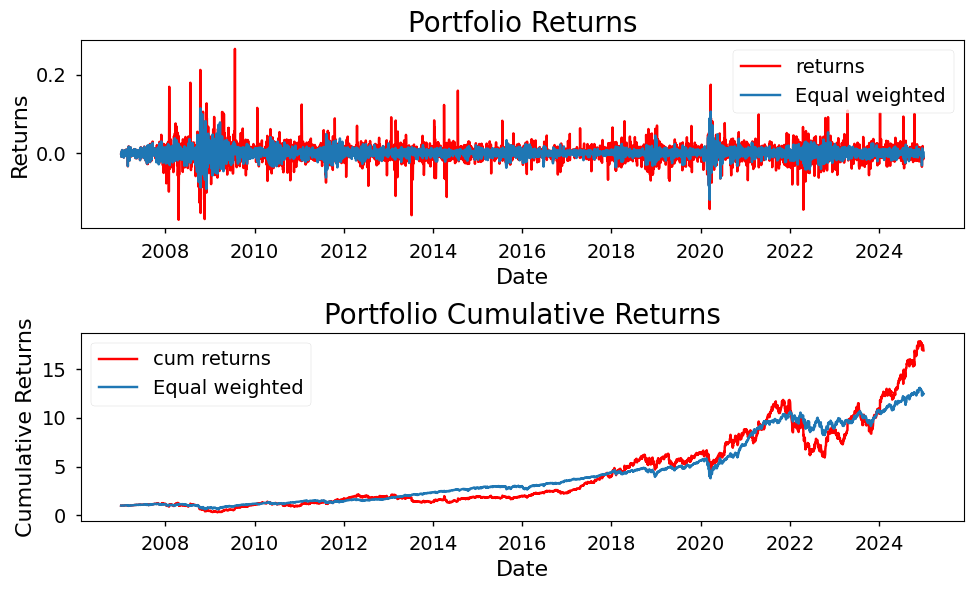

In [ ]:
fig, axes = plt.subplots(2, 1, figsize = (10, 6))
axes[0].plot(
    returns.index,
    return_logs, 
    label = 'returns',
    color = 'red',
)
axes[1].plot(
    returns.index,
    (return_logs + 1).cumprod(dim = 0), 
    label = 'cum returns',
    color = 'red',
)

# We also compare against an equal weighted basket of all stocks in our universe. 
equal_weighted_portfolio_weights = np.ones(returns.shape[1] - 1) / (returns.shape[1] - 1) 
axes[0].plot(
    returns.index, 
    np.dot(equal_weighted_portfolio_weights, returns.iloc[:, :-1].T), 
    label = 'Equal weighted',
    color = 'C0'
)

axes[1].plot(
    returns.index, 
    (np.dot(equal_weighted_portfolio_weights, returns.iloc[:, :-1].T) + 1).cumprod(), 
    label = 'Equal weighted',
    color = 'C0'
)

axes[0].set_title('Portfolio Returns')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Returns')

axes[1].set_title('Portfolio Cumulative Returns')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Cumulative Returns')

axes[0].legend()
axes[1].legend()

plt.tight_layout()
plt.show()

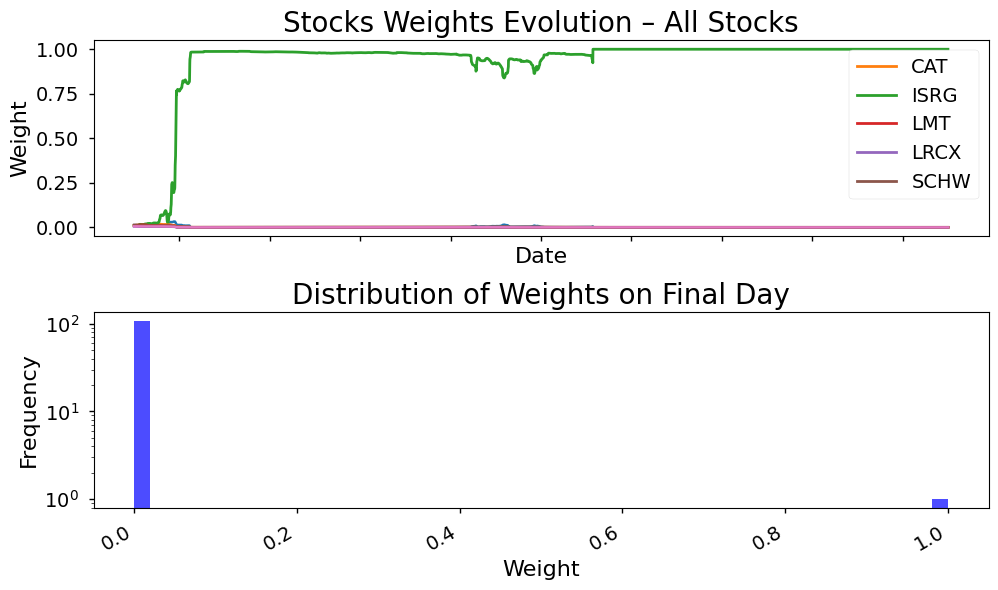

In [161]:
fig, axes= plt.subplots(2, 1, figsize = (10, 6))

ax = axes[0]
top_five_holdings = np.argsort(weights_log[-1])[-5:][::-1]
for i in range(weights_log.shape[1]):
    if i in top_five_holdings:
        ax.plot(returns.index, weights_log[:, i], linewidth=2, label=returns.columns[i])
    else:
        if i % 100 == 0:
            ax.plot(returns.index, weights_log[:, i])

ax.xaxis.set_major_locator(mdates.YearLocator(2))  
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
fig.autofmt_xdate() 

ax.set_title("Stocks Weights Evolution – All Stocks")
ax.set_xlabel("Date")
ax.set_ylabel("Weight")
ax.legend()

axes[1].hist(
    weights_log[-1], 
    bins=50, 
    color='blue', 
    alpha=0.7,
    log=True
)
axes[1].set_title("Distribution of Weights on Final Day")
axes[1].set_xlabel("Weight")
axes[1].set_ylabel("Frequency")
plt.tight_layout()

plt.show()

We try increasing our window to 255 (1 trading year)

In [163]:
# set up
window_size = 255
tickers = [
    "AAPL", "MSFT", "NVDA", "GOOGL", "AMZN", "META", "AVGO", "ORCL", "IBM", "CSCO",
    "JPM", "V", "MA", "GS", "MS", "BAC", "C", "AXP", "SCHW",
    "UNH", "JNJ", "LLY", "PFE", "MRNA", "BMY", "GILD", "CVS", "VRTX", "ISRG",
    "WMT", "NKE", "PG", "TGT", "COST", "KO", "PEP", "MCD", "SBUX", "YUM",
    "XOM", "CVX", "NEE", "DUK", "SO", "D", "ENB", "SLB", "EOG", "PSX",
    "DE", "LMT", "RTX", "BA", "CAT", "GE", "HON", "UPS", "EMR", "NOC",
    "PLD", "AMT", "EQIX", "O", "SPG", "VICI", "DLR", "WY", "EQR", "PSA",
    "TSLA", "FDX", "UPS", "GM", "F", "RIVN", "NIO", "CSX", "UNP", "DAL",
    "TSM", "ASML", "AMD", "TXN", "INTC", "MU", "QCOM", "LRCX", "NXPI", "ADI",
    "ADM", "BG", "CF", "TSN", "MOS", "FMC", "CAG", "SYY", "HRL", "MDLZ",
    "NFLX", "DIS", "PARA", "WBD", "CMCSA", "SPOT", "LYV", "TTWO", "EA",
    "GME", "AMC"
]
start = "2007-01-01"
end = "2025-04-15"

# data access
# print(f"Accessing data from WRDS...")
# conn = wrds.Connection()
# stock_data = conn.raw_sql(
#     f"""
#     SELECT DISTINCT t1.ticker, t1.permno, t2.date, t2.ret
#     FROM crsp.msenames t1, crsp.dsf t2
#     WHERE t1.permno = t2.permno
#     AND date BETWEEN '{start}' AND '{end}'
#     AND t1.ticker IN ({', '.join([f"'{ticker}'" for ticker in tickers])})
# """,
#     date_cols=['date']
# ).set_index('date')

# risk_free_data = conn.raw_sql(
#     f"""
#     SELECT date, rf
#     FROM ff.factors_daily
#     WHERE date BETWEEN '{start}' AND '{end}'
# """,
#     date_cols=['date']
# ).set_index('date')

# returns = stock_data.pivot_table(
#     index = ['date'],
#     columns = ['ticker'],
#     values = ['ret'],
#     fill_value = 0
# )['ret'].merge(
#     risk_free_data, 
#     left_index=True, 
#     right_index=True, 
#     how='left'
# )
# returns.to_csv('returns_110tickers_2017_2025.csv')

# Objectige function
def calculate_sharpe(
        returns: torch.tensor,
        risk_free_rate: torch.tensor = None
    ):
    if risk_free_rate is not None:
        excess_returns = returns - risk_free_rate
    else:
        excess_returns = returns
    sharpe = torch.mean(excess_returns, dim=0) / torch.std(excess_returns, dim=0)
    return sharpe

def calculate_sortino(
        returns: torch.tensor,
        min_acceptable_return: torch.tensor
    ):
    if min_acceptable_return is not None:
        excess_returns = returns - min_acceptable_return
    downside_deviation = torch.std(
        torch.where(excess_returns < 0, excess_returns, torch.tensor(0.0)),
    )
    sortino = torch.mean(excess_returns, dim=0) / (downside_deviation + eps**2)
    return sortino

def calculate_objective_func(
        returns: torch.tensor,
        risk_free_rate: torch.tensor = None
    ):
    return calculate_sortino(returns, risk_free_rate)

return_logs = torch.zeros(
    size = (returns.shape[0],), 
    dtype=torch.float32
)
rolling_return_list = []

# returns.shape[1] - 1 because we don't allow investing in 
# risk free asset for the moment 
print(f"Initializing optimization...")
weights = torch.rand(
    size = (returns.shape[1] - 1,), 
    requires_grad=True
)
optimizer = torch.optim.SGD([weights], lr=0.5)
weights_log = np.zeros((returns.shape[0], returns.shape[1] - 1))

for i, date in enumerate(returns.index):
    if i % 5 == 0:
        print(f"Step {i} of {returns.shape[0]}", end = '\r')

    normalized_weights = torch.nn.functional.softmax(weights, dim=0)
    daily_returns = torch.tensor(
        returns.loc[date].T[:-1],
        dtype=torch.float32
    )
    ret = torch.dot(normalized_weights, daily_returns)

    # for logging
    return_logs[i] = ret.detach()
    rolling_return_list.append(ret)

    if len(rolling_return_list) > window_size:
        rolling_return_list.pop(0)
        past_returns = torch.stack(rolling_return_list)
        past_rf = torch.tensor(
            returns.iloc[max(0, i - window_size):i]['rf'].values,
            dtype=torch.float32
        )
        objective = -calculate_objective_func(
            past_returns,
            past_rf
        )
        optimizer.zero_grad()
        objective.backward(retain_graph=True)
        optimizer.step()
    
    weights_log[i] = normalized_weights.detach().numpy()


Initializing optimization...


/var/folders/sp/cw_2m19j25xbvgpdjz48gclh0000gn/T/ipykernel_22308/4013996030.py:107: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  daily_returns = torch.tensor(


In [15]:
sprtrn = conn.raw_sql(
    f"""
    SELECT caldt, sprtrn
    FROM crsp.dsbo
    WHERE caldt BETWEEN '{start}' AND '{end}'
""",
    date_cols=['caldt']
).set_index('caldt')

sprtrn

,sprtrn
caldt,
2007-01-03,0.003258
2007-01-04,0.012492
2007-01-05,-0.007818
2007-01-08,0.001623
2007-01-09,0.002309
...,...
2022-12-23,0.002075
2022-12-27,-0.013777
2022-12-28,-0.013517


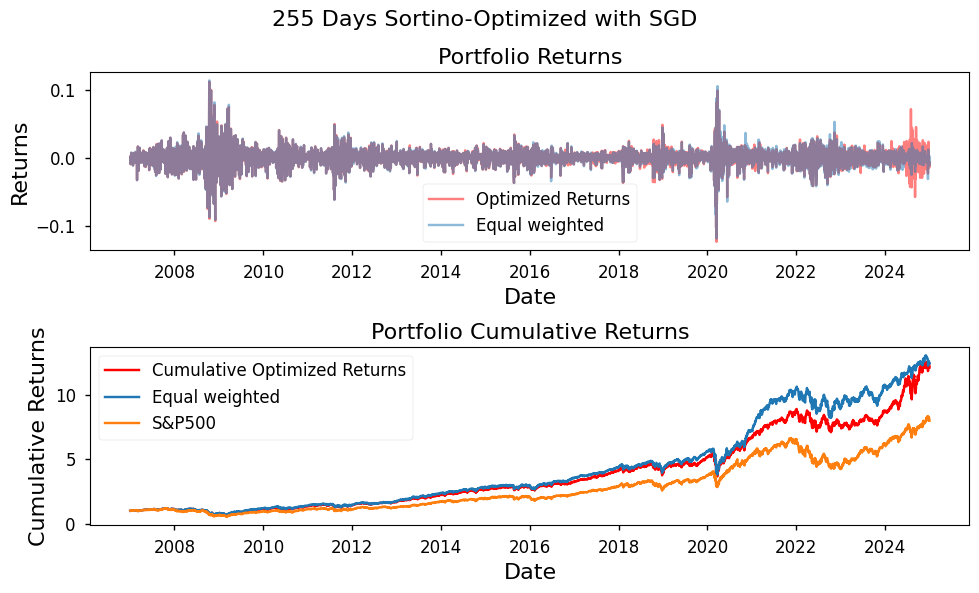

In [183]:
fig, axes = plt.subplots(2, 1, figsize = (10, 6))
axes[0].plot(
    returns.index,
    return_logs, 
    label = 'Optimized Returns',
    color = 'red',
    alpha = .5
)
axes[1].plot(
    returns.index,
    (return_logs + 1).cumprod(dim = 0), 
    label = 'Cumulative Optimized Returns',
    color = 'red',
)

# We also compare against an equal weighted basket of all stocks in our universe. 
equal_weighted_portfolio_weights = np.ones(returns.shape[1] - 1) / (returns.shape[1] - 1) 
axes[0].plot(
    returns.index, 
    np.dot(equal_weighted_portfolio_weights, returns.iloc[:, :-1].T), 
    label = 'Equal weighted',
    color = 'C0',
    alpha = .5
)

axes[1].plot(
    returns.index, 
    (np.dot(equal_weighted_portfolio_weights, returns.iloc[:, :-1].T) + 1).cumprod(), 
    label = 'Equal weighted',
    color = 'C0'
)

axes[1].plot(
    returns.index, 
    (sprtrn+1).cumprod(),
    label = 'S&P500',
    color = 'C1'
)

axes[0].set_title('Portfolio Returns')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Returns')

axes[1].set_title('Portfolio Cumulative Returns')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Cumulative Returns')

axes[0].legend()
axes[1].legend()

fig.suptitle("255 Days Sortino-Optimized with SGD", fontsize=16)

plt.tight_layout()
plt.show()

This actually shows... we did a good job selecting the 110 stocks. However, we would have been better off holding just those 110 stocks in an equal-weighted portfolio.

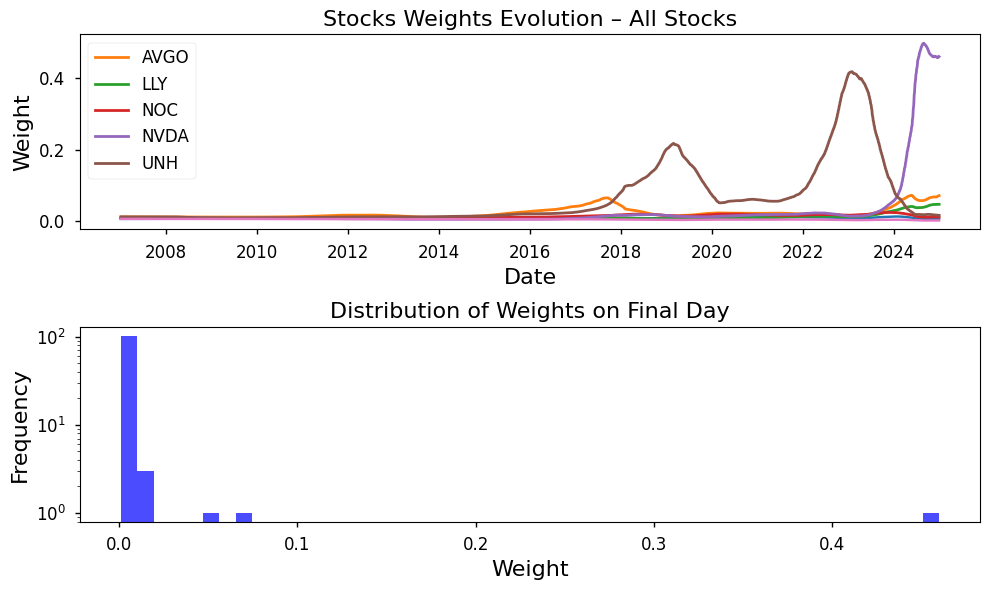

In [169]:
fig, axes= plt.subplots(2, 1, figsize = (10, 6))

top_five_holdings = np.argsort(weights_log[-1])[-5:][::-1]
for i in range(weights_log.shape[1]):
    if i in top_five_holdings:
        axes[0].plot(returns.index, weights_log[:, i], linewidth=2, label=returns.columns[i])
    else:
        if i % 100 == 0:
            axes[0].plot(returns.index, weights_log[:, i])

axes[0].xaxis.set_major_locator(mdates.YearLocator(2))  
axes[0].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

axes[0].set_title("Stocks Weights Evolution – All Stocks")
axes[0].set_xlabel("Date")
axes[0].set_ylabel("Weight")
axes[0].legend()

axes[1].hist(
    weights_log[-1], 
    bins=50, 
    color='blue', 
    alpha=0.7,
    log=True
)
axes[1].set_title("Distribution of Weights on Final Day")
axes[1].set_xlabel("Weight")
axes[1].set_ylabel("Frequency")
plt.tight_layout()

plt.show()

## Adding max drawdown to objective function

In [199]:
# set up
window_size = 255
tickers = [
    "AAPL", "MSFT", "NVDA", "GOOGL", "AMZN", "META", "AVGO", "ORCL", "IBM", "CSCO",
    "JPM", "V", "MA", "GS", "MS", "BAC", "C", "AXP", "SCHW",
    "UNH", "JNJ", "LLY", "PFE", "MRNA", "BMY", "GILD", "CVS", "VRTX", "ISRG",
    "WMT", "NKE", "PG", "TGT", "COST", "KO", "PEP", "MCD", "SBUX", "YUM",
    "XOM", "CVX", "NEE", "DUK", "SO", "D", "ENB", "SLB", "EOG", "PSX",
    "DE", "LMT", "RTX", "BA", "CAT", "GE", "HON", "UPS", "EMR", "NOC",
    "PLD", "AMT", "EQIX", "O", "SPG", "VICI", "DLR", "WY", "EQR", "PSA",
    "TSLA", "FDX", "UPS", "GM", "F", "RIVN", "NIO", "CSX", "UNP", "DAL",
    "TSM", "ASML", "AMD", "TXN", "INTC", "MU", "QCOM", "LRCX", "NXPI", "ADI",
    "ADM", "BG", "CF", "TSN", "MOS", "FMC", "CAG", "SYY", "HRL", "MDLZ",
    "NFLX", "DIS", "PARA", "WBD", "CMCSA", "SPOT", "LYV", "TTWO", "EA",
    "GME", "AMC"
]
start = "2007-01-01"
end = "2025-04-15"

# data access
# print(f"Accessing data from WRDS...")
# conn = wrds.Connection()
# stock_data = conn.raw_sql(
#     f"""
#     SELECT DISTINCT t1.ticker, t1.permno, t2.date, t2.ret
#     FROM crsp.msenames t1, crsp.dsf t2
#     WHERE t1.permno = t2.permno
#     AND date BETWEEN '{start}' AND '{end}'
#     AND t1.ticker IN ({', '.join([f"'{ticker}'" for ticker in tickers])})
# """,
#     date_cols=['date']
# ).set_index('date')

# risk_free_data = conn.raw_sql(
#     f"""
#     SELECT date, rf
#     FROM ff.factors_daily
#     WHERE date BETWEEN '{start}' AND '{end}'
# """,
#     date_cols=['date']
# ).set_index('date')

# returns = stock_data.pivot_table(
#     index = ['date'],
#     columns = ['ticker'],
#     values = ['ret'],
#     fill_value = 0
# )['ret'].merge(
#     risk_free_data, 
#     left_index=True, 
#     right_index=True, 
#     how='left'
# )
# returns.to_csv('returns_110tickers_2017_2025.csv')

# Objectige function
def calculate_sharpe(
        returns: torch.tensor,
        risk_free_rate: torch.tensor = None
    ):
    if risk_free_rate is not None:
        excess_returns = returns - risk_free_rate
    else:
        excess_returns = returns
    sharpe = torch.mean(excess_returns, dim=0) / torch.std(excess_returns, dim=0)
    return sharpe

def calculate_sortino(
        returns: torch.tensor,
        min_acceptable_return: torch.tensor
    ):
    if min_acceptable_return is not None:
        excess_returns = returns - min_acceptable_return
    downside_deviation = torch.std(
        torch.where(excess_returns < 0, excess_returns, torch.tensor(0.0)),
    )
    sortino = torch.mean(excess_returns, dim=0) / (downside_deviation + eps**2)
    return sortino

def calculate_max_drawdown(
        returns: torch.tensor
):
    """calculates max drawdown for the duration of the returns passed
    i.e. expects returns to be trimmed to the period of interest

    max drawdown is defined to be positive, takes the range [0, \infty)
    """
    cum_returns = (returns + 1).cumprod(dim=0)
    return (cum_returns.max() - cum_returns[-1]) / (cum_returns.max() + eps **2)

def calculate_objective_func(
        returns: torch.tensor,
        risk_free_rate: torch.tensor = None
    ):
    return calculate_sortino(returns, risk_free_rate) - calculate_max_drawdown(returns)

return_logs = torch.zeros(
    size = (returns.shape[0],), 
    dtype=torch.float32
)
rolling_return_list = []

# returns.shape[1] - 1 because we don't allow investing in 
# risk free asset for the moment 
print(f"Initializing optimization...")
weights = torch.rand(
    size = (returns.shape[1] - 1,), 
    requires_grad=True
)
optimizer = torch.optim.SGD([weights], lr=0.5)
weights_log = np.zeros((returns.shape[0], returns.shape[1] - 1))

for i, date in enumerate(returns.index):
    if i % 5 == 0:
        print(f"Step {i} of {returns.shape[0]}", end = '\r')

    normalized_weights = torch.nn.functional.softmax(weights, dim=0)
    daily_returns = torch.tensor(
        returns.loc[date].T[:-1],
        dtype=torch.float32
    )
    ret = torch.dot(normalized_weights, daily_returns)

    # for logging
    return_logs[i] = ret.detach()
    rolling_return_list.append(ret)

    if len(rolling_return_list) > window_size:
        rolling_return_list.pop(0)
        past_returns = torch.stack(rolling_return_list)
        past_rf = torch.tensor(
            returns.iloc[max(0, i - window_size):i]['rf'].values,
            dtype=torch.float32
        )
        objective = -calculate_objective_func(
            past_returns,
            past_rf
        )
        optimizer.zero_grad()
        objective.backward(retain_graph=True)
        optimizer.step()
    
    weights_log[i] = normalized_weights.detach().numpy()


Initializing optimization...


/var/folders/sp/cw_2m19j25xbvgpdjz48gclh0000gn/T/ipykernel_22308/4181097285.py:118: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  daily_returns = torch.tensor(


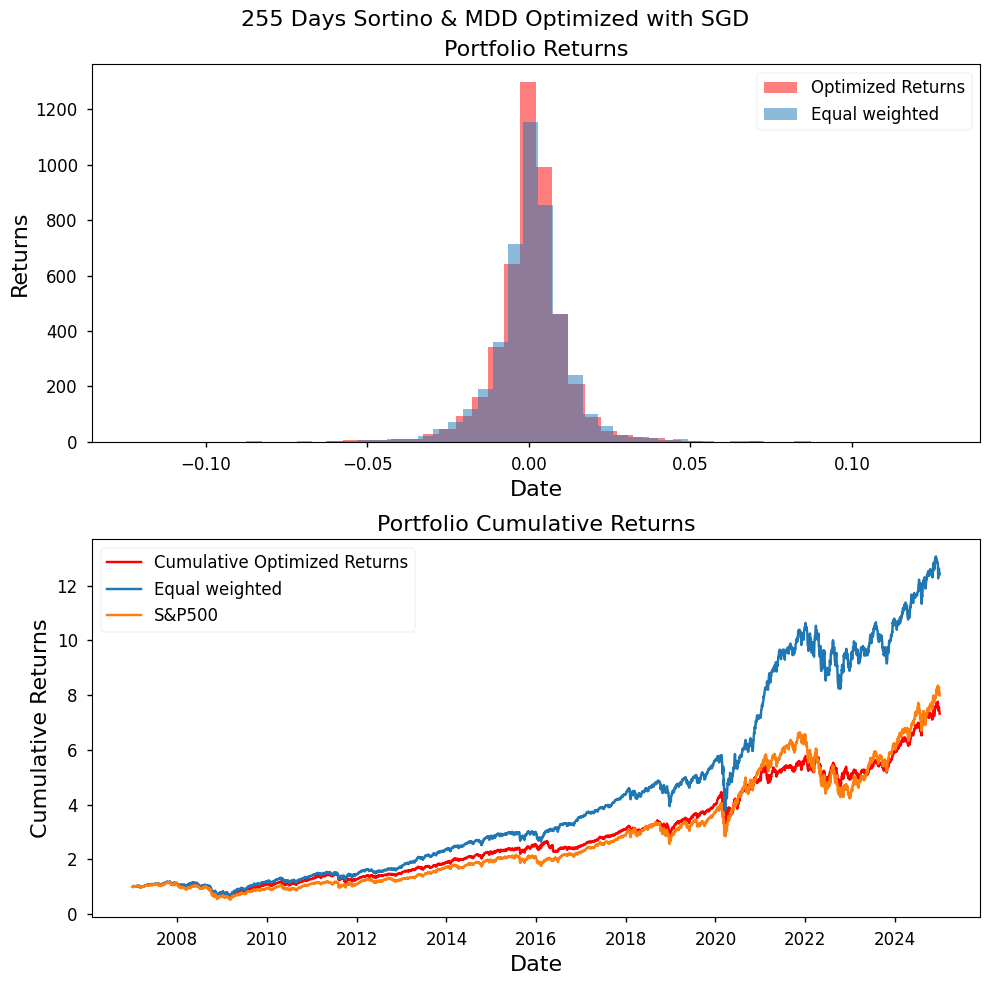

In [200]:
fig, axes = plt.subplots(2, 1, figsize = (10, 10))
axes[0].hist(
    return_logs, 
    label = 'Optimized Returns',
    color = 'red',
    alpha = .5,
    bins = 50
)
axes[1].plot(
    returns.index,
    (return_logs + 1).cumprod(dim = 0), 
    label = 'Cumulative Optimized Returns',
    color = 'red',
)

# We also compare against an equal weighted basket of all stocks in our universe. 
equal_weighted_portfolio_weights = np.ones(returns.shape[1] - 1) / (returns.shape[1] - 1) 
axes[0].hist(
    np.dot(equal_weighted_portfolio_weights, returns.iloc[:, :-1].T), 
    label = 'Equal weighted',
    color = 'C0',
    alpha = .5,
    bins = 50
)

axes[1].plot(
    returns.index, 
    (np.dot(equal_weighted_portfolio_weights, returns.iloc[:, :-1].T) + 1).cumprod(), 
    label = 'Equal weighted',
    color = 'C0'
)

axes[1].plot(
    returns.index, 
    (sprtrn+1).cumprod(),
    label = 'S&P500',
    color = 'C1'
)

axes[0].set_title('Portfolio Returns')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Returns')

axes[1].set_title('Portfolio Cumulative Returns')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Cumulative Returns')

axes[0].legend()
axes[1].legend()

fig.suptitle("255 Days Sortino & MDD Optimized with SGD", fontsize=16)

plt.tight_layout()
plt.show()

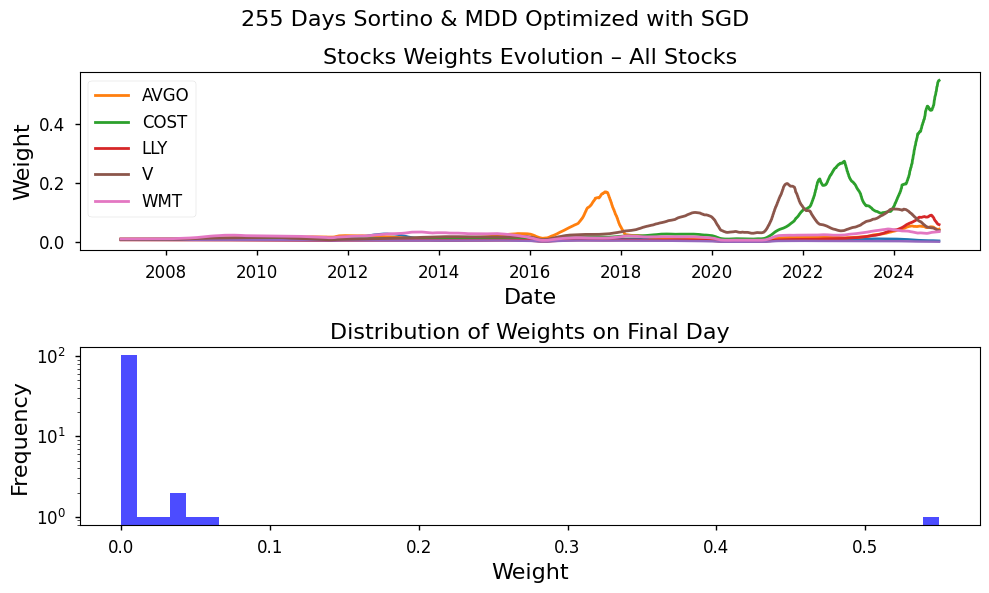

In [201]:
fig, axes= plt.subplots(2, 1, figsize = (10, 6))

top_five_holdings = np.argsort(weights_log[-1])[-5:][::-1]
for i in range(weights_log.shape[1]):
    if i in top_five_holdings:
        axes[0].plot(returns.index, weights_log[:, i], linewidth=2, label=returns.columns[i])
    else:
        if i % 100 == 0:
            axes[0].plot(returns.index, weights_log[:, i])

axes[0].xaxis.set_major_locator(mdates.YearLocator(2))  
axes[0].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

axes[0].set_title("Stocks Weights Evolution – All Stocks")
axes[0].set_xlabel("Date")
axes[0].set_ylabel("Weight")
axes[0].legend()

axes[1].hist(
    weights_log[-1], 
    bins=50, 
    color='blue', 
    alpha=0.7,
    log=True
)
axes[1].set_title("Distribution of Weights on Final Day")
axes[1].set_xlabel("Weight")
axes[1].set_ylabel("Frequency")

fig.suptitle("255 Days Sortino & MDD Optimized with SGD", fontsize=16)
plt.tight_layout()
plt.show()

In [202]:
# set up
window_size = 10
tickers = [
    "AAPL", "MSFT", "NVDA", "GOOGL", "AMZN", "META", "AVGO", "ORCL", "IBM", "CSCO",
    "JPM", "V", "MA", "GS", "MS", "BAC", "C", "AXP", "SCHW",
    "UNH", "JNJ", "LLY", "PFE", "MRNA", "BMY", "GILD", "CVS", "VRTX", "ISRG",
    "WMT", "NKE", "PG", "TGT", "COST", "KO", "PEP", "MCD", "SBUX", "YUM",
    "XOM", "CVX", "NEE", "DUK", "SO", "D", "ENB", "SLB", "EOG", "PSX",
    "DE", "LMT", "RTX", "BA", "CAT", "GE", "HON", "UPS", "EMR", "NOC",
    "PLD", "AMT", "EQIX", "O", "SPG", "VICI", "DLR", "WY", "EQR", "PSA",
    "TSLA", "FDX", "UPS", "GM", "F", "RIVN", "NIO", "CSX", "UNP", "DAL",
    "TSM", "ASML", "AMD", "TXN", "INTC", "MU", "QCOM", "LRCX", "NXPI", "ADI",
    "ADM", "BG", "CF", "TSN", "MOS", "FMC", "CAG", "SYY", "HRL", "MDLZ",
    "NFLX", "DIS", "PARA", "WBD", "CMCSA", "SPOT", "LYV", "TTWO", "EA",
    "GME", "AMC"
]
start = "2007-01-01"
end = "2025-04-15"

# data access
# print(f"Accessing data from WRDS...")
# conn = wrds.Connection()
# stock_data = conn.raw_sql(
#     f"""
#     SELECT DISTINCT t1.ticker, t1.permno, t2.date, t2.ret
#     FROM crsp.msenames t1, crsp.dsf t2
#     WHERE t1.permno = t2.permno
#     AND date BETWEEN '{start}' AND '{end}'
#     AND t1.ticker IN ({', '.join([f"'{ticker}'" for ticker in tickers])})
# """,
#     date_cols=['date']
# ).set_index('date')

# risk_free_data = conn.raw_sql(
#     f"""
#     SELECT date, rf
#     FROM ff.factors_daily
#     WHERE date BETWEEN '{start}' AND '{end}'
# """,
#     date_cols=['date']
# ).set_index('date')

# returns = stock_data.pivot_table(
#     index = ['date'],
#     columns = ['ticker'],
#     values = ['ret'],
#     fill_value = 0
# )['ret'].merge(
#     risk_free_data, 
#     left_index=True, 
#     right_index=True, 
#     how='left'
# )
# returns.to_csv('returns_110tickers_2017_2025.csv')

# Objectige function
def calculate_sharpe(
        returns: torch.tensor,
        risk_free_rate: torch.tensor = None
    ):
    if risk_free_rate is not None:
        excess_returns = returns - risk_free_rate
    else:
        excess_returns = returns
    sharpe = torch.mean(excess_returns, dim=0) / torch.std(excess_returns, dim=0)
    return sharpe

def calculate_sortino(
        returns: torch.tensor,
        min_acceptable_return: torch.tensor
    ):
    if min_acceptable_return is not None:
        excess_returns = returns - min_acceptable_return
    downside_deviation = torch.std(
        torch.where(excess_returns < 0, excess_returns, torch.tensor(0.0)),
    )
    sortino = torch.mean(excess_returns, dim=0) / (downside_deviation + eps**2)
    return sortino

def calculate_max_drawdown(
        returns: torch.tensor
):
    """calculates max drawdown for the duration of the returns passed
    i.e. expects returns to be trimmed to the period of interest

    max drawdown is defined to be positive, takes the range [0, \infty)
    """
    cum_returns = (returns + 1).cumprod(dim=0)
    return (cum_returns.max() - cum_returns[-1]) / (cum_returns.max() + eps **2)

def calculate_objective_func(
        returns: torch.tensor,
        risk_free_rate: torch.tensor = None
    ):
    return calculate_sortino(returns, risk_free_rate) - calculate_max_drawdown(returns)

return_logs = torch.zeros(
    size = (returns.shape[0],), 
    dtype=torch.float32
)
rolling_return_list = []

# returns.shape[1] - 1 because we don't allow investing in 
# risk free asset for the moment 
print(f"Initializing optimization...")
weights = torch.rand(
    size = (returns.shape[1] - 1,), 
    requires_grad=True
)
optimizer = torch.optim.SGD([weights], lr=0.5)
weights_log = np.zeros((returns.shape[0], returns.shape[1] - 1))

for i, date in enumerate(returns.index):
    if i % 5 == 0:
        print(f"Step {i} of {returns.shape[0]}", end = '\r')

    normalized_weights = torch.nn.functional.softmax(weights, dim=0)
    daily_returns = torch.tensor(
        returns.loc[date].T[:-1],
        dtype=torch.float32
    )
    ret = torch.dot(normalized_weights, daily_returns)

    # for logging
    return_logs[i] = ret.detach()
    rolling_return_list.append(ret)

    if len(rolling_return_list) > window_size:
        rolling_return_list.pop(0)
        past_returns = torch.stack(rolling_return_list)
        past_rf = torch.tensor(
            returns.iloc[max(0, i - window_size):i]['rf'].values,
            dtype=torch.float32
        )
        objective = -calculate_objective_func(
            past_returns,
            past_rf
        )
        optimizer.zero_grad()
        objective.backward(retain_graph=True)
        optimizer.step()
    
    weights_log[i] = normalized_weights.detach().numpy()


Initializing optimization...


/var/folders/sp/cw_2m19j25xbvgpdjz48gclh0000gn/T/ipykernel_22308/3048399273.py:118: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  daily_returns = torch.tensor(


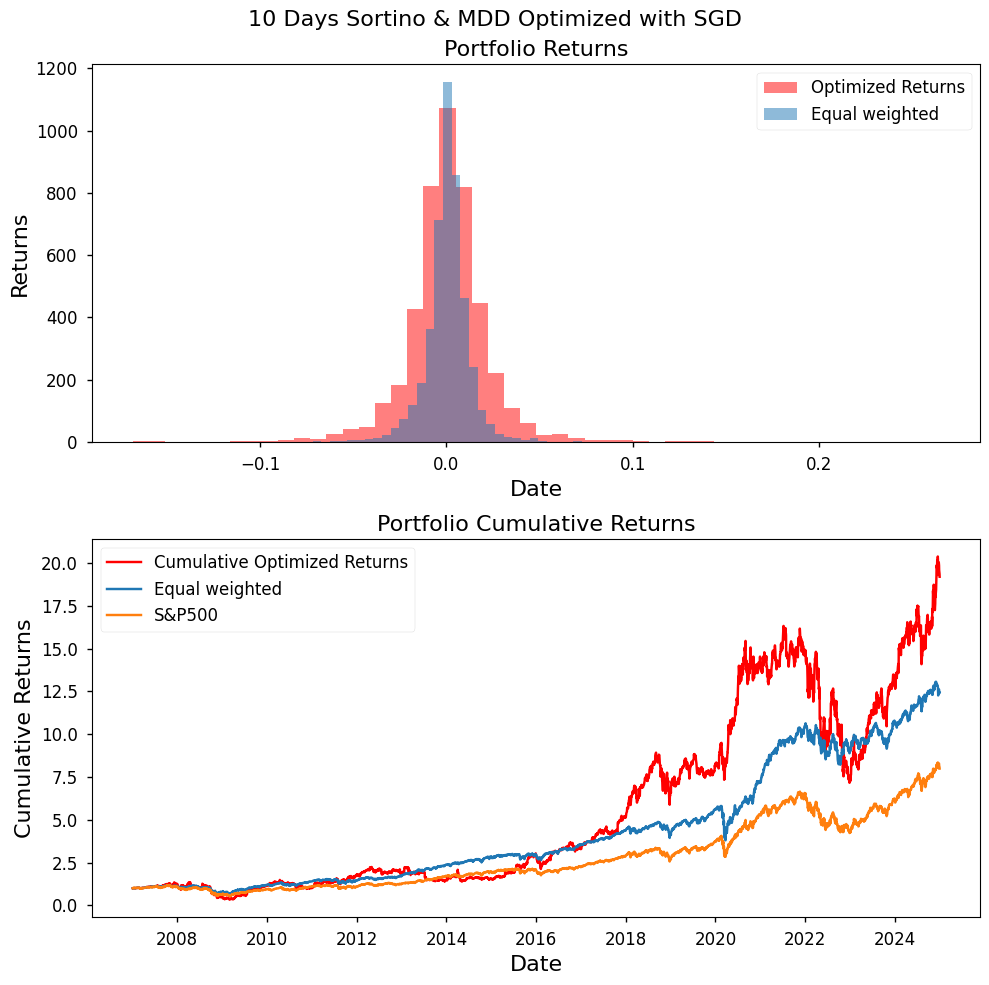

In [203]:
fig, axes = plt.subplots(2, 1, figsize = (10, 10))
axes[0].hist(
    return_logs, 
    label = 'Optimized Returns',
    color = 'red',
    alpha = .5,
    bins = 50
)
axes[1].plot(
    returns.index,
    (return_logs + 1).cumprod(dim = 0), 
    label = 'Cumulative Optimized Returns',
    color = 'red',
)

# We also compare against an equal weighted basket of all stocks in our universe. 
equal_weighted_portfolio_weights = np.ones(returns.shape[1] - 1) / (returns.shape[1] - 1) 
axes[0].hist(
    np.dot(equal_weighted_portfolio_weights, returns.iloc[:, :-1].T), 
    label = 'Equal weighted',
    color = 'C0',
    alpha = .5,
    bins = 50
)

axes[1].plot(
    returns.index, 
    (np.dot(equal_weighted_portfolio_weights, returns.iloc[:, :-1].T) + 1).cumprod(), 
    label = 'Equal weighted',
    color = 'C0'
)

axes[1].plot(
    returns.index, 
    (sprtrn+1).cumprod(),
    label = 'S&P500',
    color = 'C1'
)

axes[0].set_title('Portfolio Returns')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Returns')

axes[1].set_title('Portfolio Cumulative Returns')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Cumulative Returns')

axes[0].legend()
axes[1].legend()

fig.suptitle("10 Days Sortino & MDD Optimized with SGD", fontsize=16)

plt.tight_layout()
plt.show()

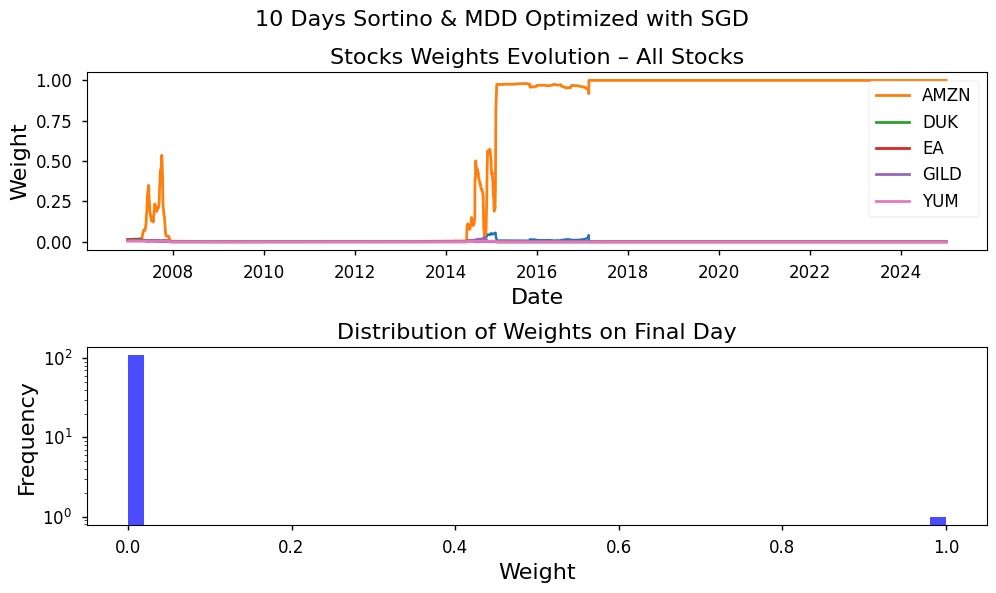

In [204]:
fig, axes= plt.subplots(2, 1, figsize = (10, 6))

top_five_holdings = np.argsort(weights_log[-1])[-5:][::-1]
for i in range(weights_log.shape[1]):
    if i in top_five_holdings:
        axes[0].plot(returns.index, weights_log[:, i], linewidth=2, label=returns.columns[i])
    else:
        if i % 100 == 0:
            axes[0].plot(returns.index, weights_log[:, i])

axes[0].xaxis.set_major_locator(mdates.YearLocator(2))  
axes[0].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

axes[0].set_title("Stocks Weights Evolution – All Stocks")
axes[0].set_xlabel("Date")
axes[0].set_ylabel("Weight")
axes[0].legend()

axes[1].hist(
    weights_log[-1], 
    bins=50, 
    color='blue', 
    alpha=0.7,
    log=True
)
axes[1].set_title("Distribution of Weights on Final Day")
axes[1].set_xlabel("Weight")
axes[1].set_ylabel("Frequency")

fig.suptitle("10 Days Sortino & MDD Optimized with SGD", fontsize=16)
plt.tight_layout()
plt.show()

## Adding turnover to objective function

In [206]:
# set up
window_size = 255
tickers = [
    "AAPL", "MSFT", "NVDA", "GOOGL", "AMZN", "META", "AVGO", "ORCL", "IBM", "CSCO",
    "JPM", "V", "MA", "GS", "MS", "BAC", "C", "AXP", "SCHW",
    "UNH", "JNJ", "LLY", "PFE", "MRNA", "BMY", "GILD", "CVS", "VRTX", "ISRG",
    "WMT", "NKE", "PG", "TGT", "COST", "KO", "PEP", "MCD", "SBUX", "YUM",
    "XOM", "CVX", "NEE", "DUK", "SO", "D", "ENB", "SLB", "EOG", "PSX",
    "DE", "LMT", "RTX", "BA", "CAT", "GE", "HON", "UPS", "EMR", "NOC",
    "PLD", "AMT", "EQIX", "O", "SPG", "VICI", "DLR", "WY", "EQR", "PSA",
    "TSLA", "FDX", "UPS", "GM", "F", "RIVN", "NIO", "CSX", "UNP", "DAL",
    "TSM", "ASML", "AMD", "TXN", "INTC", "MU", "QCOM", "LRCX", "NXPI", "ADI",
    "ADM", "BG", "CF", "TSN", "MOS", "FMC", "CAG", "SYY", "HRL", "MDLZ",
    "NFLX", "DIS", "PARA", "WBD", "CMCSA", "SPOT", "LYV", "TTWO", "EA",
    "GME", "AMC"
]
start = "2007-01-01"
end = "2025-04-15"

# Objectige function
def calculate_sharpe(
        returns: torch.tensor,
        risk_free_rate: torch.tensor = None
    ):
    if risk_free_rate is not None:
        excess_returns = returns - risk_free_rate
    else:
        excess_returns = returns
    sharpe = torch.mean(excess_returns, dim=0) / torch.std(excess_returns, dim=0)
    return sharpe

def calculate_sortino(
        returns: torch.tensor,
        min_acceptable_return: torch.tensor
    ):
    if min_acceptable_return is not None:
        excess_returns = returns - min_acceptable_return
    downside_deviation = torch.std(
        torch.where(excess_returns < 0, excess_returns, torch.tensor(0.0)),
    )
    sortino = torch.mean(excess_returns, dim=0) / (downside_deviation + eps**2)
    return sortino

def calculate_max_drawdown(
        returns: torch.tensor
):
    """calculates max drawdown for the duration of the returns passed
    i.e. expects returns to be trimmed to the period of interest

    max drawdown is defined to be positive, takes the range [0, \infty)
    """
    cum_returns = (returns + 1).cumprod(dim=0)
    return (cum_returns.max() - cum_returns[-1]) / (cum_returns.max() + eps **2)

def calculate_turnover(
        new_weights: torch.tensor,
        prev_weights: torch.tensor
):
    """Turnover is defined to be the sum of absolute differences
    between the new weights and the previous weights, divided by 2.
    Takes the range [0, \infty)

    This value should be minimized
    """
    return torch.sum(torch.abs(new_weights - prev_weights)) / 2

def calculate_objective_func(
        returns: torch.tensor,
        risk_free_rate: torch.tensor,
        new_weights,
        prev_weights
    ):
    return (
        calculate_sortino(returns, risk_free_rate) 
        - calculate_max_drawdown(returns)
        - calculate_turnover(
            new_weights,
            prev_weights
        )
    )


return_logs = torch.zeros(
    size = (returns.shape[0],), 
    dtype=torch.float32
)
rolling_return_list = []

# returns.shape[1] - 1 because we don't allow investing in 
# risk free asset for the moment 
print(f"Initializing optimization...")
weights = torch.rand(
    size = (returns.shape[1] - 1,), 
    requires_grad=True
)
optimizer = torch.optim.SGD([weights], lr=0.5)
weights_log = torch.zeros((returns.shape[0], returns.shape[1] - 1))

for i, date in enumerate(returns.index):
    if i % 5 == 0:
        print(f"Step {i} of {returns.shape[0]}", end = '\r')

    normalized_weights = torch.nn.functional.softmax(weights, dim=0)
    daily_returns = torch.tensor(
        returns.loc[date].T[:-1],
        dtype=torch.float32
    )
    ret = torch.dot(normalized_weights, daily_returns)

    # for logging
    return_logs[i] = ret.detach()
    rolling_return_list.append(ret)

    if len(rolling_return_list) > window_size:
        rolling_return_list.pop(0)
        past_returns = torch.stack(rolling_return_list)
        past_rf = torch.tensor(
            returns.iloc[max(0, i - window_size):i]['rf'].values,
            dtype=torch.float32
        )
        objective = -calculate_objective_func(
            past_returns,
            past_rf,
            normalized_weights,
            weights_log[i - 1]
        )
        optimizer.zero_grad()
        objective.backward(retain_graph=True)
        optimizer.step()
    
    weights_log[i] = normalized_weights


Initializing optimization...


/var/folders/sp/cw_2m19j25xbvgpdjz48gclh0000gn/T/ipykernel_22308/4095290411.py:104: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  daily_returns = torch.tensor(


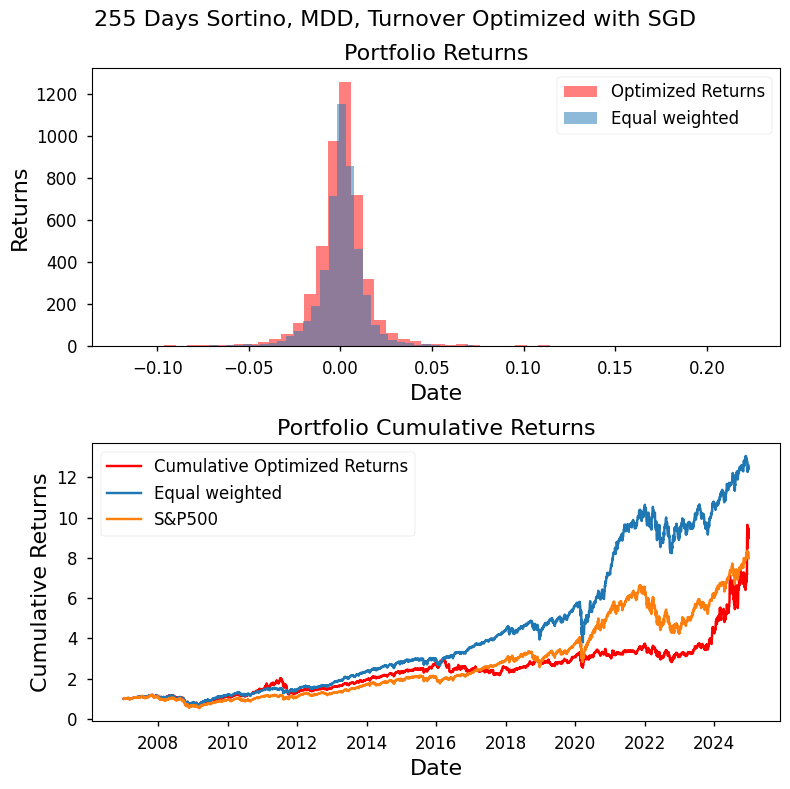

In [207]:
fig, axes = plt.subplots(2, 1, figsize = (8, 8))
axes[0].hist(
    return_logs, 
    label = 'Optimized Returns',
    color = 'red',
    alpha = .5,
    bins = 50
)
axes[1].plot(
    returns.index,
    (return_logs + 1).cumprod(dim = 0), 
    label = 'Cumulative Optimized Returns',
    color = 'red',
)

# We also compare against an equal weighted basket of all stocks in our universe. 
equal_weighted_portfolio_weights = np.ones(returns.shape[1] - 1) / (returns.shape[1] - 1) 
axes[0].hist(
    np.dot(equal_weighted_portfolio_weights, returns.iloc[:, :-1].T), 
    label = 'Equal weighted',
    color = 'C0',
    alpha = .5,
    bins = 50
)

axes[1].plot(
    returns.index, 
    (np.dot(equal_weighted_portfolio_weights, returns.iloc[:, :-1].T) + 1).cumprod(), 
    label = 'Equal weighted',
    color = 'C0'
)

axes[1].plot(
    returns.index, 
    (sprtrn+1).cumprod(),
    label = 'S&P500',
    color = 'C1'
)

axes[0].set_title('Portfolio Returns')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Returns')

axes[1].set_title('Portfolio Cumulative Returns')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Cumulative Returns')

axes[0].legend()
axes[1].legend()

fig.suptitle("255 Days Sortino, MDD, Turnover Optimized with SGD", fontsize=16)

plt.tight_layout()
plt.show()

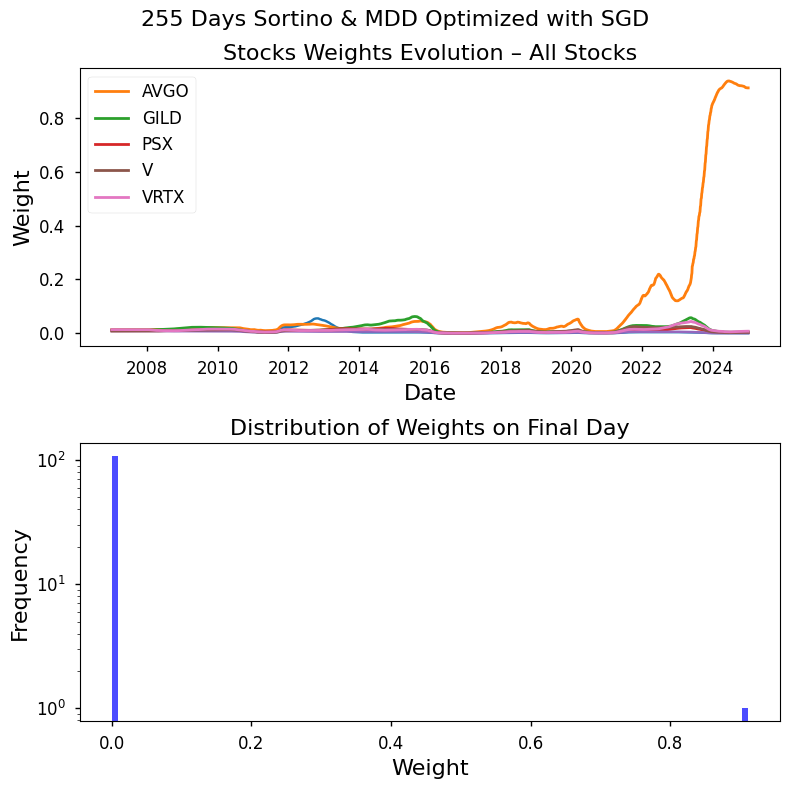

In [210]:
fig, axes= plt.subplots(2, 1, figsize = (8, 8))

weights_copy = weights_log.detach().numpy()

top_five_holdings = np.argsort(weights_copy[-1])[-5:][::-1]
for i in range(weights_copy.shape[1]):
    if i in top_five_holdings:
        axes[0].plot(returns.index, weights_copy[:, i], linewidth=2, label=returns.columns[i])
    else:
        if i % 100 == 0:
            axes[0].plot(returns.index, weights_copy[:, i])

axes[0].xaxis.set_major_locator(mdates.YearLocator(2))  
axes[0].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

axes[0].set_title("Stocks Weights Evolution – All Stocks")
axes[0].set_xlabel("Date")
axes[0].set_ylabel("Weight")
axes[0].legend()

axes[1].hist(
    weights_copy[-1], 
    bins=100, 
    color='blue', 
    alpha=0.7,
    log=True
)
axes[1].set_title("Distribution of Weights on Final Day")
axes[1].set_xlabel("Weight")
axes[1].set_ylabel("Frequency")

fig.suptitle("255 Days Sortino & MDD Optimized with SGD", fontsize=16)
plt.tight_layout()
plt.show()

In [211]:
# set up
window_size = 10

return_logs = torch.zeros(
    size = (returns.shape[0],), 
    dtype=torch.float32
)
rolling_return_list = []

# returns.shape[1] - 1 because we don't allow investing in 
# risk free asset for the moment 
print(f"Initializing optimization...")
weights = torch.rand(
    size = (returns.shape[1] - 1,), 
    requires_grad=True
)
optimizer = torch.optim.SGD([weights], lr=0.5)
weights_log = torch.zeros((returns.shape[0], returns.shape[1] - 1))

for i, date in enumerate(returns.index):
    if i % 5 == 0:
        print(f"Step {i} of {returns.shape[0]}", end = '\r')

    normalized_weights = torch.nn.functional.softmax(weights, dim=0)
    daily_returns = torch.tensor(
        returns.loc[date].T[:-1],
        dtype=torch.float32
    )
    ret = torch.dot(normalized_weights, daily_returns)

    # for logging
    return_logs[i] = ret.detach()
    rolling_return_list.append(ret)

    if len(rolling_return_list) > window_size:
        rolling_return_list.pop(0)
        past_returns = torch.stack(rolling_return_list)
        past_rf = torch.tensor(
            returns.iloc[max(0, i - window_size):i]['rf'].values,
            dtype=torch.float32
        )
        objective = -calculate_objective_func(
            past_returns,
            past_rf,
            normalized_weights,
            weights_log[i - 1]
        )
        optimizer.zero_grad()
        objective.backward(retain_graph=True)
        optimizer.step()
    
    weights_log[i] = normalized_weights


Initializing optimization...


/var/folders/sp/cw_2m19j25xbvgpdjz48gclh0000gn/T/ipykernel_22308/183330697.py:25: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  daily_returns = torch.tensor(


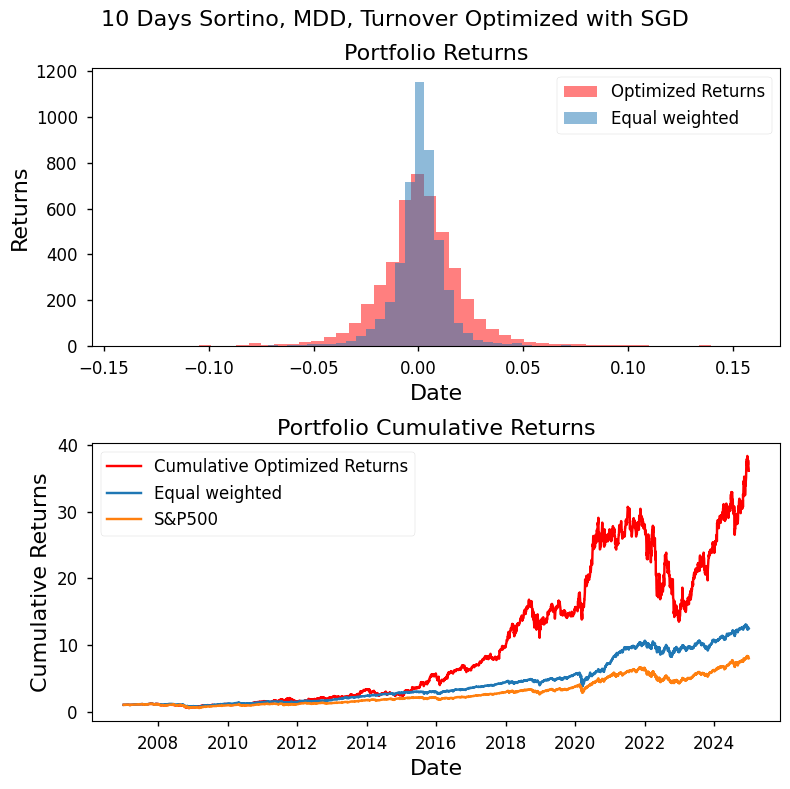

In [214]:
fig, axes = plt.subplots(2, 1, figsize = (8, 8))
axes[0].hist(
    return_logs, 
    label = 'Optimized Returns',
    color = 'red',
    alpha = .5,
    bins = 50
)
axes[1].plot(
    returns.index,
    (return_logs + 1).cumprod(dim = 0), 
    label = 'Cumulative Optimized Returns',
    color = 'red',
)

# We also compare against an equal weighted basket of all stocks in our universe. 
equal_weighted_portfolio_weights = np.ones(returns.shape[1] - 1) / (returns.shape[1] - 1) 
axes[0].hist(
    np.dot(equal_weighted_portfolio_weights, returns.iloc[:, :-1].T), 
    label = 'Equal weighted',
    color = 'C0',
    alpha = .5,
    bins = 50
)

axes[1].plot(
    returns.index, 
    (np.dot(equal_weighted_portfolio_weights, returns.iloc[:, :-1].T) + 1).cumprod(), 
    label = 'Equal weighted',
    color = 'C0'
)

axes[1].plot(
    returns.index, 
    (sprtrn+1).cumprod(),
    label = 'S&P500',
    color = 'C1'
)

axes[0].set_title('Portfolio Returns')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Returns')

axes[1].set_title('Portfolio Cumulative Returns')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Cumulative Returns')

axes[0].legend()
axes[1].legend()

fig.suptitle("10 Days Sortino, MDD, Turnover Optimized with SGD", fontsize=16)

plt.tight_layout()
plt.show()

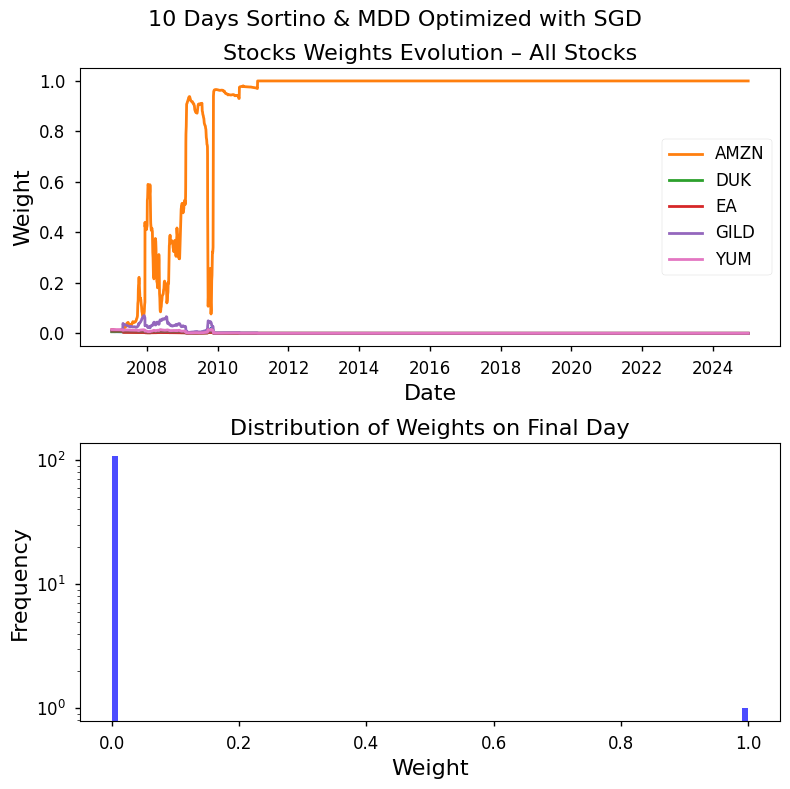

In [215]:
fig, axes= plt.subplots(2, 1, figsize = (8, 8))

weights_copy = weights_log.detach().numpy()

top_five_holdings = np.argsort(weights_copy[-1])[-5:][::-1]
for i in range(weights_copy.shape[1]):
    if i in top_five_holdings:
        axes[0].plot(returns.index, weights_copy[:, i], linewidth=2, label=returns.columns[i])
    else:
        if i % 100 == 0:
            axes[0].plot(returns.index, weights_copy[:, i])

axes[0].xaxis.set_major_locator(mdates.YearLocator(2))  
axes[0].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

axes[0].set_title("Stocks Weights Evolution – All Stocks")
axes[0].set_xlabel("Date")
axes[0].set_ylabel("Weight")
axes[0].legend()

axes[1].hist(
    weights_copy[-1], 
    bins=100, 
    color='blue', 
    alpha=0.7,
    log=True
)
axes[1].set_title("Distribution of Weights on Final Day")
axes[1].set_xlabel("Weight")
axes[1].set_ylabel("Frequency")

fig.suptitle("10 Days Sortino & MDD Optimized with SGD", fontsize=16)
plt.tight_layout()
plt.show()

## Managing sparsity 

Fixing issue of setting a stock weight to 0 and never allocating to it again

Right now, it seems like once we set a stock to 0, we never allocate to it again. This is related to the issue of sparsity. Will do a little more research into what people think about sparsity in a portfolio (is it good to be more diversified? or do we want to avoid holding a position in every stock possible). 



In [5]:
returns = pd.read_csv('./returns_110tickers_2017_2025.csv', index_col = 0)
returns.index = pd.to_datetime(returns.index)
returns

,AAPL,ADI,ADM,AMC,AMD,AMT,AMZN,ASML,AVGO,AXP,...,UPS,V,VICI,VRTX,WBD,WMT,WY,XOM,YUM,rf
date,,,,,,,,,,,,,,,,,,,,,
2007-01-03,-0.012258,-0.000913,0.003129,0.008294,-0.040786,0.019313,-0.019260,-0.010556,0.000000,-0.002637,...,-0.000133,0.000000,0.000000,-0.013896,-0.012923,0.029667,0.026185,-0.032885,0.001020,0.00022
2007-01-04,0.022196,0.017357,-0.005615,-0.011163,0.013832,-0.003947,0.005168,0.011079,0.000000,-0.007290,...,0.001601,0.000000,0.000000,0.002439,-0.019638,0.004837,-0.010069,-0.018756,-0.002718,0.00022
2007-01-05,-0.007121,-0.011374,-0.001568,-0.033868,-0.004043,-0.008719,-0.013625,0.004464,0.000000,-0.013184,...,-0.012518,0.000000,0.000000,-0.031901,-0.045652,-0.008162,-0.003205,0.007151,-0.008688,0.00022
2007-01-08,0.004938,0.007872,0.005027,-0.014760,-0.012177,0.028518,-0.022674,0.011313,0.000000,0.009471,...,0.003102,0.000000,0.000000,-0.063111,0.043768,-0.008230,0.008806,-0.008056,-0.002406,0.00022
2007-01-09,0.083070,-0.001502,-0.024383,0.004994,0.009245,0.014512,0.007467,-0.010787,0.000000,-0.006366,...,-0.004033,0.000000,0.000000,0.009538,-0.045986,0.008298,-0.005127,-0.007708,0.003790,0.00022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-24,0.011478,0.014891,0.004364,-0.014563,0.013563,0.001790,0.017729,-0.001845,0.031547,0.015596,...,0.004056,0.010813,0.008972,0.007180,0.010537,0.025789,0.006410,0.000941,0.008516,0.00017
2024-12-26,0.003176,-0.000138,-0.000395,-0.002463,-0.009740,-0.003952,-0.008732,-0.005349,0.023698,0.001747,...,0.000792,0.000811,-0.003762,0.006051,0.006635,0.001187,-0.003185,0.000846,0.007407,0.00017
2024-12-27,-0.013242,-0.004907,-0.000593,-0.012346,0.001040,-0.002663,-0.014534,-0.003171,-0.014713,-0.009671,...,-0.001978,-0.007011,-0.006522,-0.004602,-0.000942,-0.012178,-0.006390,-0.000094,-0.005662,0.00017


In [ ]:
# set up
window_size = 10


def calculate_sharpe(
        returns: torch.tensor,
        risk_free_rate: torch.tensor = None
    ):
    if risk_free_rate is not None:
        excess_returns = returns - risk_free_rate
    else:
        excess_returns = returns
    sharpe = torch.mean(excess_returns, dim=0) / torch.std(excess_returns, dim=0)
    return sharpe

def calculate_sortino(
        returns: torch.tensor,
        min_acceptable_return: torch.tensor
    ):
    if min_acceptable_return is not None:
        excess_returns = returns - min_acceptable_return
    downside_deviation = torch.std(
        torch.where(excess_returns < 0, excess_returns, torch.tensor(0.0)),
    )
    sortino = torch.mean(excess_returns, dim=0) / (downside_deviation + eps**2)
    return sortino

def calculate_max_drawdown(
        returns: torch.tensor
):
    """calculates max drawdown for the duration of the returns passed
    i.e. expects returns to be trimmed to the period of interest

    max drawdown is defined to be positive, takes the range [0, \infty)
    """
    cum_returns = (returns + 1).cumprod(dim=0)
    return (cum_returns.max() - cum_returns[-1]) / (cum_returns.max() + eps **2)

def calculate_turnover(
        new_weights: torch.tensor,
        prev_weights: torch.tensor
):
    """Turnover is defined to be the sum of absolute differences
    between the new weights and the previous weights, divided by 2.
    Takes the range [0, \infty)

    This value should be minimized
    """
    return torch.sum(torch.abs(new_weights - prev_weights)) / 2

def calculate_objective_func(
        returns: torch.tensor,
        risk_free_rate: torch.tensor,
        new_weights,
        prev_weights
    ):
    return (
        calculate_sortino(returns, risk_free_rate) 
        - calculate_max_drawdown(returns)
        - calculate_turnover(
            new_weights,
            prev_weights
        )
    )


return_logs = torch.zeros(
    size = (returns.shape[0],), 
    dtype=torch.float32
)
rolling_return_list = []


# returns.shape[1] - 1 because we don't allow investing in 
# risk free asset for the moment 
print(f"Initializing optimization...")
weights = torch.rand(
    size = (returns.shape[1] - 1,), 
    requires_grad=True
)
optimizer = torch.optim.SGD([weights], lr=0.5)
weights_log = torch.zeros((returns.shape[0], returns.shape[1] - 1))

for i, date in enumerate(returns.index):
    if i % 5 == 0:
        print(f"Step {i} of {returns.shape[0]}", end = '\r')
    
    # adding random noise
    with torch.no_grad():
        weights += eps * torch.randn_like(weights)

    normalized_weights = torch.nn.functional.softmax(weights, dim=0)
    daily_returns = torch.tensor(
        returns.loc[date].T[:-1],
        dtype=torch.float32
    )
    ret = torch.dot(normalized_weights, daily_returns)

    # for logging
    return_logs[i] = ret.detach()
    rolling_return_list.append(ret)

    if len(rolling_return_list) > window_size:
        rolling_return_list.pop(0)
        past_returns = torch.stack(rolling_return_list)
        past_rf = torch.tensor(
            returns.iloc[max(0, i - window_size):i]['rf'].values,
            dtype=torch.float32
        )
        objective = -calculate_objective_func(
            past_returns,
            past_rf,
            normalized_weights,
            weights_log[i - 1]
        )
        optimizer.zero_grad()
        objective.backward(retain_graph=True)
        optimizer.step()
    
    weights_log[i] = normalized_weights


Initializing optimization...


/var/folders/sp/cw_2m19j25xbvgpdjz48gclh0000gn/T/ipykernel_14976/163817096.py:93: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  daily_returns = torch.tensor(


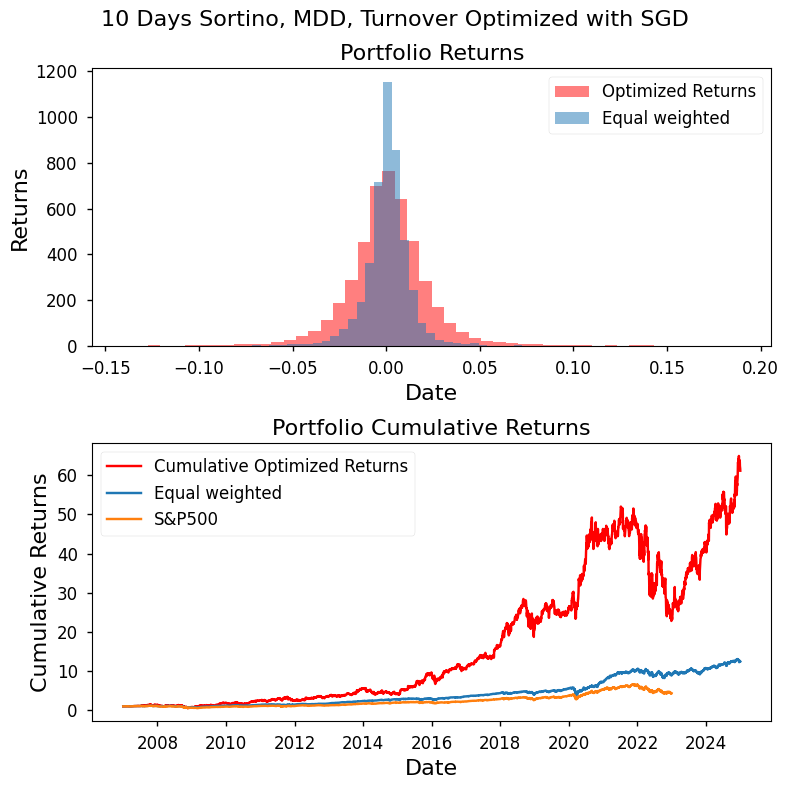

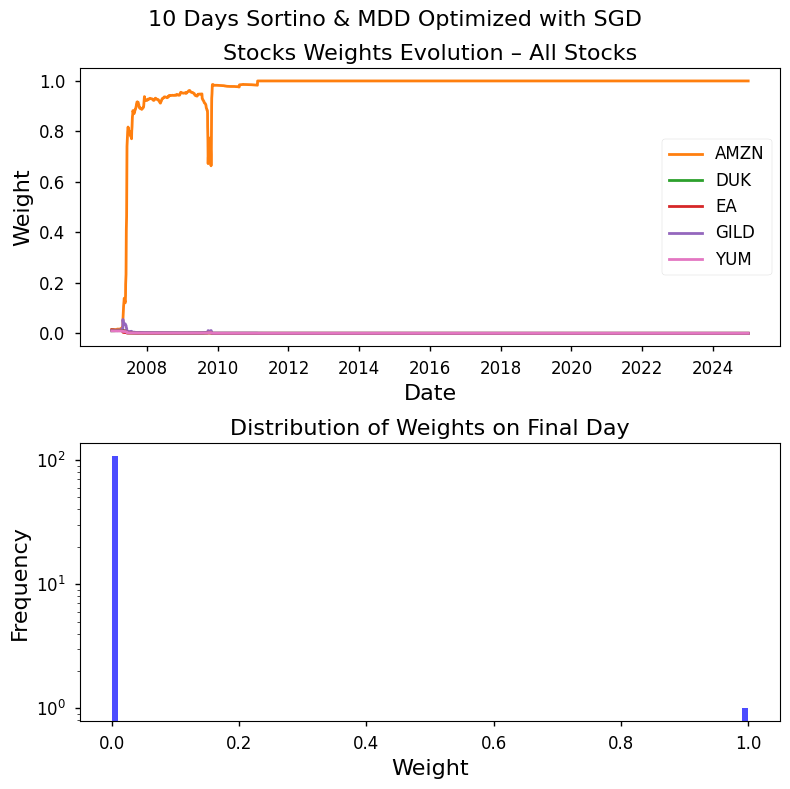

In [17]:
fig, axes = plt.subplots(2, 1, figsize = (8, 8))
axes[0].hist(
    return_logs, 
    label = 'Optimized Returns',
    color = 'red',
    alpha = .5,
    bins = 50
)
axes[1].plot(
    returns.index,
    (return_logs + 1).cumprod(dim = 0), 
    label = 'Cumulative Optimized Returns',
    color = 'red',
)

# We also compare against an equal weighted basket of all stocks in our universe. 
equal_weighted_portfolio_weights = np.ones(returns.shape[1] - 1) / (returns.shape[1] - 1) 
axes[0].hist(
    np.dot(equal_weighted_portfolio_weights, returns.iloc[:, :-1].T), 
    label = 'Equal weighted',
    color = 'C0',
    alpha = .5,
    bins = 50
)

axes[1].plot(
    returns.index, 
    (np.dot(equal_weighted_portfolio_weights, returns.iloc[:, :-1].T) + 1).cumprod(), 
    label = 'Equal weighted',
    color = 'C0'
)

axes[1].plot(
    sprtrn.index,
    (sprtrn+1).cumprod(),
    label = 'S&P500',
    color = 'C1'
)

axes[0].set_title('Portfolio Returns')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Returns')

axes[1].set_title('Portfolio Cumulative Returns')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Cumulative Returns')

axes[0].legend()
axes[1].legend()

fig.suptitle("10 Days Sortino, MDD, Turnover Optimized with SGD", fontsize=16)

plt.tight_layout()
plt.show()


fig, axes= plt.subplots(2, 1, figsize = (8, 8))

weights_copy = weights_log.detach().numpy()

top_five_holdings = np.argsort(weights_copy[-1])[-5:][::-1]
for i in range(weights_copy.shape[1]):
    if i in top_five_holdings:
        axes[0].plot(returns.index, weights_copy[:, i], linewidth=2, label=returns.columns[i])
    else:
        if i % 100 == 0:
            axes[0].plot(returns.index, weights_copy[:, i])

axes[0].xaxis.set_major_locator(mdates.YearLocator(2))  
axes[0].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

axes[0].set_title("Stocks Weights Evolution – All Stocks")
axes[0].set_xlabel("Date")
axes[0].set_ylabel("Weight")
axes[0].legend()

axes[1].hist(
    weights_copy[-1], 
    bins=100, 
    color='blue', 
    alpha=0.7,
    log=True
)
axes[1].set_title("Distribution of Weights on Final Day")
axes[1].set_xlabel("Weight")
axes[1].set_ylabel("Frequency")

fig.suptitle("10 Days Sortino & MDD Optimized with SGD", fontsize=16)
plt.tight_layout()
plt.show()

Doesn't seem like this is doing what we want it to do. 

## Portfolio Concentration related issues

We need some way of managing portfolio concentration. 

Some ideas are: 

1. Herfindahl-Hirschman Index (HHI)

This measures the degree of concentration. Defined as the sum of squared weights:
$$
HHI = \sum_{i=1}^n w_i^2
$$
- Low HHI: more diversified
- High HHI: more concentrated

Effective Number of Positions (ENP)

This is the inverse of HHI:
$$
\text{ENP} = \frac{1}{\sum w_i^2}
$$
- ENP ≈ 1 → concentrated in one asset
- ENP ≈ n → equally weighted

We try enforcing a soft constraint that ENP should be within some range (say between 5 and 15)

## Evaluating returns

We want to have some way of measuring the quality of a set of returns.

Current ideas 
- benchmarks 
    - random guessing 
    - equal weighted
    - S&P
- calculate metrics
    - Sharpe
    - max DD
    - alpha
        - CAPM alpha
        - FF3 alpha

## Objected Oriented

Loading library list...
Done
Accessing data from WRDS...
Initializing optimization...


0it [00:00, ?it/s]/Users/fanghema/Desktop/aaSTAT_4830/STAT-4830-project-base/notebooks/../src/OnlinePortfolioOptimizer.py:89: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  daily_returns = torch.tensor(
252it [00:00, 578.13it/s]


Optimization completed.


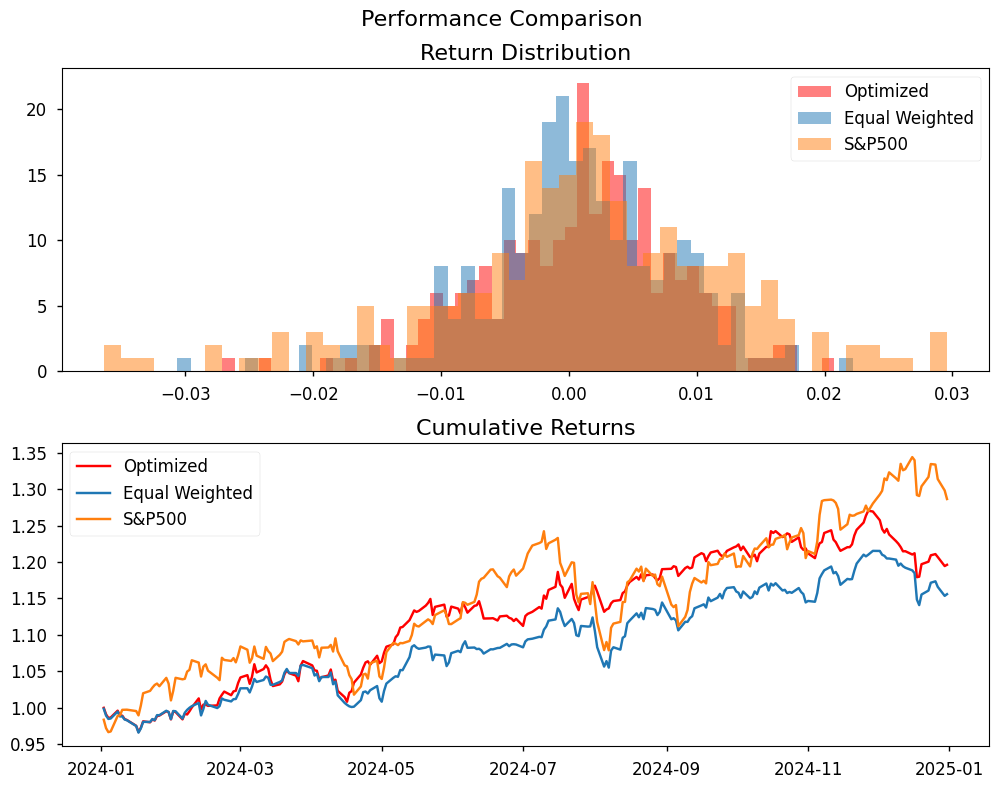

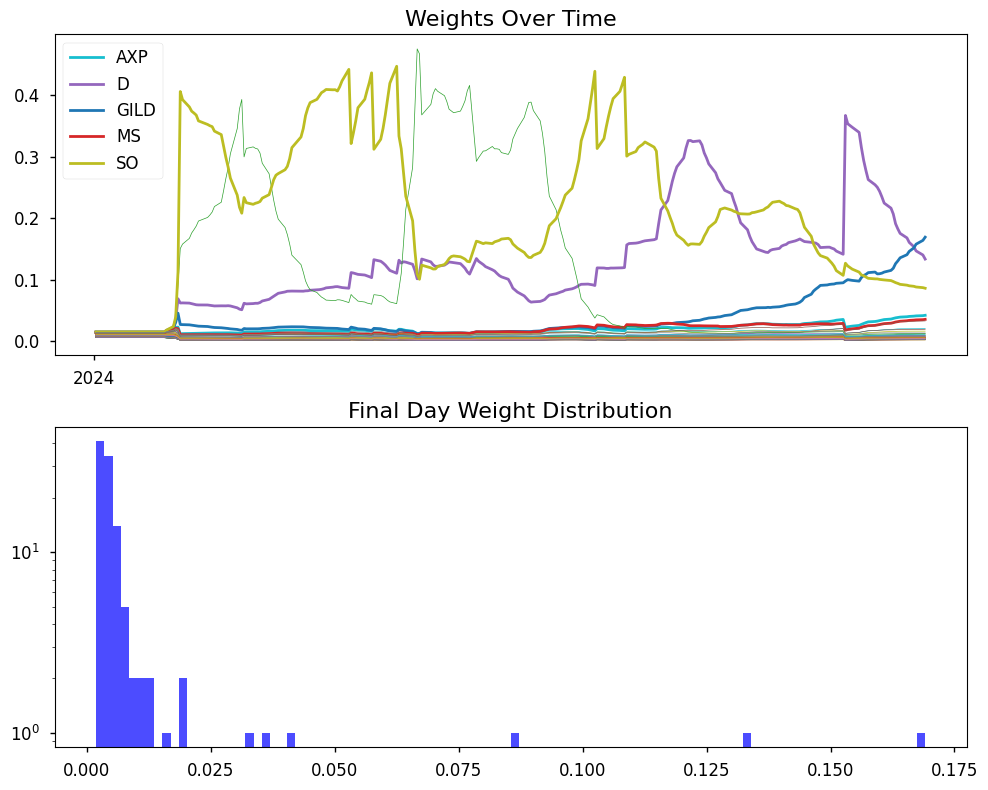

Sharpe: 0.07149404392607522
Max Drawdown: 0.071758315
FF3 Alpha: 0.00018206657263487307


In [ ]:

start = '2024-01-01'
end = '2025-01-01'
tickers = [
    "AAPL", "MSFT", "NVDA", "GOOGL", "AMZN", "META", "AVGO", "ORCL", "IBM", "CSCO",
    "JPM", "V", "MA", "GS", "MS", "BAC", "C", "AXP", "SCHW",
    "UNH", "JNJ", "LLY", "PFE", "MRNA", "BMY", "GILD", "CVS", "VRTX", "ISRG",
    "WMT", "NKE", "PG", "TGT", "COST", "KO", "PEP", "MCD", "SBUX", "YUM",
    "XOM", "CVX", "NEE", "DUK", "SO", "D", "ENB", "SLB", "EOG", "PSX",
    "DE", "LMT", "RTX", "BA", "CAT", "GE", "HON", "UPS", "EMR", "NOC",
    "PLD", "AMT", "EQIX", "O", "SPG", "VICI", "DLR", "WY", "EQR", "PSA",
    "TSLA", "FDX", "UPS", "GM", "F", "RIVN", "NIO", "CSX", "UNP", "DAL",
    "TSM", "ASML", "AMD", "TXN", "INTC", "MU", "QCOM", "LRCX", "NXPI", "ADI",
    "ADM", "BG", "CF", "TSN", "MOS", "FMC", "CAG", "SYY", "HRL", "MDLZ",
    "NFLX", "DIS", "PARA", "WBD", "CMCSA", "SPOT", "LYV", "TTWO", "EA",
    "GME", "AMC"
]

factor_df = (
    conn.raw_sql(
        f"""
            SELECT date, mktrf, smb, hml, rf
            FROM ff.factors_daily
            WHERE date BETWEEN '{start}' AND '{end}'
        """,
        date_cols='date'
    ).set_index('date')
    .replace([np.inf, -np.inf], np.nan)
    .fillna(0)
    .astype(float)
)

print(f"Accessing data from WRDS...")
stock_data = conn.raw_sql(
    f"""
    SELECT DISTINCT t1.ticker, t1.permno, t2.date, t2.ret
    FROM crsp.msenames t1, crsp.dsf t2
    WHERE t1.permno = t2.permno
    AND date BETWEEN '{start}' AND '{end}'
    AND t1.ticker IN ({', '.join([f"'{ticker}'" for ticker in tickers])})
""",
    date_cols=['date']
).set_index('date')

risk_free_data = conn.raw_sql(
    f"""
    SELECT date, rf
    FROM ff.factors_daily
    WHERE date BETWEEN '{start}' AND '{end}'
""",
    date_cols=['date']
).set_index('date')

returns = (
    stock_data.pivot_table(
        index = ['date'],
        columns = ['ticker'],
        values = ['ret'],
        fill_value = 0
    )['ret'].merge(
        risk_free_data, 
        left_index=True, 
        right_index=True, 
        how='left'
    )
    .replace([np.inf, -np.inf], np.nan)
    .fillna(0)
    .astype(float)
)
equal_weights = np.ones(returns.shape[1] - 1) / (returns.shape[1] - 1) 

sprtrn = conn.raw_sql(
    f"""
    SELECT caldt, sprtrn
    FROM crsp.dsbo
    WHERE caldt BETWEEN '{start}' AND '{end}'
""",
    date_cols=['caldt']
).set_index('caldt')




optimizer = OnlinePortfolioOptimizer(
    returns=returns,
    benchmark_returns={
        "Equal Weighted": np.dot(equal_weights, returns.iloc[:, :-1].T),
        "S&P500": sprtrn.values,
    },
    factor_data=factor_df
)

ret_logs, weights_log = optimizer.run()

optimizer.plot_results()
print("Sharpe:", optimizer.evaluate_sharpe())
print("Max Drawdown:", optimizer.evaluate_max_drawdown())

alpha, model = optimizer.evaluate_alpha("FF3")
print("FF3 Alpha:", alpha)

Initializing optimization...


0it [00:00, ?it/s]/Users/fanghema/Desktop/aaSTAT_4830/STAT-4830-project-base/notebooks/../src/OnlinePortfolioOptimizer.py:89: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  daily_returns = torch.tensor(
252it [00:00, 483.70it/s]


Optimization completed.


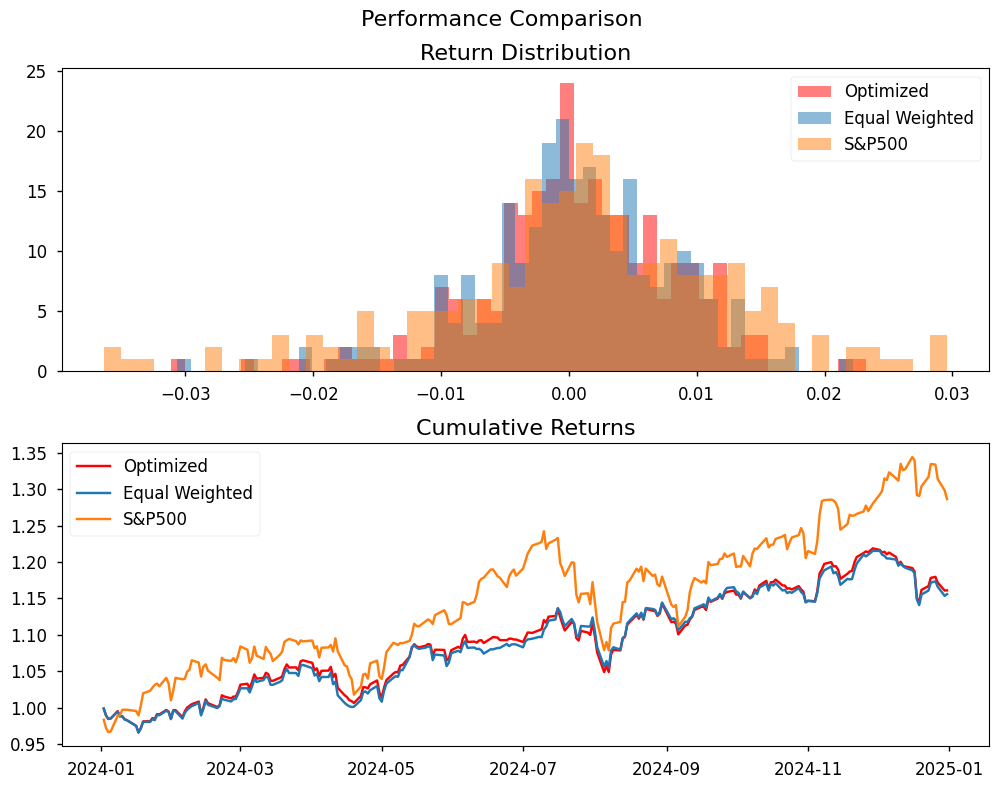

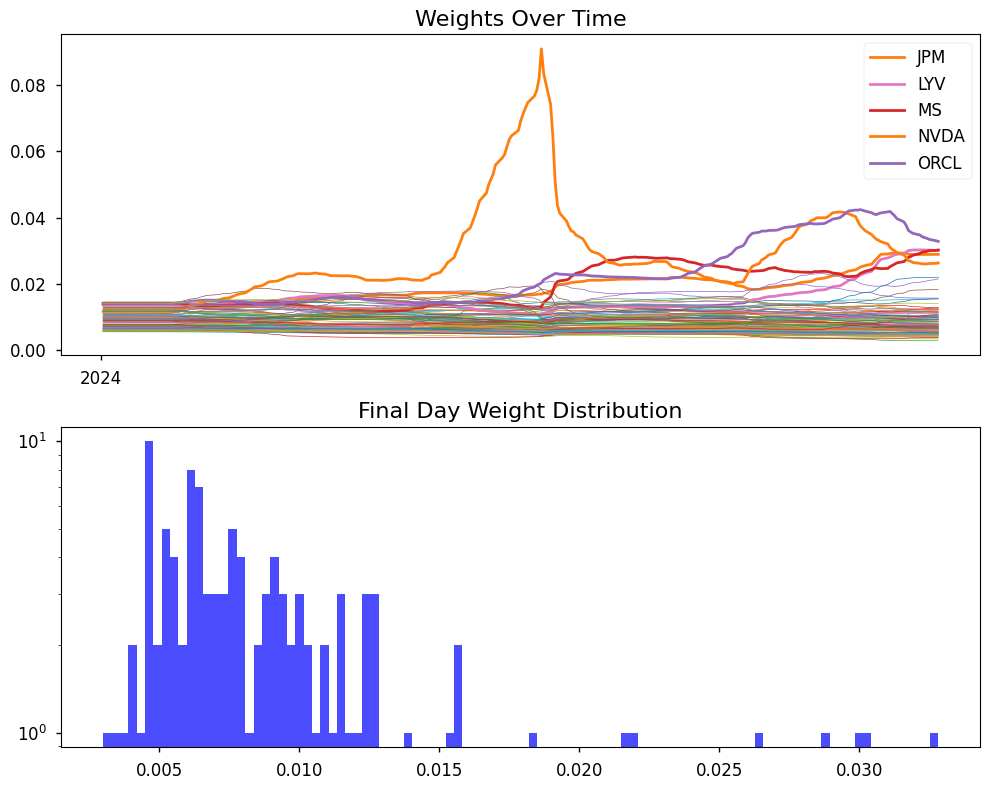

Sharpe: 0.054671120464640656
Max Drawdown: 0.07690902
FF3 Alpha: -0.00014659221986125677


In [ ]:
optimizer = OnlinePortfolioOptimizer(
    returns=returns,
    benchmark_returns={
        "Equal Weighted": np.dot(equal_weights, returns.iloc[:, :-1].T),
        "S&P500": sprtrn.values,
    },
    factor_data=factor_df,
    alphas = [1, 1, 1, 0]
)

ret_logs, weights_log = optimizer.run()

optimizer.plot_results()
print("Sharpe:", optimizer.evaluate_sharpe())
print("Max Drawdown:", optimizer.evaluate_max_drawdown())

alpha, model = optimizer.evaluate_alpha("FF3")
print("FF3 Alpha:", alpha)

Accessing data from WRDS...
Initializing optimization...


0it [00:00, ?it/s]/Users/fanghema/Desktop/aaSTAT_4830/STAT-4830-project-base/notebooks/../src/OnlinePortfolioOptimizer.py:89: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  daily_returns = torch.tensor(
4530it [29:25,  2.57it/s] 


Optimization completed.


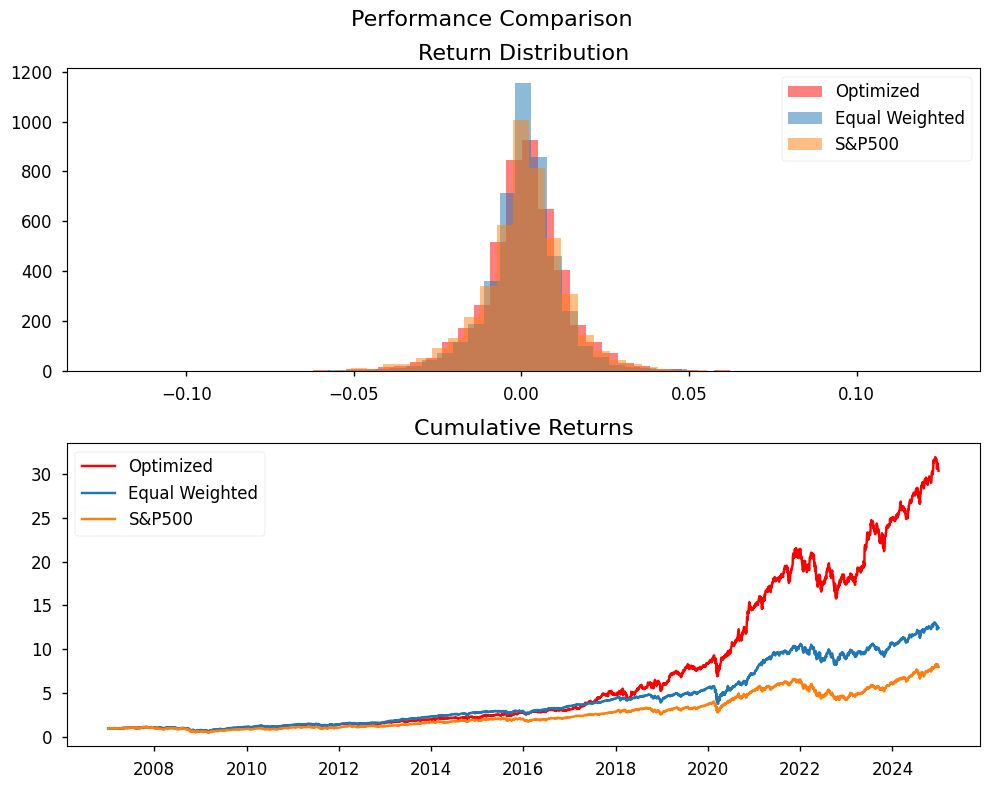

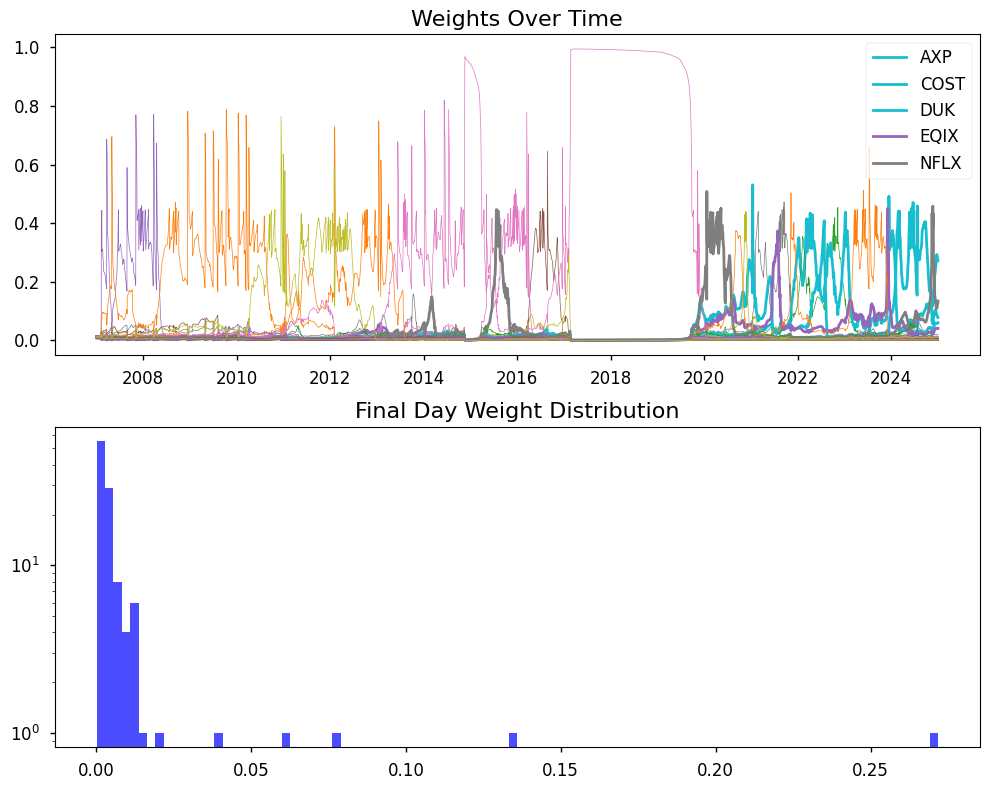

Sharpe: 0.0577867916441953
Max Drawdown: 0.45667523
FF3 Alpha: 0.000397199291111707


In [ ]:
start = '2007-01-01'
end = '2025-01-01'
tickers = [
    "AAPL", "MSFT", "NVDA", "GOOGL", "AMZN", "META", "AVGO", "ORCL", "IBM", "CSCO",
    "JPM", "V", "MA", "GS", "MS", "BAC", "C", "AXP", "SCHW",
    "UNH", "JNJ", "LLY", "PFE", "MRNA", "BMY", "GILD", "CVS", "VRTX", "ISRG",
    "WMT", "NKE", "PG", "TGT", "COST", "KO", "PEP", "MCD", "SBUX", "YUM",
    "XOM", "CVX", "NEE", "DUK", "SO", "D", "ENB", "SLB", "EOG", "PSX",
    "DE", "LMT", "RTX", "BA", "CAT", "GE", "HON", "UPS", "EMR", "NOC",
    "PLD", "AMT", "EQIX", "O", "SPG", "VICI", "DLR", "WY", "EQR", "PSA",
    "TSLA", "FDX", "UPS", "GM", "F", "RIVN", "NIO", "CSX", "UNP", "DAL",
    "TSM", "ASML", "AMD", "TXN", "INTC", "MU", "QCOM", "LRCX", "NXPI", "ADI",
    "ADM", "BG", "CF", "TSN", "MOS", "FMC", "CAG", "SYY", "HRL", "MDLZ",
    "NFLX", "DIS", "PARA", "WBD", "CMCSA", "SPOT", "LYV", "TTWO", "EA",
    "GME", "AMC"
]

factor_df = (
    conn.raw_sql(
        f"""
            SELECT date, mktrf, smb, hml, rf
            FROM ff.factors_daily
            WHERE date BETWEEN '{start}' AND '{end}'
        """,
        date_cols='date'
    ).set_index('date')
    .replace([np.inf, -np.inf], np.nan)
    .fillna(0)
    .astype(float)
)

print(f"Accessing data from WRDS...")
stock_data = conn.raw_sql(
    f"""
    SELECT DISTINCT t1.ticker, t1.permno, t2.date, t2.ret
    FROM crsp.msenames t1, crsp.dsf t2
    WHERE t1.permno = t2.permno
    AND date BETWEEN '{start}' AND '{end}'
    AND t1.ticker IN ({', '.join([f"'{ticker}'" for ticker in tickers])})
""",
    date_cols=['date']
).set_index('date')

risk_free_data = conn.raw_sql(
    f"""
    SELECT date, rf
    FROM ff.factors_daily
    WHERE date BETWEEN '{start}' AND '{end}'
""",
    date_cols=['date']
).set_index('date')

returns = (
    stock_data.pivot_table(
        index = ['date'],
        columns = ['ticker'],
        values = ['ret'],
        fill_value = 0
    )['ret'].merge(
        risk_free_data, 
        left_index=True, 
        right_index=True, 
        how='left'
    )
    .replace([np.inf, -np.inf], np.nan)
    .fillna(0)
    .astype(float)
)
equal_weights = np.ones(returns.shape[1] - 1) / (returns.shape[1] - 1) 

sprtrn = conn.raw_sql(
    f"""
    SELECT caldt, sprtrn
    FROM crsp.dsbo
    WHERE caldt BETWEEN '{start}' AND '{end}'
""",
    date_cols=['caldt']
).set_index('caldt')

optimizer = OnlinePortfolioOptimizer(
    returns=returns,
    benchmark_returns={
        "Equal Weighted": np.dot(equal_weights, returns.iloc[:, :-1].T),
        "S&P500": sprtrn.values,
    },
    factor_data=factor_df
)

ret_logs, weights_log = optimizer.run()

optimizer.plot_results()
print("Sharpe:", optimizer.evaluate_sharpe())
print("Max Drawdown:", optimizer.evaluate_max_drawdown())

alpha, model = optimizer.evaluate_alpha("FF3")
print("FF3 Alpha:", alpha)

In [11]:
start = '2024-01-01'
end = '2025-01-01'

permno_tickers_map = conn.raw_sql(
    f"""
        SELECT DISTINCT permno, ticker
        FROM crsp.msenames
        WHERE namedt BETWEEN '{start}' AND '{end}'
        AND exchcd in (1, 2, 3)
    """
)

In [12]:
permno_tickers_map

,permno,ticker
0,17323,LVO
1,79007,SCVL
2,75405,MPV
3,23866,PTHR
4,89803,AHT
...,...,...
2510,20617,PPTA
2511,18830,AGBA
2512,55976,WMT
2513,20138,CMPO


In [32]:
start = '2007-01-01'
end = '2025-01-01'

permno_tickers_map_07_25 = conn.raw_sql(
    f"""
        SELECT DISTINCT permno, ticker
        FROM crsp.msenames
        WHERE namedt BETWEEN '{start}' AND '{end}'
        AND exchcd in (1, 2, 3)
    """
)

permno_tickers_map_07_25

,permno,ticker
0,22346,TGVC
1,19936,RBAC
2,14134,CINR
3,18168,BSDE
4,54244,BDL
...,...,...
13605,91522,ESA
13606,90077,AFN
13607,91078,IMNP
13608,85298,KNDL


In [21]:
permno_tickers_map_05_25['ticker'].nunique()

14639

In [16]:
conn.raw_sql(
    f"""
        SELECT date, permno, ret
        FROM crsp.dsf
        WHERE permno IN ({', '.join([f"{permno}" for permno in permno_tickers_map['permno']])})
        AND date BETWEEN '2024-01-01' AND '2025-04-22'
    """
)

,date,permno,ret
0,2024-01-02,10026,0.010291
1,2024-01-02,10066,-0.0118
2,2024-01-02,10107,-0.013749
3,2024-01-02,10220,-0.005083
4,2024-01-02,10253,0.096586
...,...,...,...
40926,2024-12-31,93352,0.002646
40927,2024-12-31,93356,0.003108
40928,2024-12-31,93427,0.023841
40929,2024-12-31,93434,-0.052195


In [ ]:
start = '2024-01-01'
end = '2025-01-01'

tickers = conn.raw_sql(
    f"""
        SELECT DISTINCT permno, ticker
        FROM crsp.msenames
        WHERE date BETWEEN '{start}' AND '{end}'
    """
)['ticker']

factor_df = (
    conn.raw_sql(
        f"""
            SELECT date, mktrf, smb, hml, rf
            FROM ff.factors_daily
            WHERE date BETWEEN '{start}' AND '{end}'
        """,
        date_cols='date'
    ).set_index('date')
    .replace([np.inf, -np.inf], np.nan)
    .fillna(0)
    .astype(float)
)

print(f"Accessing data from WRDS...")
stock_data = conn.raw_sql(
    f"""
    SELECT DISTINCT t1.ticker, t1.permno, t2.date, t2.ret
    FROM crsp.msenames t1, crsp.dsf t2
    WHERE t1.permno = t2.permno
    AND date BETWEEN '{start}' AND '{end}'
    AND t1.ticker IN ({', '.join([f"'{ticker}'" for ticker in tickers])})
""",
    date_cols=['date']
).set_index('date')

risk_free_data = conn.raw_sql(
    f"""
    SELECT date, rf
    FROM ff.factors_daily
    WHERE date BETWEEN '{start}' AND '{end}'
""",
    date_cols=['date']
).set_index('date')

returns = (
    stock_data.pivot_table(
        index = ['date'],
        columns = ['ticker'],
        values = ['ret'],
        fill_value = 0
    )['ret'].merge(
        risk_free_data, 
        left_index=True, 
        right_index=True, 
        how='left'
    )
    .replace([np.inf, -np.inf], np.nan)
    .fillna(0)
    .astype(float)
)
equal_weights = np.ones(returns.shape[1] - 1) / (returns.shape[1] - 1) 

sprtrn = conn.raw_sql(
    f"""
    SELECT caldt, sprtrn
    FROM crsp.dsbo
    WHERE caldt BETWEEN '{start}' AND '{end}'
""",
    date_cols=['caldt']
).set_index('caldt')

optimizer = OnlinePortfolioOptimizer(
    returns=returns,
    benchmark_returns={
        "Equal Weighted": np.dot(equal_weights, returns.iloc[:, :-1].T),
        "S&P500": sprtrn.values,
    },
    factor_data=factor_df
)

ret_logs, weights_log = optimizer.run()

optimizer.plot_results()
print("Sharpe:", optimizer.evaluate_sharpe())
print("Max Drawdown:", optimizer.evaluate_max_drawdown())

alpha, model = optimizer.evaluate_alpha("FF3")
print("FF3 Alpha:", alpha)

In [24]:
start = '2005-01-01'
end = '2025-01-01'

permno_tickers_map_05_25 = conn.raw_sql(
    f"""
        SELECT permno, ticker, namedt
        FROM crsp.msenames
        WHERE namedt BETWEEN '{start}' AND '{end}'
        AND exchcd in (1, 2, 3)
    """
)

permno_tickers_map_05_25

,permno,ticker,namedt
0,77443,IOTN,2005-01-03
1,83307,PGI,2005-01-03
2,88980,NAPS,2005-01-03
3,89740,CJBK,2005-01-03
4,90532,SYS,2005-01-03
...,...,...,...
32073,16992,OPTN,2024-12-31
32074,20281,COEP,2024-12-31
32075,23046,OST,2024-12-31
32076,26015,ONEG,2024-12-31


## Retrieving all returns

In [34]:
from tqdm import tqdm
start = '2007-01-01'
end = '2025-01-01'

permno_tickers_map_07_25 = conn.raw_sql(
    f"""
        SELECT DISTINCT permno, ticker
        FROM crsp.msenames
        WHERE namedt <= '{end}' AND nameendt >= '{start}'
        AND exchcd in (1, 2, 3)
    """
)
permnos = permno_tickers_map_07_25['permno'].unique().tolist()

year_chunks = [(year, year + 1) for year in range(2007, 2025)]

for start_year, end_year in tqdm(year_chunks):
    print(f"Fetching data from {start_year} to {end_year}...")

    query = f"""
        SELECT date, permno, ret
        FROM crsp.dsf
        WHERE date >= '{start_year}-01-01' AND date < '{end_year}-01-01'
        AND permno IN ({','.join(map(str, permnos))})
    """

    df = conn.raw_sql(query)
    
    # Save to CSV
    file_name = f"crsp_dsf_{start_year}_{end_year - 1}.csv"
    df.to_csv(file_name, index=False)
    print(f"Saved to {file_name}")

  0%|          | 0/18 [00:00<?, ?it/s]

Fetching data from 2007 to 2008...


  6%|▌         | 1/18 [00:16<04:39, 16.42s/it]

Saved to crsp_dsf_2007_2007.csv
Fetching data from 2008 to 2009...


 11%|█         | 2/18 [00:30<03:58, 14.88s/it]

Saved to crsp_dsf_2008_2008.csv
Fetching data from 2009 to 2010...


 17%|█▋        | 3/18 [00:40<03:14, 12.98s/it]

Saved to crsp_dsf_2009_2009.csv
Fetching data from 2010 to 2011...


 22%|██▏       | 4/18 [00:51<02:47, 11.98s/it]

Saved to crsp_dsf_2010_2010.csv
Fetching data from 2011 to 2012...


 28%|██▊       | 5/18 [01:01<02:27, 11.32s/it]

Saved to crsp_dsf_2011_2011.csv
Fetching data from 2012 to 2013...


 33%|███▎      | 6/18 [01:11<02:09, 10.79s/it]

Saved to crsp_dsf_2012_2012.csv
Fetching data from 2013 to 2014...


 39%|███▉      | 7/18 [01:29<02:24, 13.09s/it]

Saved to crsp_dsf_2013_2013.csv
Fetching data from 2014 to 2015...


 44%|████▍     | 8/18 [01:39<02:02, 12.22s/it]

Saved to crsp_dsf_2014_2014.csv
Fetching data from 2015 to 2016...


 50%|█████     | 9/18 [01:48<01:42, 11.37s/it]

Saved to crsp_dsf_2015_2015.csv
Fetching data from 2016 to 2017...


 56%|█████▌    | 10/18 [01:58<01:27, 10.93s/it]

Saved to crsp_dsf_2016_2016.csv
Fetching data from 2017 to 2018...


 61%|██████    | 11/18 [02:08<01:12, 10.38s/it]

Saved to crsp_dsf_2017_2017.csv
Fetching data from 2018 to 2019...


 67%|██████▋   | 12/18 [02:17<01:01, 10.25s/it]

Saved to crsp_dsf_2018_2018.csv
Fetching data from 2019 to 2020...


 72%|███████▏  | 13/18 [02:27<00:49,  9.88s/it]

Saved to crsp_dsf_2019_2019.csv
Fetching data from 2020 to 2021...


 78%|███████▊  | 14/18 [02:36<00:38,  9.64s/it]

Saved to crsp_dsf_2020_2020.csv
Fetching data from 2021 to 2022...


 83%|████████▎ | 15/18 [02:46<00:29,  9.74s/it]

Saved to crsp_dsf_2021_2021.csv
Fetching data from 2022 to 2023...


 89%|████████▉ | 16/18 [02:56<00:19,  9.95s/it]

Saved to crsp_dsf_2022_2022.csv
Fetching data from 2023 to 2024...


 94%|█████████▍| 17/18 [03:06<00:09,  9.96s/it]

Saved to crsp_dsf_2023_2023.csv
Fetching data from 2024 to 2025...


100%|██████████| 18/18 [03:16<00:00, 10.90s/it]

Saved to crsp_dsf_2024_2024.csv


In [35]:
import pandas as pd
import glob
import os
permno_tickers_map_07_25.to_csv("permno_tickers_map_07_25.csv", index=False)

permno_tickers_map_07_25 = pd.read_csv("permno_tickers_map_07_25.csv")  # Save this if not done already

csv_files = sorted(glob.glob("crsp_dsf_*.csv"))

merged_list = []

for file in csv_files:
    print(f"Merging {file}...")
    df = pd.read_csv(file)
    
    df = df.merge(permno_tickers_map_07_25, on='permno', how='left')
    
    merged_list.append(df)

final_df = pd.concat(merged_list, ignore_index=True)

final_df.to_csv("crsp_dsf_2007_2025_with_ticker.csv", index=False)
print("Saved all merged data to crsp_dsf_2007_2025_with_ticker.csv")

Merging crsp_dsf_2007_2007.csv...
Merging crsp_dsf_2008_2008.csv...
Merging crsp_dsf_2009_2009.csv...
Merging crsp_dsf_2010_2010.csv...
Merging crsp_dsf_2011_2011.csv...
Merging crsp_dsf_2012_2012.csv...
Merging crsp_dsf_2013_2013.csv...
Merging crsp_dsf_2014_2014.csv...
Merging crsp_dsf_2015_2015.csv...
Merging crsp_dsf_2016_2016.csv...
Merging crsp_dsf_2017_2017.csv...
Merging crsp_dsf_2018_2018.csv...
Merging crsp_dsf_2019_2019.csv...
Merging crsp_dsf_2020_2020.csv...
Merging crsp_dsf_2021_2021.csv...
Merging crsp_dsf_2022_2022.csv...
Merging crsp_dsf_2023_2023.csv...
Merging crsp_dsf_2024_2024.csv...
Saved all merged data to crsp_dsf_2007_2025_with_ticker.csv


In [61]:
final_df

,date,permno,ret,ticker
0,2007-01-03,10001,0.000000,EGAS
1,2007-01-03,10001,0.000000,EWST
2,2007-01-03,10002,-0.007445,BTFG
3,2007-01-03,10025,-0.079722,AEPI
4,2007-01-03,10026,-0.009179,JJSF
...,...,...,...,...
35652864,2024-12-31,93426,0.010332,VPG
35652865,2024-12-31,93427,0.023841,FN
35652866,2024-12-31,93429,-0.002705,CBOE
35652867,2024-12-31,93434,-0.052195,SANW


## Live updates

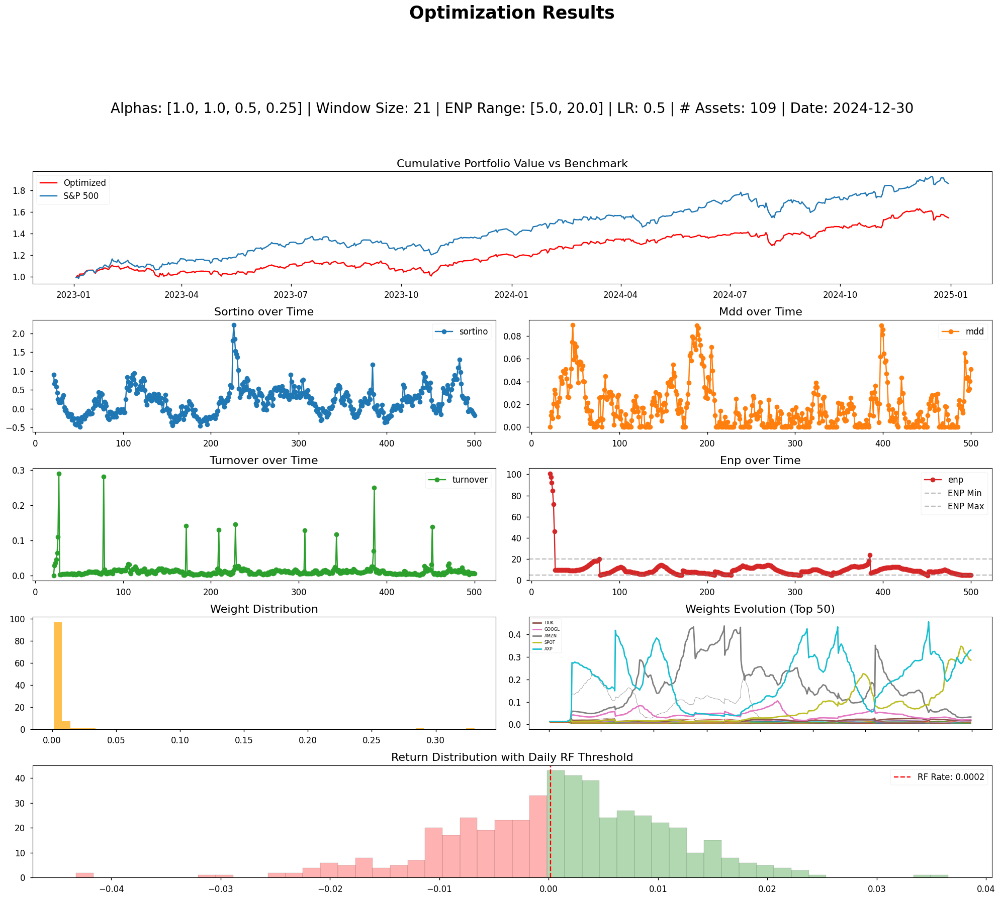

Optimization completed. Animation saved to: optimization.mp4


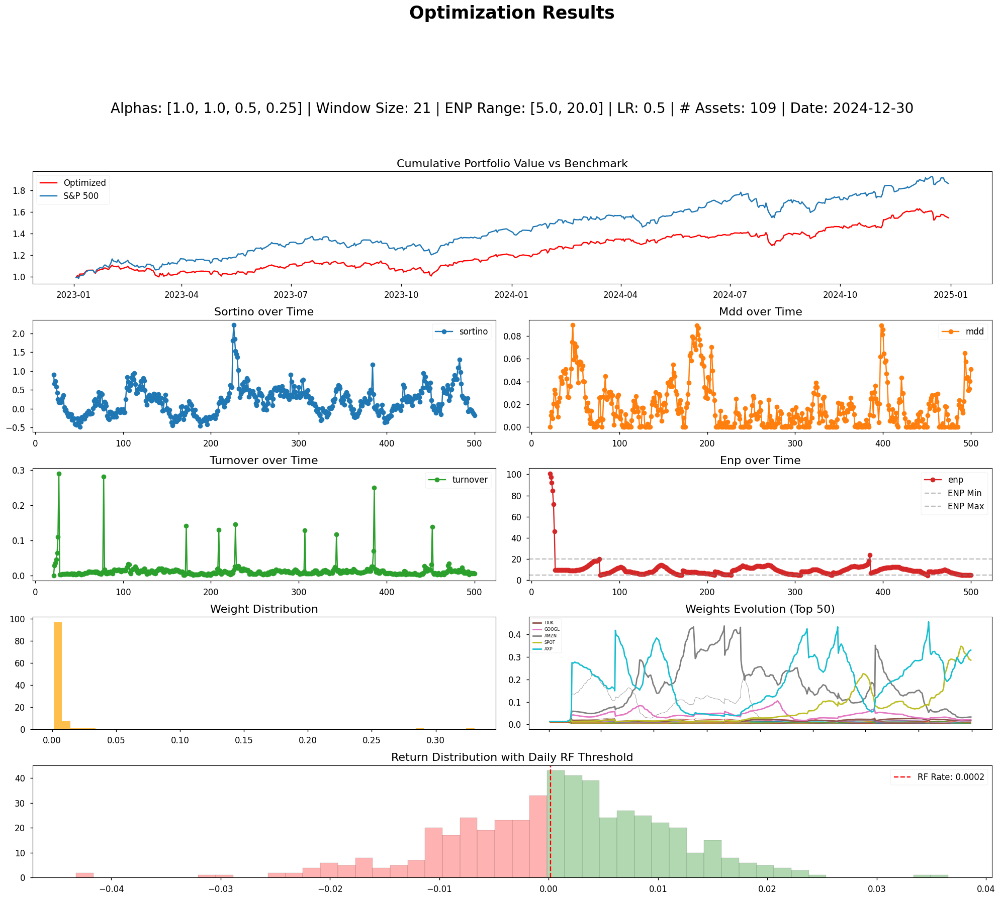

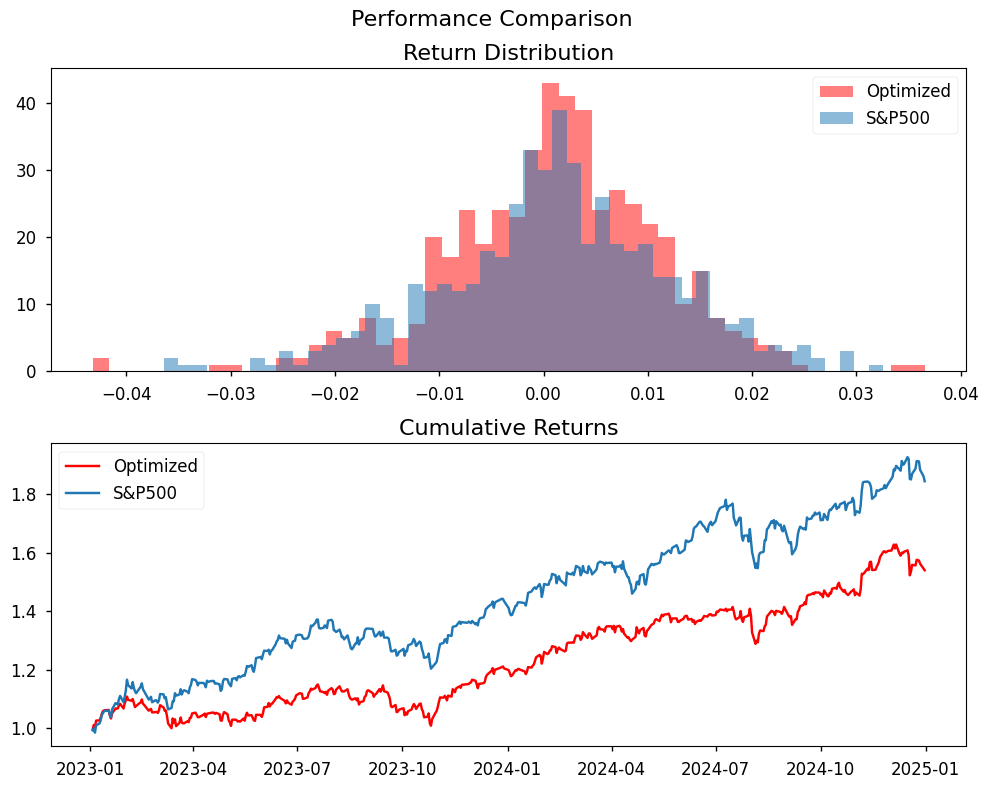

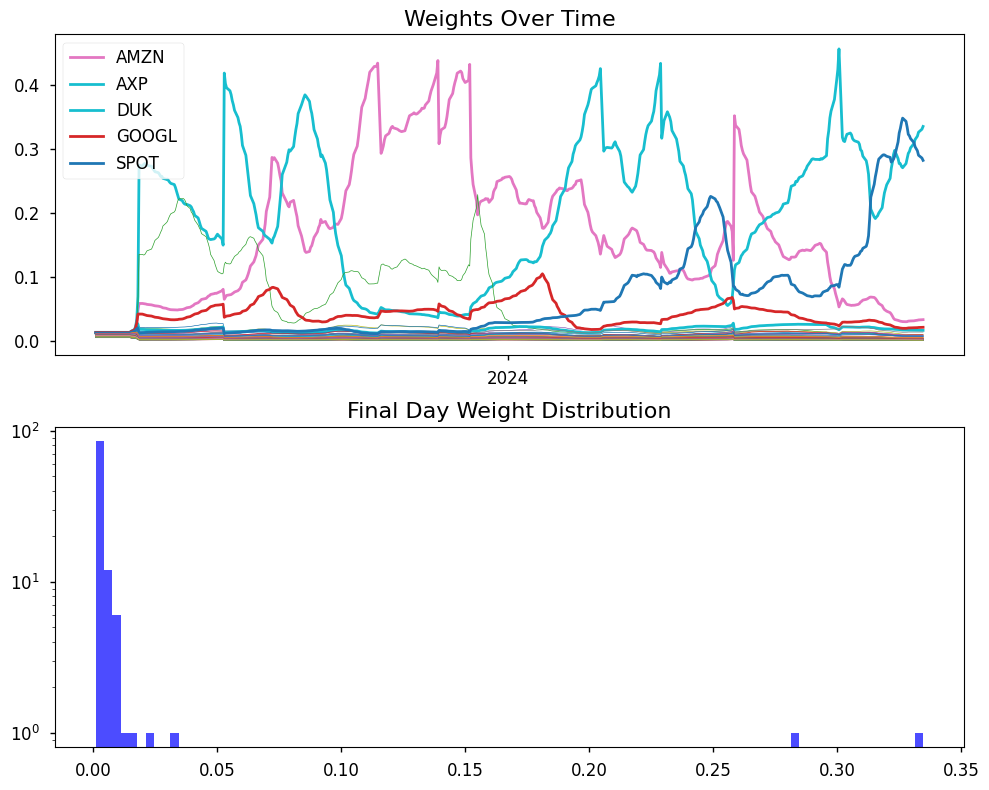

Sharpe: 0.07039438818414417
Max Drawdown: 0.12283775
FF3 Alpha: -5.2512423968375904e-05


In [ ]:
start = '2007-01-01'
end = '2025-01-01'
tickers = [
    "AAPL", "MSFT", "NVDA", "GOOGL", "AMZN", "META", "AVGO", "ORCL", "IBM", "CSCO",
    "JPM", "V", "MA", "GS", "MS", "BAC", "C", "AXP", "SCHW",
    "UNH", "JNJ", "LLY", "PFE", "MRNA", "BMY", "GILD", "CVS", "VRTX", "ISRG",
    "WMT", "NKE", "PG", "TGT", "COST", "KO", "PEP", "MCD", "SBUX", "YUM",
    "XOM", "CVX", "NEE", "DUK", "SO", "D", "ENB", "SLB", "EOG", "PSX",
    "DE", "LMT", "RTX", "BA", "CAT", "GE", "HON", "UPS", "EMR", "NOC",
    "PLD", "AMT", "EQIX", "O", "SPG", "VICI", "DLR", "WY", "EQR", "PSA",
    "TSLA", "FDX", "UPS", "GM", "F", "RIVN", "NIO", "CSX", "UNP", "DAL",
    "TSM", "ASML", "AMD", "TXN", "INTC", "MU", "QCOM", "LRCX", "NXPI", "ADI",
    "ADM", "BG", "CF", "TSN", "MOS", "FMC", "CAG", "SYY", "HRL", "MDLZ",
    "NFLX", "DIS", "PARA", "WBD", "CMCSA", "SPOT", "LYV", "TTWO", "EA",
    "GME", "AMC"
]

factor_df = (
    conn.raw_sql(
        f"""
            SELECT date, mktrf, smb, hml, rf
            FROM ff.factors_daily
            WHERE date BETWEEN '{start}' AND '{end}'
        """,
        date_cols='date'
    ).set_index('date')
    .replace([np.inf, -np.inf], np.nan)
    .fillna(0)
    .astype(float)
)

print(f"Accessing data from WRDS...")
stock_data = conn.raw_sql(
    f"""
    SELECT DISTINCT t1.ticker, t1.permno, t2.date, t2.ret
    FROM crsp.msenames t1, crsp.dsf t2
    WHERE t1.permno = t2.permno
    AND date BETWEEN '{start}' AND '{end}'
    AND t1.ticker IN ({', '.join([f"'{ticker}'" for ticker in tickers])})
""",
    date_cols=['date']
).set_index('date')

risk_free_data = conn.raw_sql(
    f"""
    SELECT date, rf
    FROM ff.factors_daily
    WHERE date BETWEEN '{start}' AND '{end}'
""",
    date_cols=['date']
).set_index('date')

returns = (
    stock_data.pivot_table(
        index = ['date'],
        columns = ['ticker'],
        values = ['ret'],
        fill_value = 0
    )['ret'].merge(
        risk_free_data, 
        left_index=True, 
        right_index=True, 
        how='left'
    )
    .replace([np.inf, -np.inf], np.nan)
    .fillna(0)
    .astype(float)
)
equal_weights = np.ones(returns.shape[1] - 1) / (returns.shape[1] - 1) 

sprtrn = conn.raw_sql(
    f"""
    SELECT caldt, sprtrn
    FROM crsp.dsbo
    WHERE caldt BETWEEN '{start}' AND '{end}'
""",
    date_cols=['caldt']
).set_index('caldt')

optimizer = OnlinePortfolioOptimizer(
    returns=returns,
    benchmark_returns={
        "S&P500": sprtrn.values,
    },    factor_data=factor_df
)
with warnings.catch_warnings():
    warnings.simplefilter("ignore", FutureWarning)
    ret_logs, weights_log = optimizer.run()

optimizer.plot_results()
print("Sharpe:", optimizer.evaluate_sharpe())
print("Max Drawdown:", optimizer.evaluate_max_drawdown())

alpha, model = optimizer.evaluate_alpha("FF3")
print("FF3 Alpha:", alpha)

In [16]:
all_ret_df = pd.read_csv('./crsp_dsf_2007_2025_with_ticker.csv')

In [17]:
start = '2023-01-01'
end = '2025-01-01'
all_ret_df['date'] = pd.to_datetime(all_ret_df['date'])
all_ret_df = all_ret_df[
    all_ret_df['date'] > np.datetime64(start)
]

all_ret_df

,date,permno,ret,ticker
31328374,2023-01-03,10026,0.011823,JJSF
31328375,2023-01-03,10028,0.000000,DGSE
31328376,2023-01-03,10028,0.000000,ELA
31328377,2023-01-03,10028,0.000000,DGC
31328378,2023-01-03,10032,0.009132,PLXS
...,...,...,...,...
35652864,2024-12-31,93426,0.010332,VPG
35652865,2024-12-31,93427,0.023841,FN
35652866,2024-12-31,93429,-0.002705,CBOE
35652867,2024-12-31,93434,-0.052195,SANW


In [18]:
risk_free_data = conn.raw_sql(
    f"""
    SELECT date, rf
    FROM ff.factors_daily
    WHERE date BETWEEN '{start}' AND '{end}'
""",
    date_cols=['date']
).set_index('date')

returns = (
    all_ret_df.pivot_table(
        index = ['date'],
        columns = ['ticker'],
        values = ['ret'],
        fill_value = 0
    )['ret'].merge(
        risk_free_data, 
        left_index=True, 
        right_index=True, 
        how='left'
    )
    .replace([np.inf, -np.inf], np.nan)
    .fillna(0)
    .astype(float)
)

In [34]:
import sys
sys.path.append('../src')

import importlib
import OnlinePortfolioOptimizer
importlib.reload(OnlinePortfolioOptimizer)

from OnlinePortfolioOptimizer import OnlinePortfolioOptimizer

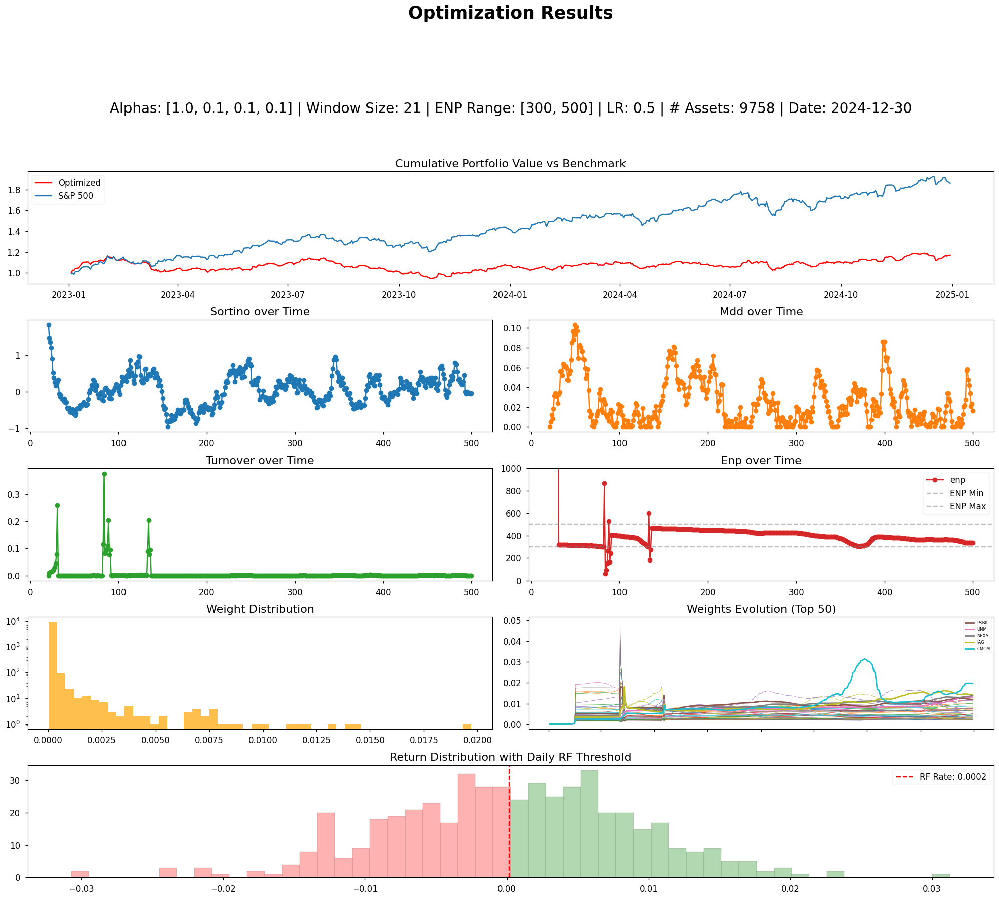

Optimization completed.


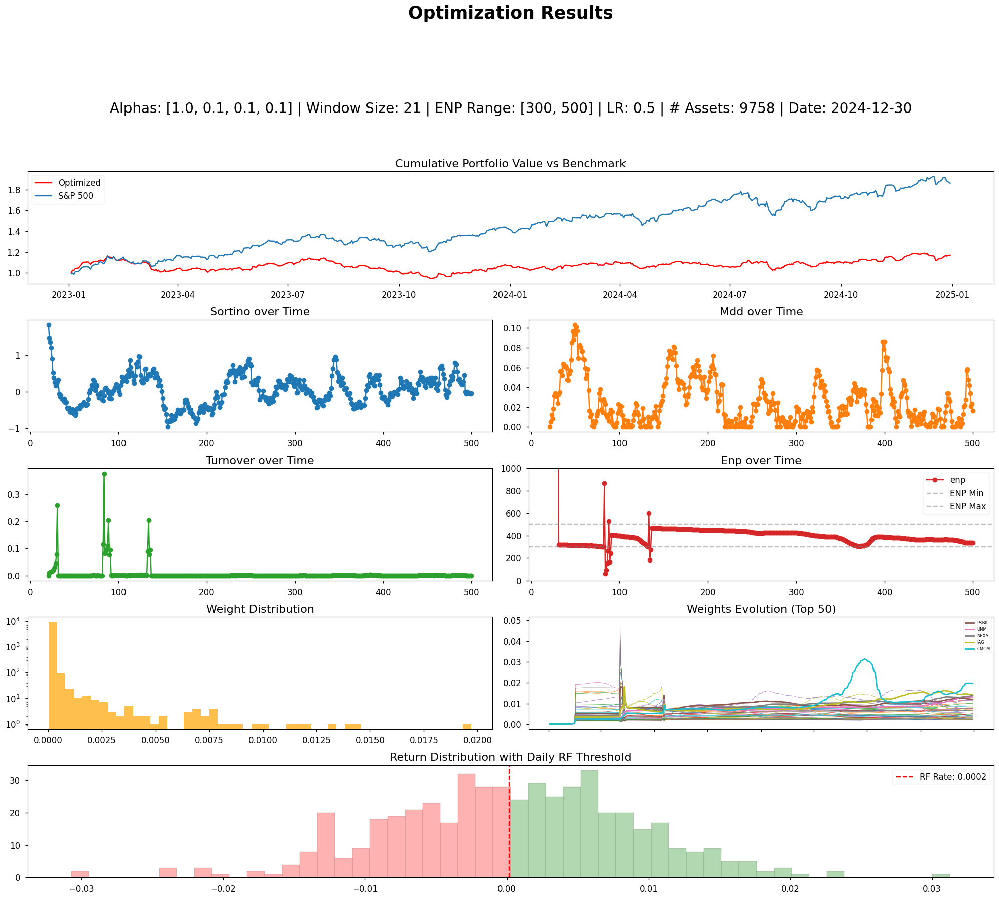

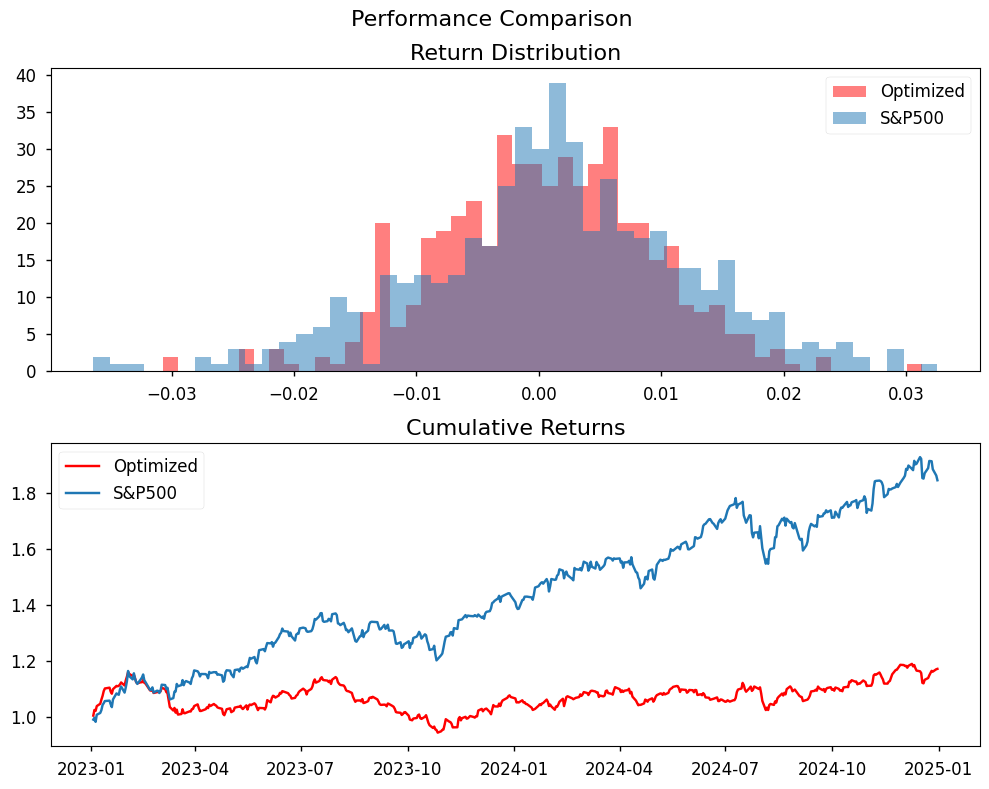

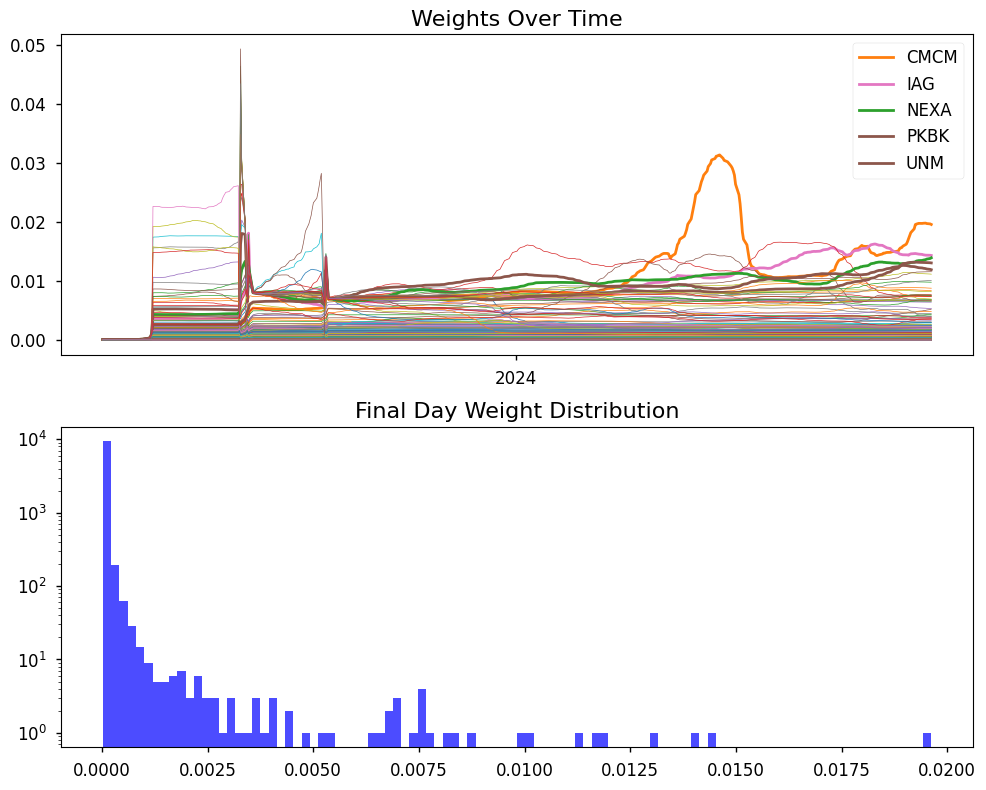

Sharpe: 0.01824285401702868
Max Drawdown: 0.1856155
FF3 Alpha: -0.00017175950981645352


In [ ]:
factor_df = (
    conn.raw_sql(
        f"""
            SELECT date, mktrf, smb, hml, rf
            FROM ff.factors_daily
            WHERE date BETWEEN '{start}' AND '{end}'
        """,
        date_cols='date'
    ).set_index('date')
    .replace([np.inf, -np.inf], np.nan)
    .fillna(0)
    .astype(float)
)

sprtrn = conn.raw_sql(
    f"""
    SELECT caldt, sprtrn
    FROM crsp.dsbo
    WHERE caldt BETWEEN '{start}' AND '{end}'
""",
    date_cols=['caldt']
).set_index('caldt')

optimizer = OnlinePortfolioOptimizer(
    returns=returns,
    benchmark_returns={
        "S&P500": sprtrn.values,
    },
    factor_data=factor_df,
    enp_min = 300,
    enp_max = 500,
    alphas = np.asarray([1, .1, .1, .1])
)
with warnings.catch_warnings():
    warnings.simplefilter("ignore", FutureWarning)
    ret_logs, weights_log = optimizer.run()

optimizer.plot_results()
print("Sharpe:", optimizer.evaluate_sharpe())
print("Max Drawdown:", optimizer.evaluate_max_drawdown())

alpha, model = optimizer.evaluate_alpha("FF3")
print("FF3 Alpha:", alpha)

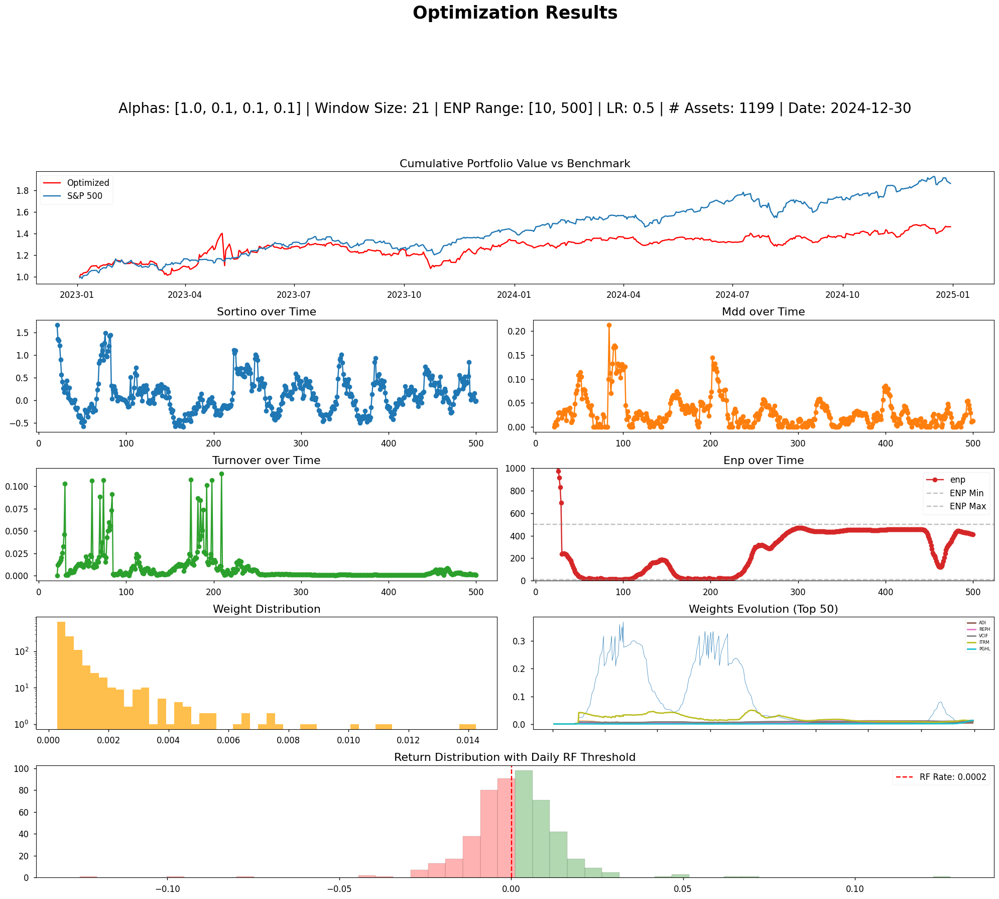

Optimization completed.


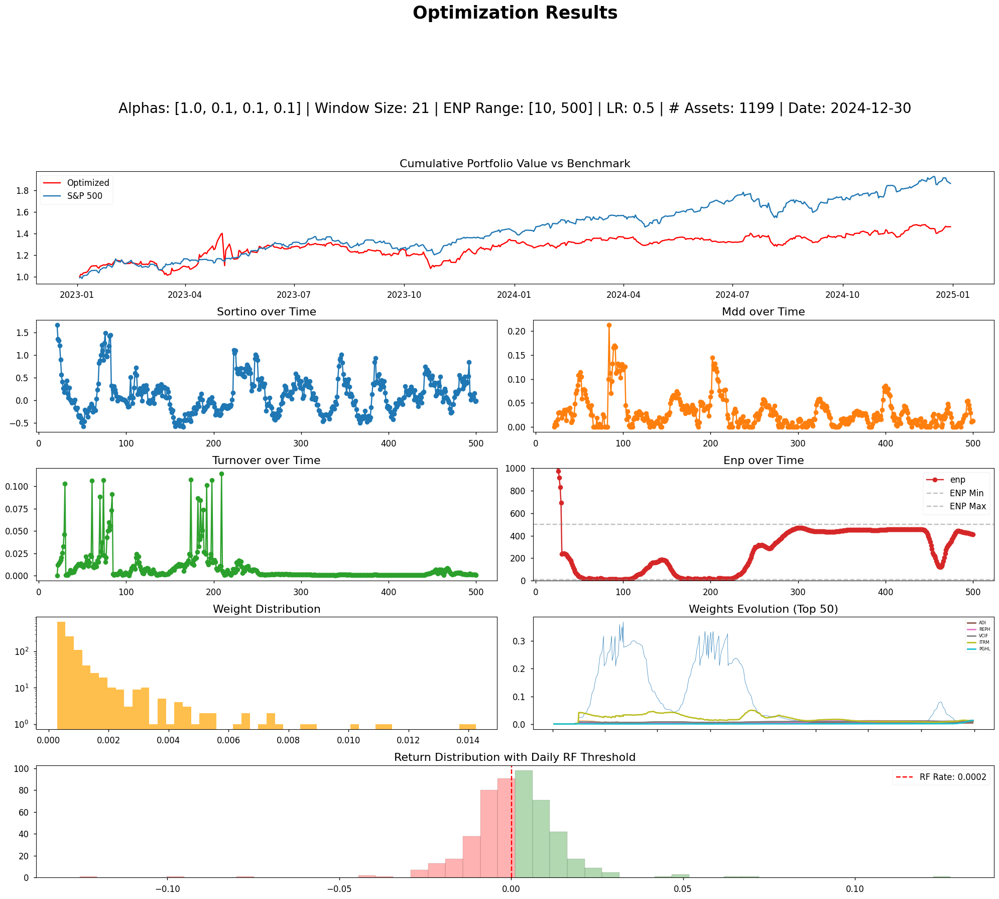

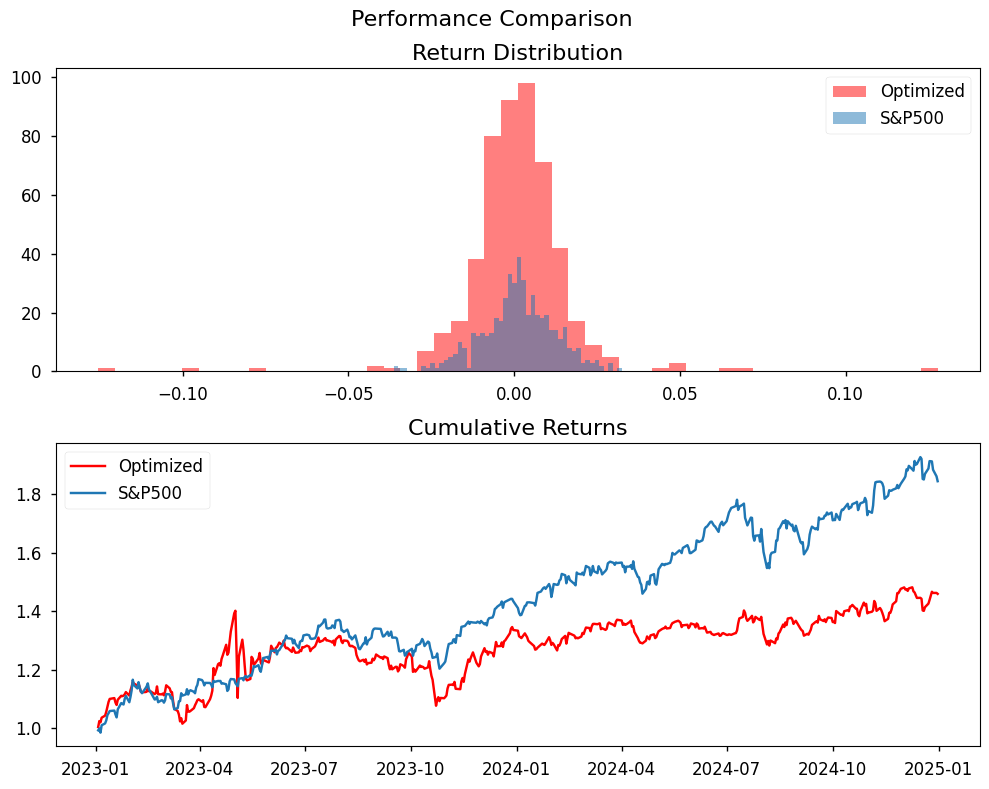

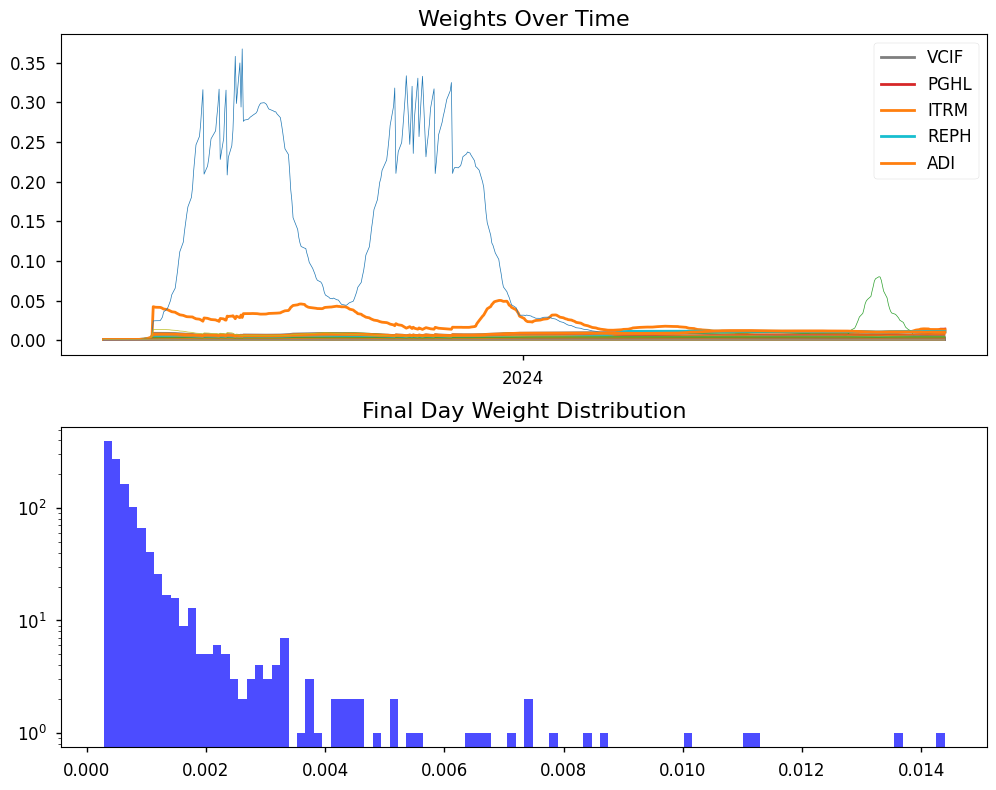

Sharpe: 0.043223179008059665
Max Drawdown: 0.23183438
FF3 Alpha: 0.00022635476219009214


In [ ]:
selected_assets = np.random.choice(
    returns.columns[:-1],
    size = 1199,
    replace=False
).tolist()
selected_assets.append('rf')

optimizer = OnlinePortfolioOptimizer(
    returns=returns[selected_assets],
    benchmark_returns={
        "S&P500": sprtrn.values,
    },
    factor_data=factor_df,
    enp_min = 10,
    enp_max = 500,
    alphas = np.asarray([1, .1, .1, .1])
)
with warnings.catch_warnings():
    warnings.simplefilter("ignore", FutureWarning)
    ret_logs, weights_log = optimizer.run()

optimizer.plot_results()
print("Sharpe:", optimizer.evaluate_sharpe())
print("Max Drawdown:", optimizer.evaluate_max_drawdown())

alpha, model = optimizer.evaluate_alpha("FF3")
print("FF3 Alpha:", alpha)

## 110 Stocks, 07-25 optimization

In [44]:
import sys
sys.path.append('../src')

import importlib
import OnlinePortfolioOptimizer
importlib.reload(OnlinePortfolioOptimizer)

from OnlinePortfolioOptimizer import OnlinePortfolioOptimizer

In [ ]:
start = '2007-01-01'
end = '2025-01-01'
tickers = [
    "AAPL", "MSFT", "NVDA", "GOOGL", "AMZN", "META", "AVGO", "ORCL", "IBM", "CSCO",
    "JPM", "V", "MA", "GS", "MS", "BAC", "C", "AXP", "SCHW",
    "UNH", "JNJ", "LLY", "PFE", "MRNA", "BMY", "GILD", "CVS", "VRTX", "ISRG",
    "WMT", "NKE", "PG", "TGT", "COST", "KO", "PEP", "MCD", "SBUX", "YUM",
    "XOM", "CVX", "NEE", "DUK", "SO", "D", "ENB", "SLB", "EOG", "PSX",
    "DE", "LMT", "RTX", "BA", "CAT", "GE", "HON", "UPS", "EMR", "NOC",
    "PLD", "AMT", "EQIX", "O", "SPG", "VICI", "DLR", "WY", "EQR", "PSA",
    "TSLA", "FDX", "UPS", "GM", "F", "RIVN", "NIO", "CSX", "UNP", "DAL",
    "TSM", "ASML", "AMD", "TXN", "INTC", "MU", "QCOM", "LRCX", "NXPI", "ADI",
    "ADM", "BG", "CF", "TSN", "MOS", "FMC", "CAG", "SYY", "HRL", "MDLZ",
    "NFLX", "DIS", "PARA", "WBD", "CMCSA", "SPOT", "LYV", "TTWO", "EA",
    "GME", "AMC"
]

factor_df = (
    conn.raw_sql(
        f"""
            SELECT date, mktrf, smb, hml, rf
            FROM ff.factors_daily
            WHERE date BETWEEN '{start}' AND '{end}'
        """,
        date_cols='date'
    ).set_index('date')
    .replace([np.inf, -np.inf], np.nan)
    .fillna(0)
    .astype(float)
)

print(f"Accessing data from WRDS...")
stock_data = conn.raw_sql(
    f"""
    SELECT DISTINCT t1.ticker, t1.permno, t2.date, t2.ret
    FROM crsp.msenames t1, crsp.dsf t2
    WHERE t1.permno = t2.permno
    AND date BETWEEN '{start}' AND '{end}'
    AND t1.ticker IN ({', '.join([f"'{ticker}'" for ticker in tickers])})
""",
    date_cols=['date']
).set_index('date')

risk_free_data = conn.raw_sql(
    f"""
    SELECT date, rf
    FROM ff.factors_daily
    WHERE date BETWEEN '{start}' AND '{end}'
""",
    date_cols=['date']
).set_index('date')

returns = (
    stock_data.pivot_table(
        index = ['date'],
        columns = ['ticker'],
        values = ['ret'],
        fill_value = 0
    )['ret'].merge(
        risk_free_data, 
        left_index=True, 
        right_index=True, 
        how='left'
    )
    .replace([np.inf, -np.inf], np.nan)
    .fillna(0)
    .astype(float)
)
equal_weights = np.ones(returns.shape[1] - 1) / (returns.shape[1] - 1) 

sprtrn = conn.raw_sql(
    f"""
    SELECT caldt, sprtrn
    FROM crsp.dsbo
    WHERE caldt BETWEEN '{start}' AND '{end}'
""",
    date_cols=['caldt']
).set_index('caldt')


Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/Users/fanghema/.pyenv/versions/3.11.7/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3508, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/var/folders/sp/cw_2m19j25xbvgpdjz48gclh0000gn/T/ipykernel_85624/1393536104.py", line 11, in <module>
    ret_logs, weights_log = optimizer.run()
                            ^^^^^^^^^^^^^^^
  File "/Users/fanghema/Desktop/aaSTAT_4830/STAT-4830-project-base/notebooks/../src/OnlinePortfolioOptimizer.py", line 139, in run
    self._update_live_plot(i)
  File "/Users/fanghema/Desktop/aaSTAT_4830/STAT-4830-project-base/notebooks/../src/OnlinePortfolioOptimizer.py", line 356, in _update_live_plot
    plt.tight_layout()
  File "/Users/fanghema/.pyenv/versions/3.11.7/lib/python3.11/site-packages/matplotlib/pyplot.py", line 2801, in tight_layout
    gcf().tight_layout(pad=pad, h_pad=h_pad, w_pad=w_pad, rect=rect)
  File "/Users/fanghema/.pyenv/versions/3.11.7/lib/pyth

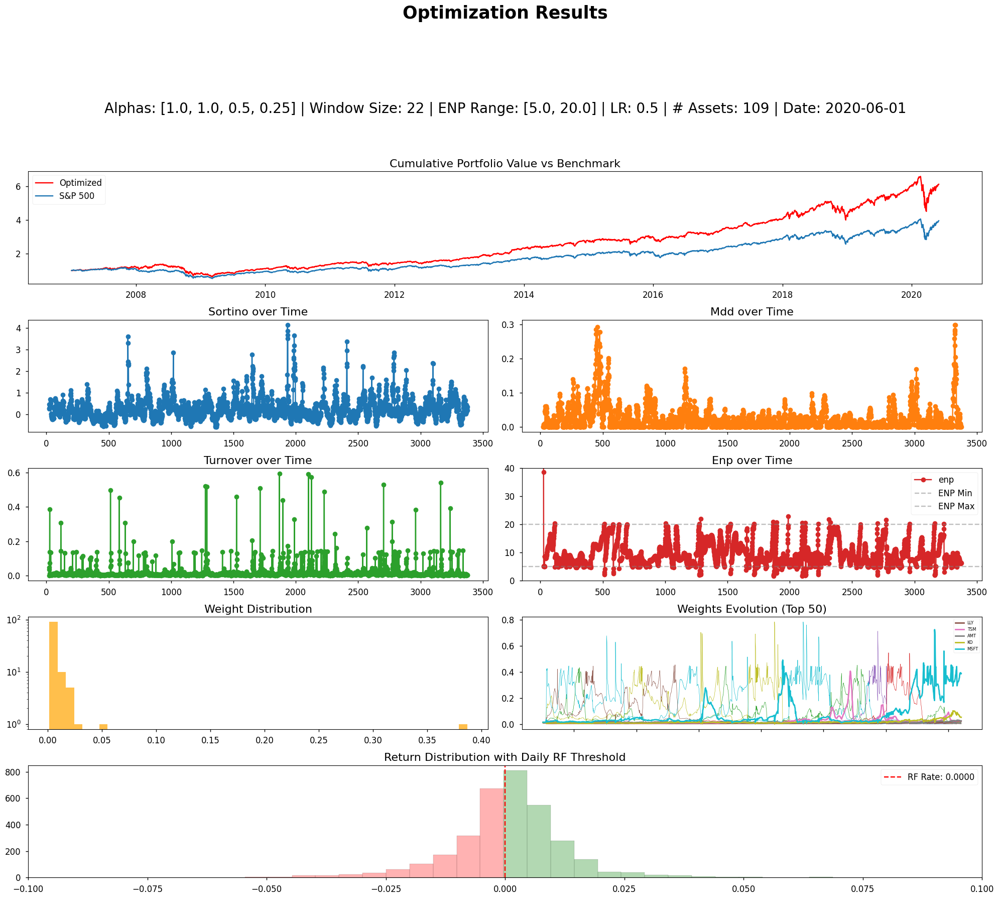

In [ ]:
optimizer = OnlinePortfolioOptimizer(
    returns=returns,
    benchmark_returns={
        "S&P500": sprtrn.values,
    },    
    factor_data=factor_df,
    window_size=22
)
with warnings.catch_warnings():
    warnings.simplefilter("ignore", FutureWarning)
    ret_logs, weights_log = optimizer.run()

optimizer.plot_results()
print("Sharpe:", optimizer.evaluate_sharpe())
print("Max Drawdown:", optimizer.evaluate_max_drawdown())

alpha, model = optimizer.evaluate_alpha("FF3")
print("FF3 Alpha:", alpha)

## Latest objective function 

We **maximize** a weighted objective function comprising of sortino ratio, max drawdown , turnover, and concentration penalty:

$$
\max_{\mathbf{w}_t} \quad \alpha_1 \cdot S(\mathbf{w}_t) - \alpha_2 \cdot D(\mathbf{w}_t) - \alpha_3 \cdot T(\mathbf{w}_t, \mathbf{w}_{t-1}) - \alpha_4 \cdot C(\mathbf{w}_t)
$$

where:
- $ \mathbf{w}_t \in \mathbb{R}^N $: portfolio weights at time $ t $  
- $ \mathbf{r}_t \in \mathbb{R}^N $: asset returns at time $ t $  
- $ r_{f,t} \in \mathbb{R} $: risk-free rate at time $ t $  
- $ \alpha_1, \alpha_2, \alpha_3, \alpha_4 $: user-defined weights for each objective term  
- $ \varepsilon > 0 $: small constant for numerical stability  


Sortino Ratio (Risk-Adjusted Return)

$$
S(\mathbf{w}_t) = \frac{\mathbb{E}[\mathbf{w}_t^\top \mathbf{r}_t - r_{f,t}]}{\sqrt{\mathbb{E}[\min(\mathbf{w}_t^\top \mathbf{r}_t - r_{f,t}, 0)^2] + \varepsilon}}
$$


Maximum Drawdown

Let cumulative returns be:

$$
R_t = \prod_{s=1}^t (1 + \mathbf{w}_s^\top \mathbf{r}_s)
$$

Then:

$$
D(\mathbf{w}_t) = \frac{\max_{s \leq t} R_s - R_t}{\max_{s \leq t} R_s + \varepsilon}
$$

Turnover Penalty

$$
T(\mathbf{w}_t, \mathbf{w}_{t-1}) = \frac{1}{2} \sum_{i=1}^N |w_{i,t} - w_{i,t-1}|
$$

Concentration Penalty

Let the Herfindahl-Hirschman Index (HHI) be:

$$
\text{HHI}(\mathbf{w}_t) = \sum_{i=1}^N w_{i,t}^2
$$

Define the Effective Number of Positions (ENP) as:

$$
\text{ENP} = \frac{1}{\text{HHI} + \varepsilon}
$$

Then:

$$
C(\mathbf{w}_t) = \max(0, \text{ENP}_{\min} - \text{ENP}) + \max(0, \text{ENP} - \text{ENP}_{\max})
$$

## Grid search

In [ ]:
import sys
sys.path.append('../src')

import importlib
import OnlinePortfolioOptimizer
importlib.reload(OnlinePortfolioOptimizer)

from OnlinePortfolioOptimizer import OnlinePortfolioOptimizer

In [ ]:
start = '2007-01-01'
end = '2025-01-01'
tickers = [
    "AAPL", "MSFT", "NVDA", "GOOGL", "AMZN", "META", "AVGO", "ORCL", "IBM", "CSCO",
    "JPM", "V", "MA", "GS", "MS", "BAC", "C", "AXP", "SCHW",
    "UNH", "JNJ", "LLY", "PFE", "MRNA", "BMY", "GILD", "CVS", "VRTX", "ISRG",
    "WMT", "NKE", "PG", "TGT", "COST", "KO", "PEP", "MCD", "SBUX", "YUM",
    "XOM", "CVX", "NEE", "DUK", "SO", "D", "ENB", "SLB", "EOG", "PSX",
    "DE", "LMT", "RTX", "BA", "CAT", "GE", "HON", "UPS", "EMR", "NOC",
    "PLD", "AMT", "EQIX", "O", "SPG", "VICI", "DLR", "WY", "EQR", "PSA",
    "TSLA", "FDX", "UPS", "GM", "F", "RIVN", "NIO", "CSX", "UNP", "DAL",
    "TSM", "ASML", "AMD", "TXN", "INTC", "MU", "QCOM", "LRCX", "NXPI", "ADI",
    "ADM", "BG", "CF", "TSN", "MOS", "FMC", "CAG", "SYY", "HRL", "MDLZ",
    "NFLX", "DIS", "PARA", "WBD", "CMCSA", "SPOT", "LYV", "TTWO", "EA",
    "GME", "AMC"
]

factor_df = (
    conn.raw_sql(
        f"""
            SELECT date, mktrf, smb, hml, rf
            FROM ff.factors_daily
            WHERE date BETWEEN '{start}' AND '{end}'
        """,
        date_cols='date'
    ).set_index('date')
    .replace([np.inf, -np.inf], np.nan)
    .fillna(0)
    .astype(float)
)

print(f"Accessing data from WRDS...")
stock_data = conn.raw_sql(
    f"""
    SELECT DISTINCT t1.ticker, t1.permno, t2.date, t2.ret
    FROM crsp.msenames t1, crsp.dsf t2
    WHERE t1.permno = t2.permno
    AND date BETWEEN '{start}' AND '{end}'
    AND t1.ticker IN ({', '.join([f"'{ticker}'" for ticker in tickers])})
""",
    date_cols=['date']
).set_index('date')

risk_free_data = conn.raw_sql(
    f"""
    SELECT date, rf
    FROM ff.factors_daily
    WHERE date BETWEEN '{start}' AND '{end}'
""",
    date_cols=['date']
).set_index('date')

returns = (
    stock_data.pivot_table(
        index = ['date'],
        columns = ['ticker'],
        values = ['ret'],
        fill_value = 0
    )['ret'].merge(
        risk_free_data,
        left_index=True,
        right_index=True,
        how='left'
    )
    .replace([np.inf, -np.inf], np.nan)
    .fillna(0)
    .astype(float)
)
equal_weights = np.ones(returns.shape[1] - 1) / (returns.shape[1] - 1)

sprtrn = conn.raw_sql(
    f"""
    SELECT caldt, sprtrn
    FROM crsp.dsbo
    WHERE caldt BETWEEN '{start}' AND '{end}'
""",
    date_cols=['caldt']
).set_index('caldt')

Accessing data from WRDS...


In [ ]:
train_mask = returns.index < np.datetime64('2009-12-31')
returns_subset = returns[train_mask]
sprtrn_subset = sprtrn[train_mask]

In [ ]:
search_space = [
    Integer(10, 255, name='window_size'),           # Around 0.5 - 3 months
    Real(0.01, 1.0, name='lr'),                    # Learning rate
    Real(0.1, 10.0, name='alpha_1'),               # 2nd alpha
    Real(0.1, 10.0, name='alpha_2'),               # 3rd alpha
    Real(0.1, 10.0, name='alpha_3'),               # 4th alpha
]

In [ ]:
@use_named_args(search_space)
def objective(window_size, lr, alpha_1, alpha_2, alpha_3):
    alphas = np.asarray([1.0, alpha_1, alpha_2, alpha_3])
    optimizer = OnlinePortfolioOptimizer(
        returns=returns_subset,
        benchmark_returns={"S&P500": sprtrn_subset.values},
        factor_data=factor_df,
        window_size=window_size,
        alphas=alphas,
        lr=lr,
        enp_min = 10,
        enp_max = 500
    )
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", FutureWarning)
        _, _ = optimizer.run(plot_live_results=False)

    sortino = optimizer.evaluate_sortino()
    print(f"Sortino: {sortino}")
    return -sortino

In [ ]:
result = gp_minimize(
    func=objective,
    dimensions=search_space,
    n_calls=30,         # You can increase this depending on compute
    n_initial_points=5, # Random samples before using GP
    random_state=42
)

Streaming output truncated to the last 5000 lines.
Processing 2008-03-12 00:00:00 (299 / 755)
Processing 2008-03-13 00:00:00 (300 / 755)
Processing 2008-03-14 00:00:00 (301 / 755)
Processing 2008-03-17 00:00:00 (302 / 755)
Processing 2008-03-18 00:00:00 (303 / 755)
Processing 2008-03-19 00:00:00 (304 / 755)
Processing 2008-03-20 00:00:00 (305 / 755)
Processing 2008-03-24 00:00:00 (306 / 755)
Processing 2008-03-25 00:00:00 (307 / 755)
Processing 2008-03-26 00:00:00 (308 / 755)
Processing 2008-03-27 00:00:00 (309 / 755)
Processing 2008-03-28 00:00:00 (310 / 755)
Processing 2008-03-31 00:00:00 (311 / 755)
Processing 2008-04-01 00:00:00 (312 / 755)
Processing 2008-04-02 00:00:00 (313 / 755)
Processing 2008-04-03 00:00:00 (314 / 755)
Processing 2008-04-04 00:00:00 (315 / 755)
Processing 2008-04-07 00:00:00 (316 / 755)
Processing 2008-04-08 00:00:00 (317 / 755)
Processing 2008-04-09 00:00:00 (318 / 755)
Processing 2008-04-10 00:00:00 (319 / 755)
Processing 2008-04-11 00:00:00 (320 / 755)
Pro

/content/OnlinePortfolioOptimizer.py:80: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  self.fig = plt.figure(figsize=(20, 18))


Streaming output truncated to the last 5000 lines.
Processing 2008-03-12 00:00:00 (299 / 755)
Processing 2008-03-13 00:00:00 (300 / 755)
Processing 2008-03-14 00:00:00 (301 / 755)
Processing 2008-03-17 00:00:00 (302 / 755)
Processing 2008-03-18 00:00:00 (303 / 755)
Processing 2008-03-19 00:00:00 (304 / 755)
Processing 2008-03-20 00:00:00 (305 / 755)
Processing 2008-03-24 00:00:00 (306 / 755)
Processing 2008-03-25 00:00:00 (307 / 755)
Processing 2008-03-26 00:00:00 (308 / 755)
Processing 2008-03-27 00:00:00 (309 / 755)
Processing 2008-03-28 00:00:00 (310 / 755)
Processing 2008-03-31 00:00:00 (311 / 755)
Processing 2008-04-01 00:00:00 (312 / 755)
Processing 2008-04-02 00:00:00 (313 / 755)
Processing 2008-04-03 00:00:00 (314 / 755)
Processing 2008-04-04 00:00:00 (315 / 755)
Processing 2008-04-07 00:00:00 (316 / 755)
Processing 2008-04-08 00:00:00 (317 / 755)
Processing 2008-04-09 00:00:00 (318 / 755)
Processing 2008-04-10 00:00:00 (319 / 755)
Processing 2008-04-11 00:00:00 (320 / 755)
Pro

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

<Figure size 2000x1800 with 0 Axes>

In [ ]:
best_window_size = result.x[0]
best_lr = result.x[1]
best_alpha_1 = result.x[2]
best_alpha_2 = result.x[3]
best_alpha_3 = result.x[4]

best_sortino = -result.fun

print(f" Optimal Hyperparameters:")
print(f"Window Size     : {best_window_size}")
print(f"Learning Rate   : {best_lr:.4f}")
print(f"Alpha Weights   : [1.0, {best_alpha_1:.3f}, {best_alpha_2:.3f}, {best_alpha_3:.3f}]")
print(f"Best Sortino    : {best_sortino:.4f}")

 Optimal Hyperparameters:
Window Size     : 181
Learning Rate   : 0.8655
Alpha Weights   : [1.0, 6.080, 0.935, 5.154]
Best Sortino    : 0.0958


Processing 2007-01-03 00:00:00 (0 / 4530)
Processing 2007-01-04 00:00:00 (1 / 4530)
Processing 2007-01-05 00:00:00 (2 / 4530)
Processing 2007-01-08 00:00:00 (3 / 4530)
Processing 2007-01-09 00:00:00 (4 / 4530)
Processing 2007-01-10 00:00:00 (5 / 4530)
Processing 2007-01-11 00:00:00 (6 / 4530)
Processing 2007-01-12 00:00:00 (7 / 4530)
Processing 2007-01-16 00:00:00 (8 / 4530)
Processing 2007-01-17 00:00:00 (9 / 4530)
Processing 2007-01-18 00:00:00 (10 / 4530)
Processing 2007-01-19 00:00:00 (11 / 4530)
Processing 2007-01-22 00:00:00 (12 / 4530)
Processing 2007-01-23 00:00:00 (13 / 4530)
Processing 2007-01-24 00:00:00 (14 / 4530)
Processing 2007-01-25 00:00:00 (15 / 4530)
Processing 2007-01-26 00:00:00 (16 / 4530)
Processing 2007-01-29 00:00:00 (17 / 4530)
Processing 2007-01-30 00:00:00 (18 / 4530)
Processing 2007-01-31 00:00:00 (19 / 4530)
Processing 2007-02-01 00:00:00 (20 / 4530)
Processing 2007-02-02 00:00:00 (21 / 4530)
Processing 2007-02-05 00:00:00 (22 / 4530)
Processing 2007-02-06

<Figure size 2000x1800 with 0 Axes>

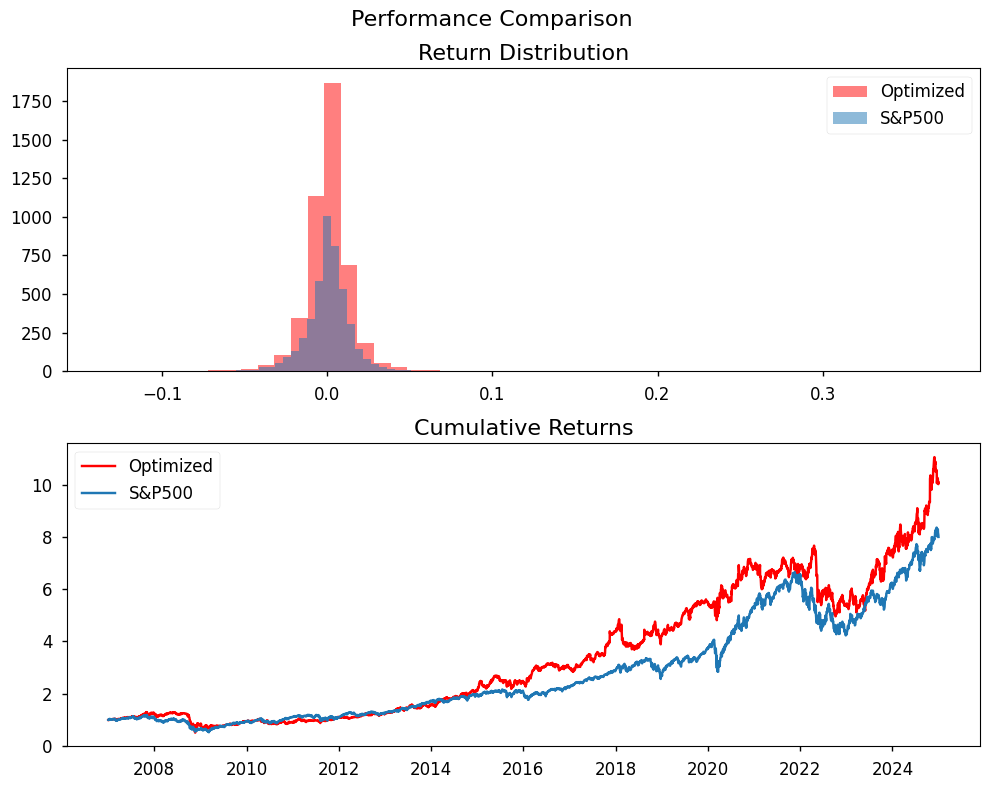

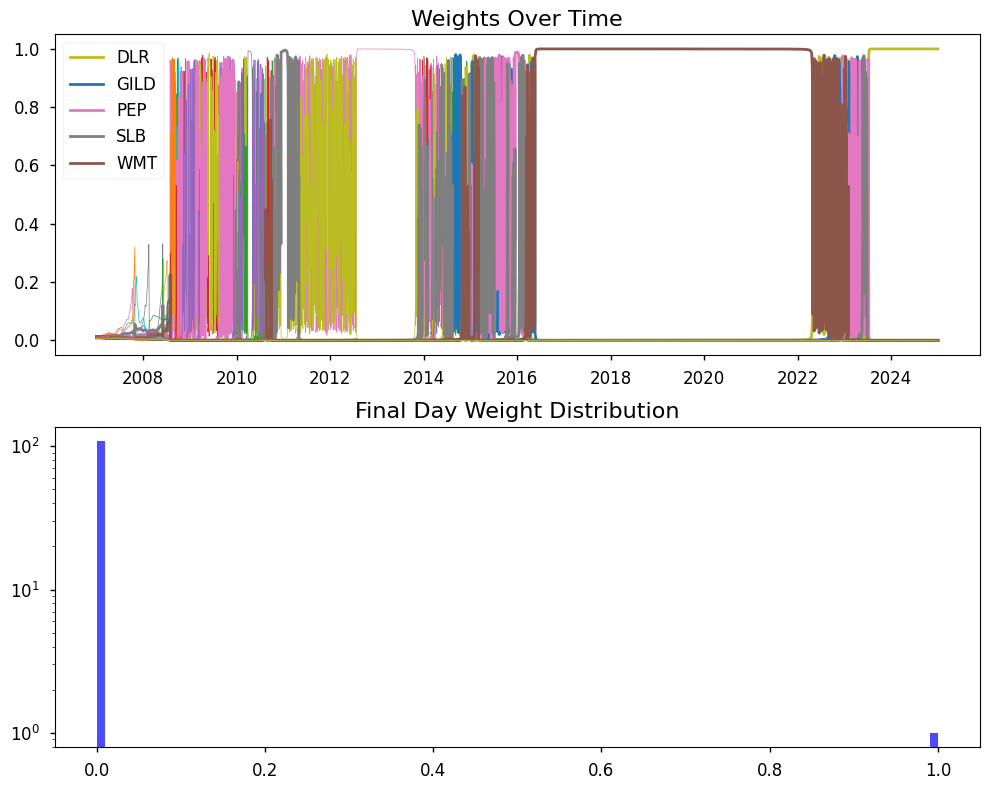

Sharpe: 0.036277072849468725
Max Drawdown: 0.6060645
FF3 Alpha: 0.00028164862335184373


In [ ]:
optimizer = OnlinePortfolioOptimizer(
    returns=returns,
    benchmark_returns={
        "S&P500": sprtrn.values,
    },
    factor_data=factor_df,
    window_size=24,
    alphas = np.asarray([1, 6.080, 0.935, 5.154]),
    lr = 0.8655,
    enp_min = 10,
    enp_max = 500
)

with warnings.catch_warnings():
    warnings.simplefilter("ignore", FutureWarning)
    ret_logs, weights_log = optimizer.run(plot_live_results=False)

optimizer.plot_results()
print("Sharpe:", optimizer.evaluate_sharpe())
print("Max Drawdown:", optimizer.evaluate_max_drawdown())

alpha, model = optimizer.evaluate_alpha("FF3")
print("FF3 Alpha:", alpha)

In [ ]:
def plot_final_dashboard(optimizer):
    """
    Reproduces the final optimization visualization using the final timestep data
    from a completed optimizer instance.
    """
    import matplotlib.pyplot as plt
    import numpy as np

    i = len(optimizer.return_logs) - 1  # final timestep
    fig = plt.figure(figsize=(18, 16))
    fig.clf()
    gs = fig.add_gridspec(6, 2)

    # Title + Hyperparams Text
    ax_title = fig.add_subplot(gs[0, :])
    ax_title.axis('off')
    ax_title.set_title("Optimization Results (Final)", fontsize=25, weight='bold')
    summary = (
        f"Alphas: {optimizer.alphas.tolist()} | "
        f"Window Size: {optimizer.window_size} | "
        f"ENP Range: [{optimizer.enp_min}, {optimizer.enp_max}] | "
        f"LR: {optimizer.lr} | # Assets: {optimizer.n_assets} | "
        f"Date: {optimizer.returns.index[i].strftime('%Y-%m-%d')}"
    )
    ax_title.text(0.5, 0.2, summary, ha='center', fontsize=20)

    # Cumulative Return Comparison
    ax_cumret = fig.add_subplot(gs[1, :])
    cum_returns = (optimizer.return_logs[:i+1].numpy() + 1).cumprod()
    ax_cumret.plot(optimizer.returns.index[:i+1], cum_returns, label="Optimized", color="red")
    if "S&P500" in optimizer.benchmark_returns:
        spx = (optimizer.benchmark_returns["S&P500"][:i+1] + 1).cumprod()
        ax_cumret.plot(optimizer.returns.index[:i+1], spx, label="S&P 500", color="C0")
    ax_cumret.set_title("Cumulative Portfolio Value vs Benchmark")
    ax_cumret.legend()

    # Loss Components Grid (2x2)
    keys = list(optimizer.loss_history.keys())
    for idx, key in enumerate(keys):
        ax = fig.add_subplot(gs[2 + idx // 2, idx % 2])
        ax.plot(optimizer.loss_history[key][:i+1], label=key, color=f"C{idx}")
        ax.set_title(f"{key.capitalize()} over Time")
        if key == "enp":
            if optimizer.loss_history[key][i] <= optimizer.enp_max + 5:
                ax.set_ylim(0, optimizer.enp_max + 5)
            ax.axhline(optimizer.enp_min, linestyle='--', color='gray', alpha=0.5, label="ENP Min")
            ax.axhline(optimizer.enp_max, linestyle='--', color='gray', alpha=0.5, label="ENP Max")
            ax.legend()

    # Weights Distribution (left)
    ax_weights_dist = fig.add_subplot(gs[4, 0])
    ax_weights_dist.hist(
        optimizer.weights_log[i].detach().numpy(),
        bins=50,
        color='orange',
        alpha=0.7,
        log=(optimizer.n_assets > 99)
    )
    ax_weights_dist.set_title("Weight Distribution")

    # Weights Evolution (right)
    ax_weights = fig.add_subplot(gs[4, 1])
    weights_np = optimizer.weights_log[:i+1].detach().numpy()
    final_weights = weights_np[-1]
    top_50 = np.argsort(final_weights)[-50:]
    top_5 = top_50[-5:]
    for idx in top_50:
        label = optimizer.returns.columns[idx] if idx in top_5 else None
        lw = 2 if idx in top_5 else 0.5
        ax_weights.plot(optimizer.returns.index[:i+1], weights_np[:, idx], label=label, linewidth=lw)
    if len(top_5) > 0:
        ax_weights.legend(fontsize=6)
    ax_weights.set_title("Weights Evolution (Top 50)")
    ax_weights.set_xticklabels([])

    # Return Distribution (bottom full-width)
    ax_ret_dist = fig.add_subplot(gs[5, :])
    rets = optimizer.return_logs[:i+1].numpy()
    rf_today = optimizer.rf.iloc[i] if hasattr(optimizer, "rf") else 0.0
    bins = 50
    hist, bin_edges = np.histogram(rets, bins=bins)
    bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
    bar_colors = ['red' if center < rf_today else 'green' for center in bin_centers]

    ax_ret_dist.bar(
        bin_centers,
        hist,
        width=(bin_edges[1] - bin_edges[0]),
        color=bar_colors,
        edgecolor='black',
        alpha=0.3
    )
    ax_ret_dist.axvline(
        rf_today,
        color='red',
        linestyle='--',
        label=f'RF Rate: {rf_today:.4f}'
    )
    ax_ret_dist.set_title("Return Distribution with Daily RF Threshold")
    ax_ret_dist.set_xlim(-0.1, 0.1)
    ax_ret_dist.legend()

    plt.tight_layout()
    plt.show()

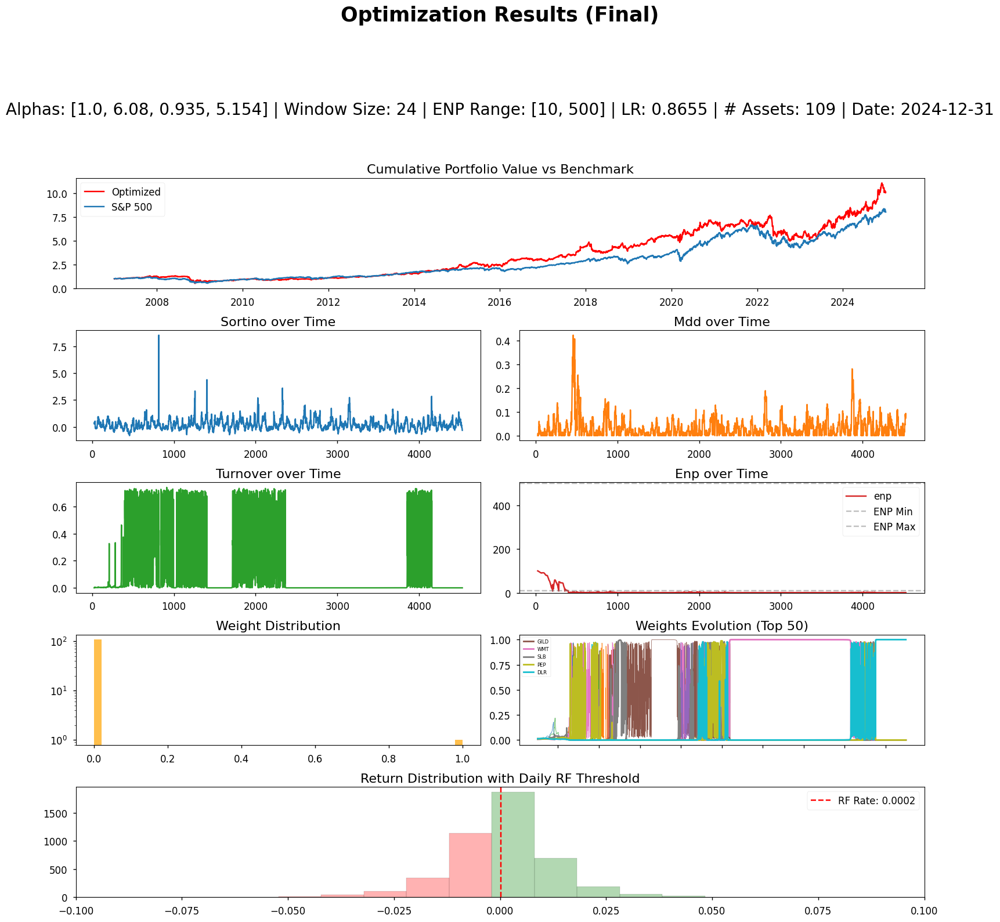

In [ ]:
plot_final_dashboard(optimizer)